In [188]:
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from sklearn.metrics.pairwise import cosine_distances
from sentence_transformers import SentenceTransformer
import torch
from torch import nn
from torch.utils.data import DataLoader, TensorDataset
from scipy.sparse import csr_matrix
import datasketch  # MinHash & LSH
import re
from collections import defaultdict
from numpy import triu
import IPython.display as display


from gensim.models import KeyedVectors
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff

from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [108]:
# loading the data using pandas' read_json file.
data = pd.read_json('tops_fashion.json')

In [109]:
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 19


In [110]:
# each product/item has 19 features in the raw dataset.
data.columns # prints column-names or feature-names.

Index(['sku', 'asin', 'product_type_name', 'formatted_price', 'author',
       'color', 'brand', 'publisher', 'availability', 'reviews',
       'large_image_url', 'availability_type', 'small_image_url',
       'editorial_review', 'title', 'model', 'medium_image_url',
       'manufacturer', 'editorial_reivew'],
      dtype='object')

In [111]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [112]:
print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head() # prints the top rows in the table.

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


In [113]:
print(data['product_type_name'].describe())

count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object


In [114]:
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [115]:
# find the 10 most frequent product_type_names.
product_type_count = Counter(list(data['product_type_name']))
product_type_count.most_common(10)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425)]

In [116]:
print(data['brand'].describe())
# 183138 - 182987 = 151 missing values.

count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object


In [117]:
brand_count = Counter(list(data['brand']))
brand_count.most_common(10)

[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187)]

In [118]:
print(data['color'].describe())

count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [119]:
color_count = Counter(list(data['color']))
color_count.most_common(10)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203)]

###  we have 7380 unique colors
### 7.2% of products are black in color
### 64956 of 183138 products have brand information. That's approx 35.4%.

In [120]:
print(data['formatted_price'].describe())

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [121]:
price_count = Counter(list(data['formatted_price']))
price_count.most_common(10)

[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336)]

In [122]:
print(data['title'].describe())

count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object


### All of the products have a title. 
### Titles are fairly descriptive of what the product is

In [123]:
# data.to_pickle('pickels/180k_apparel_data')

In [124]:
# consider products which have price information
# data['formatted_price'].isnull() => gives the information 
#about the dataframe row's which have null values price == None|Null
data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

Number of data points After eliminating price=NULL : 28395


In [125]:
# consider products which have color information
# data['color'].isnull() => gives the information about the dataframe row's which have null values price == None|Null
data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

Number of data points After eliminating color=NULL : 28385


In [126]:
# data.to_pickle('pickels/28k_apparel_data')

In [127]:
# read data from pickle file from previous stage
#data = pd.read_pickle('pickels/28k_apparel_data')

# find number of products that have duplicate titles.
print(sum(data.duplicated('title')))

2325


###  we have 2325 products which have same title but different color

## Remove duplicates : Part 1

In [128]:
# read data from pickle file from previous stage
#data = pd.read_pickle('pickels/28k_apparel_data')
#data.head()

In [129]:
# Remove All products with very few words in title
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [130]:
# Sort the whole data based on title (alphabetical order of title) 
data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


#### Some examples of dupliacte titles that differ only in the last few words.

In [131]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [132]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = data['title'].loc[indices[i]].split()

    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = data['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])

            # if the comaprision between is between num_data_points, num_data_points-1 strings and they differ in more than 2 words we include both
            if j == num_data_points-1: stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[j]])

            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [133]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]

#### We removed  the dupliactes which differ only at the end.

In [134]:
print('Number of data points : ', data.shape[0])

Number of data points :  17593


In [135]:
# data.to_pickle('pickels/17k_apperal_data')

### Remove duplicates : Part 2

In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt

In [136]:
# data = pd.read_pickle('pickels/17k_apperal_data')

In [137]:


"""

# Sample Data (Replace this with actual dataset loading)
# data = pd.read_csv("your_data.csv")

# Inverted Index Construction
inverted_index = defaultdict(set)
title_dict = {}  # Store titles for quick lookup
asin_dict = {}   # Store ASINs for quick lookup

# Build the inverted index
for i, row in data.iterrows():
    words = set(row['title'].lower().split())  # Convert to lowercase & unique words
    title_dict[i] = words  # Store title words for quick lookup
    asin_dict[i] = row['asin']  # Store ASIN for quick lookup
    
    for word in words:
        inverted_index[word].add(i)  # Map word to index

# Step 2: Deduplication using Set Intersections
considered_asins = set()
stage2_dedupe_asins = []

for i in range(len(data)):
    if i in considered_asins:
        continue  # Skip already processed items

    stage2_dedupe_asins.append(asin_dict[i])  # Add ASIN of non-duplicate item
    considered_asins.add(i)

    # Get candidate duplicates using the inverted index
    candidate_indices = set()
    for word in title_dict[i]:  # For each word in the title
        candidate_indices.update(inverted_index[word])  # Retrieve matching docs

    # Refine the candidate set
    for j in candidate_indices:
        if j != i and j not in considered_asins:
            # Compare sets instead of looping over words
            common_words = title_dict[i].intersection(title_dict[j])
            length = max(len(title_dict[i]), len(title_dict[j]))
            if (length - len(common_words)) < 3:  # Similarity threshold
                considered_asins.add(j)  # Mark as duplicate

# Output deduplicated ASINs
print("Unique ASINs count:", len(stage2_dedupe_asins))

"""


'\n\n# Sample Data (Replace this with actual dataset loading)\n# data = pd.read_csv("your_data.csv")\n\n# Inverted Index Construction\ninverted_index = defaultdict(set)\ntitle_dict = {}  # Store titles for quick lookup\nasin_dict = {}   # Store ASINs for quick lookup\n\n# Build the inverted index\nfor i, row in data.iterrows():\n    words = set(row[\'title\'].lower().split())  # Convert to lowercase & unique words\n    title_dict[i] = words  # Store title words for quick lookup\n    asin_dict[i] = row[\'asin\']  # Store ASIN for quick lookup\n\n    for word in words:\n        inverted_index[word].add(i)  # Map word to index\n\n# Step 2: Deduplication using Set Intersections\nconsidered_asins = set()\nstage2_dedupe_asins = []\n\nfor i in range(len(data)):\n    if i in considered_asins:\n        continue  # Skip already processed items\n\n    stage2_dedupe_asins.append(asin_dict[i])  # Add ASIN of non-duplicate item\n    considered_asins.add(i)\n\n    # Get candidate duplicates using the

In [138]:



# Step 1: Build MinHash Signatures
lsh = datasketch.MinHashLSH(threshold=0.8, num_perm=128)  # 80% similarity threshold
minhashes = {}
asin_dict = {}
data = data.reset_index(drop=True)

for i, row in data.iterrows():
    if pd.isna(row['title']):  # Handle missing titles
        continue

    words = set(re.findall(r"\w+", row['title'].lower()))  # Better tokenization
    minhash = datasketch.MinHash(num_perm=128)  # Create MinHash signature

    for word in words:
        minhash.update(word.encode('utf8'))  # Hash words into signature
    
    lsh.insert(i, minhash)  # Insert into LSH index
    minhashes[i] = minhash
    asin_dict[i] = data.iloc[i]['asin']

# Step 2: Find Similar Titles using LSH
considered_asins = set()
stage2_dedupe_asins = []

for i in minhashes.keys():  # Only loop over existing MinHashes
    if i in considered_asins:
        continue

    stage2_dedupe_asins.append(asin_dict[i])
    considered_asins.add(i)

    # Find similar items using LSH (FAST lookup)
    similar_items = lsh.query(minhashes[i])

    for j in similar_items:
        if j != i and j not in considered_asins:
            considered_asins.add(j)  # Mark as duplicate

# Output deduplicated ASINs
print("Unique ASINs count:", len(stage2_dedupe_asins))



Unique ASINs count: 16706


In [139]:
# from whole previous products we will consider only 
# the products that are found in previous cell 
data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [140]:
print('Number of data points after stage two of dedupe: ',data.shape[0])
# from 17k apperals we reduced to 16k apperals

Number of data points after stage two of dedupe:  16706


In [141]:
# data.to_pickle('pickels/16k_apperal_data')
# Storing these products in a pickle file

## Text pre-processing

In [142]:
# data = pd.read_pickle('pickels/16k_apperal_data')

# NLTK download stop words. [RUN ONLY ONCE]

In [143]:
#import nltk
#nltk.download('stopwords') 

In [144]:
# we use the list of stop words that are downloaded from nltk lib.
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {"she's", 'him', 'as', "needn't", 'some', 'why', 'just', 'being', 'over', "you're", 'from', 'do', 'for', 's', "i'd", 'than', 'it', 'that', "i've", 'on', 'here', 'does', 'then', 'aren', 'after', "it'll", 'shouldn', 'wouldn', 'the', 'couldn', 'our', 'at', 't', "aren't", "they're", 'all', 'an', 'so', 'm', 'its', 'yourselves', 'until', 'above', "should've", 'will', "he'll", 'ain', 'each', 'about', 'with', 'had', 'hasn', 'needn', 'very', 'doing', 'ours', "we're", 'wasn', "didn't", 'under', 'because', "doesn't", 'those', 'them', 'were', 'my', 'their', 'your', "couldn't", 'ma', 'mustn', "weren't", 'but', "don't", 'this', 'own', "she'll", 'who', "i'm", "hadn't", 'same', 'by', 'we', 'where', "you'd", "hasn't", 'did', 'theirs', 'they', 'to', "haven't", 'i', 'of', "wasn't", 'only', 'can', 'during', 'how', 'should', 'these', "you'll", 'themselves', 'other', "won't", 'too', 'ourselves', "shouldn't", 'himself', "isn't", 'below', 'has', 'hadn', 'y', 'don', 'won', 'myself', "she'd"

In [145]:
start_time = time.process_time()
# we take each title and we text-preprocess it.
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
# we print the time it took to preprocess whole titles 
print(time.process_time() - start_time, "seconds")

14.5 seconds


In [146]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
1,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
2,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
3,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
4,B0079BMKDS,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,APPAREL,featherlite ladies silky smooth pique white xl,$13.53


In [147]:
data['title'].loc[4]

'featherlite ladies silky smooth pique white xl '

In [148]:
# data.to_pickle('pickels/16k_apperal_data_preprocessed')

## Stemming

In [149]:
from nltk.stem.porter import *
stemmer = PorterStemmer()
print(stemmer.stem('arguing'))
print(stemmer.stem('fishing'))

# We tried using stemming on our titles and it didnot work very well. 

argu
fish


# Text based product similarity

In [150]:
#data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
1,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
2,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
3,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
4,B0079BMKDS,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,APPAREL,featherlite ladies silky smooth pique white xl,$13.53


In [151]:
#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
  
#plotting code to understand the algorithm's decision.
def plot_heatmap(keys, values, labels, url, text):
        # keys: list of words of recommended title
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        # displays combine figure ( heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models, 
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]
    
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


# this function gets a list of wrods along with the frequency of each 
# word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}



def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

## Bag of Words (BoW) on product titles.

In [189]:

title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape() # get number of rows and columns in feature matrix.
# title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(corpus) returns 
# the a sparase matrix of dimensions #data_points * #words_in_corpus

# What is a sparse vector?

# title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

(16706, 12819)

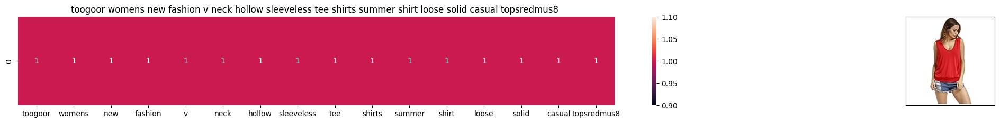

ASIN : B0734JB6ZT
Brand: TOOGOO(R)
Title: toogoor womens new fashion v neck hollow sleeveless tee shirts summer shirt loose solid casual topsredmus8 
Euclidean similarity with the query image : 2.220446049250313e-16


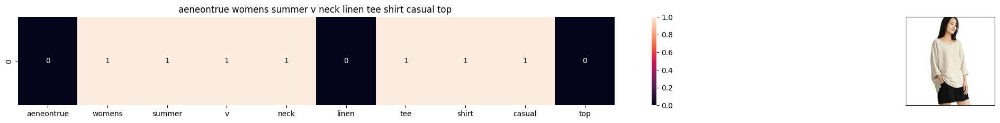

ASIN : B06XSC8TZ1
Brand: Aeneontrue
Title: aeneontrue womens summer v neck linen tee shirt casual top 
Euclidean similarity with the query image : 0.4836022205056778


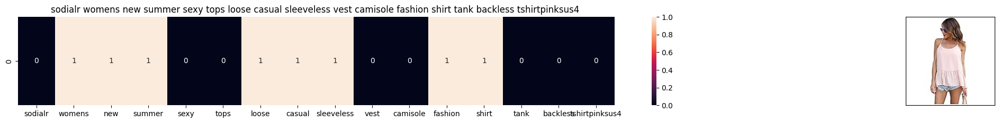

ASIN : B074FNT8XW
Brand: SODIAL(R)
Title: sodialr womens new summer sexy tops loose casual sleeveless vest camisole fashion shirt tank backless tshirtpinksus4 
Euclidean similarity with the query image : 0.4836022205056779


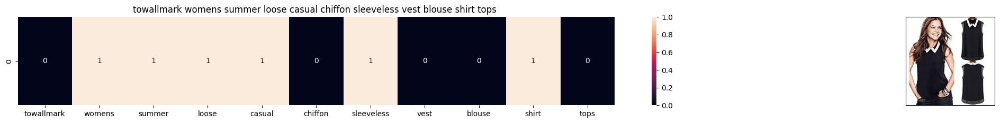

ASIN : B00QGEJ3MA
Brand: Towallmark
Title: towallmark womens summer loose casual chiffon sleeveless vest blouse shirt tops 
Euclidean similarity with the query image : 0.5329006335030861


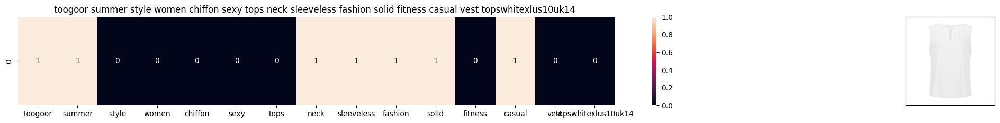

ASIN : B073NYKGRL
Brand: TOOGOO(R)
Title: toogoor summer style women chiffon sexy tops neck sleeveless fashion solid fitness casual vest topswhitexlus10uk14 
Euclidean similarity with the query image : 0.5333333333333334


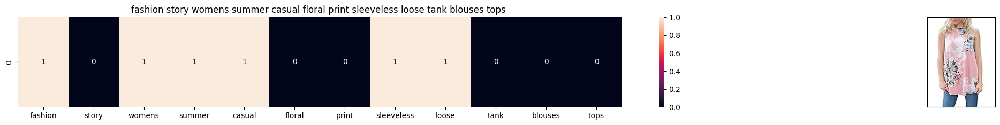

ASIN : B073M2LDZK
Brand: Fashion Story
Title: fashion story womens summer casual floral print sleeveless loose tank blouses tops 
Euclidean similarity with the query image : 0.5527864045000421


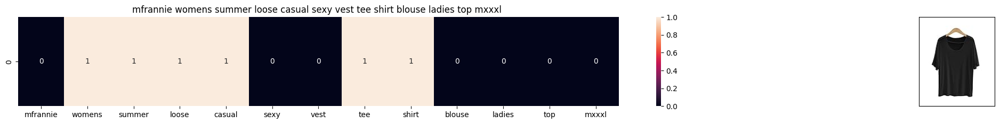

ASIN : B010AVGFIY
Brand: MFrannie
Title: mfrannie womens summer loose casual sexy vest tee shirt blouse ladies top mxxxl 
Euclidean similarity with the query image : 0.5703310755763402


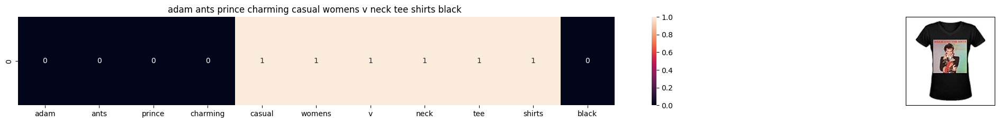

ASIN : B01I37F2YK
Brand: Bunny Angle
Title: adam ants prince charming casual womens v neck tee shirts black 
Euclidean similarity with the query image : 0.5917517095361371


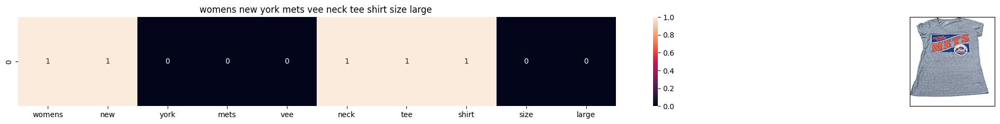

ASIN : B073RRHP4Y
Brand: Campus Lifestyle
Title: womens new york mets vee neck tee shirt size large 
Euclidean similarity with the query image : 0.5917517095361371


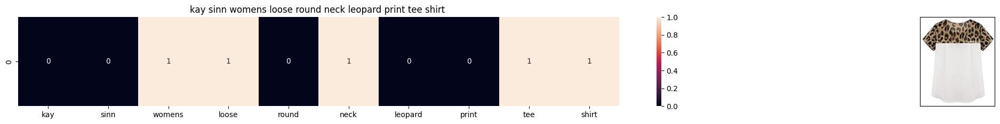

ASIN : B0148DOQZE
Brand: KAY SINN
Title: kay sinn womens loose round neck leopard print tee shirt 
Euclidean similarity with the query image : 0.5917517095361371


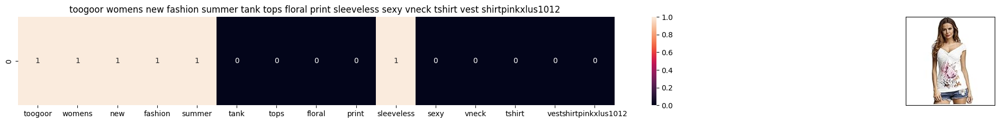

ASIN : B0734JPW8W
Brand: TOOGOO(R)
Title: toogoor womens new fashion summer tank tops floral print sleeveless sexy vneck tshirt vest shirtpinkxlus1012 
Euclidean similarity with the query image : 0.6000000000000001


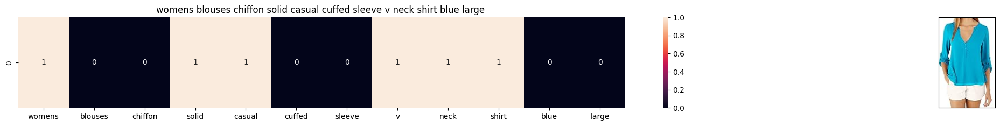

ASIN : B01I50AZ24
Brand: Manzocha
Title: womens blouses chiffon solid casual cuffed sleeve v neck shirt blue large 
Euclidean similarity with the query image : 0.6107505279192385


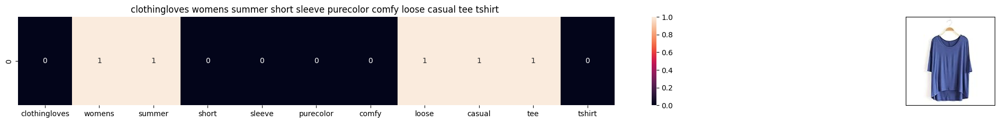

ASIN : B0746G8DGZ
Brand: ClothingLoves
Title: clothingloves womens summer short sleeve purecolor comfy loose casual tee tshirt 
Euclidean similarity with the query image : 0.6107505279192385


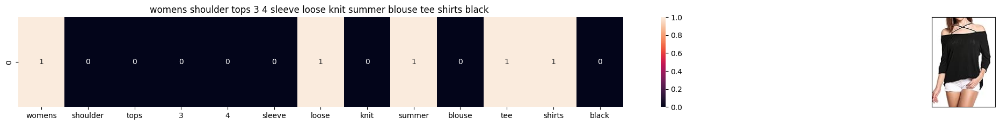

ASIN : B071G2C7Q4
Brand: JQstar
Title: womens shoulder tops 3 4 sleeve loose knit summer blouse tee shirts black 
Euclidean similarity with the query image : 0.6107505279192385


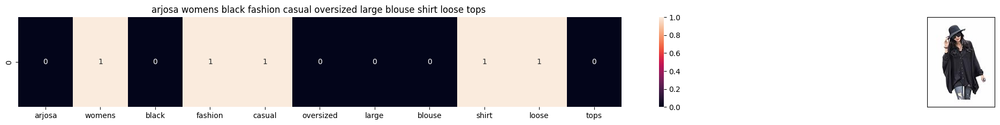

ASIN : B00UWK1J4E
Brand: ARJOSA
Title: arjosa womens black fashion casual oversized large blouse shirt loose tops 
Euclidean similarity with the query image : 0.6107505279192385


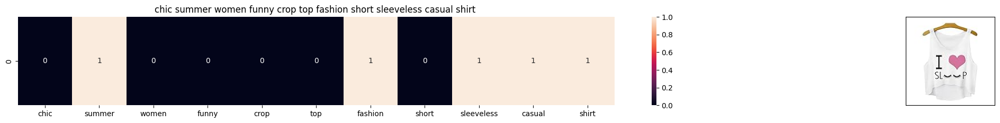

ASIN : B011RCIVS2
Brand: Chiclook Cool
Title: chic summer women funny crop top fashion short sleeveless casual shirt 
Euclidean similarity with the query image : 0.6107505279192385


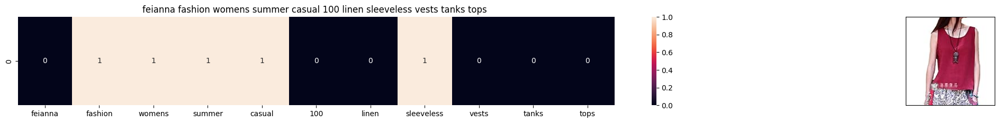

ASIN : B07376VXBP
Brand: FEIANNA
Title: feianna fashion womens summer casual 100 linen sleeveless vests tanks tops 
Euclidean similarity with the query image : 0.6107505279192385


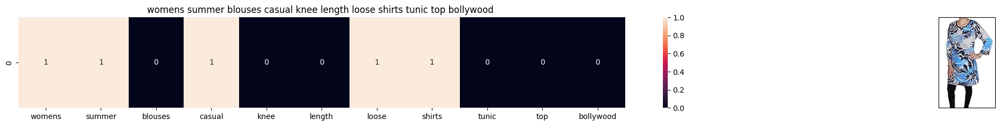

ASIN : B01LZHHPE9
Brand: RoyaltyLane
Title: womens summer blouses casual knee length loose shirts tunic top bollywood 
Euclidean similarity with the query image : 0.6107505279192385


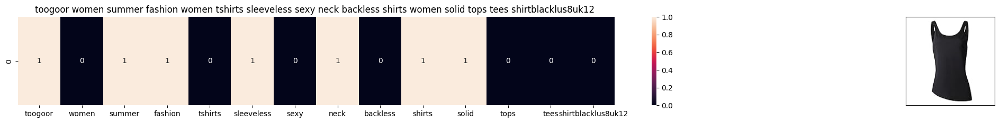

ASIN : B0734K3G2X
Brand: TOOGOO(R)
Title: toogoor women summer fashion women tshirts sleeveless sexy neck backless shirts women solid tops tees shirtblacklus8uk12 
Euclidean similarity with the query image : 0.6146626822057739


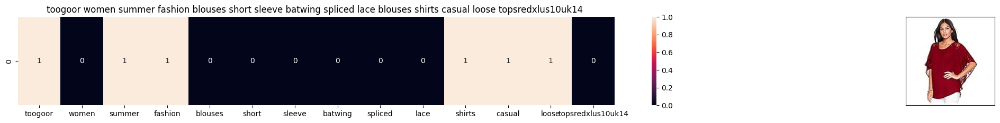

ASIN : B073NY5VG2
Brand: TOOGOO(R)
Title: toogoor women summer fashion blouses short sleeve batwing spliced lace blouses shirts casual loose topsredxlus10uk14 
Euclidean similarity with the query image : 0.6242654253489104


In [190]:
bag_of_words_euclidean=[]
def bag_of_words_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id], metric='cosine')
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        bag_of_words_euclidean.append(pdists[i])
        print('='*60)

#call the bag-of-words model for a product to get similar products.
bag_of_words_model(12566, 20) # change the index if you want to.
# In the output heat map each value represents the count value 
# of the label word, the color represents the intersection 
# with inputs title.

### TF-IDF based product similarity

In [191]:
tfidf_title_vectorizer = TfidfVectorizer(min_df = 0.0)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])
# tfidf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# tfidf_title_features[doc_id, index_of_word_in_corpus] = tfidf values of the word in given doc

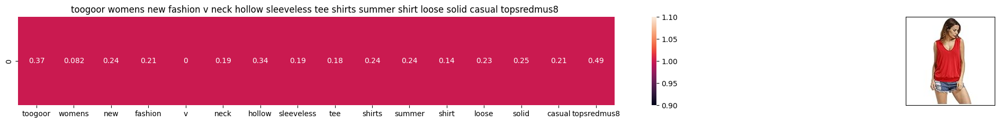

ASIN : B0734JB6ZT
BRAND : TOOGOO(R)
Eucliden distance from the given image : 0.0


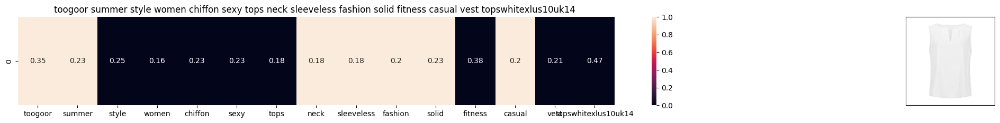

ASIN : B073NYKGRL
BRAND : TOOGOO(R)
Eucliden distance from the given image : 0.6057295369961745


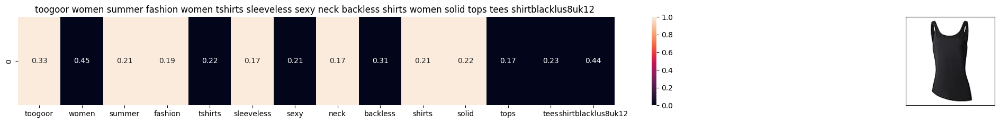

ASIN : B0734K3G2X
BRAND : TOOGOO(R)
Eucliden distance from the given image : 0.620684792599518


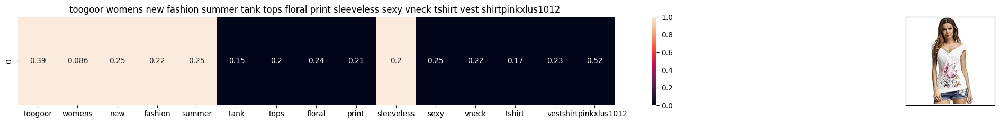

ASIN : B0734JPW8W
BRAND : TOOGOO(R)
Eucliden distance from the given image : 0.6424639688302908


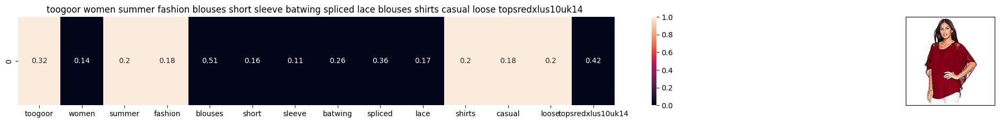

ASIN : B073NY5VG2
BRAND : TOOGOO(R)
Eucliden distance from the given image : 0.6644982879375958


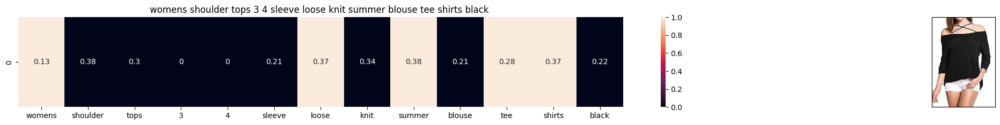

ASIN : B071G2C7Q4
BRAND : JQstar
Eucliden distance from the given image : 0.6764004018215114


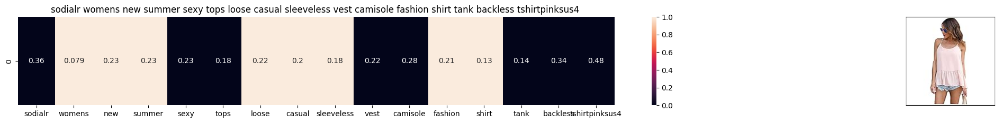

ASIN : B074FNT8XW
BRAND : SODIAL(R)
Eucliden distance from the given image : 0.6931664796929973


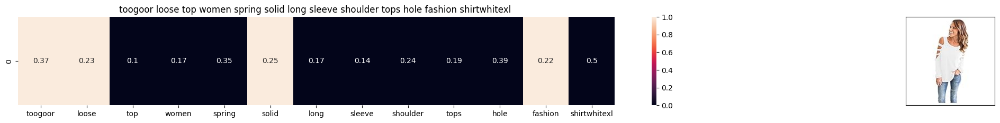

ASIN : B073NXF4ZB
BRAND : TOOGOO(R)
Eucliden distance from the given image : 0.6979270674005892


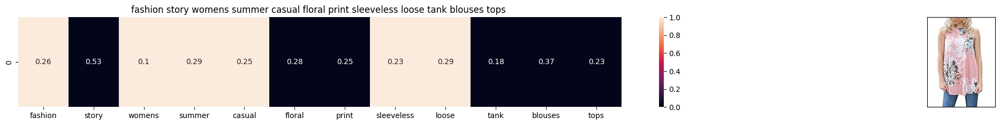

ASIN : B073M2LDZK
BRAND : Fashion Story
Eucliden distance from the given image : 0.703087179548612


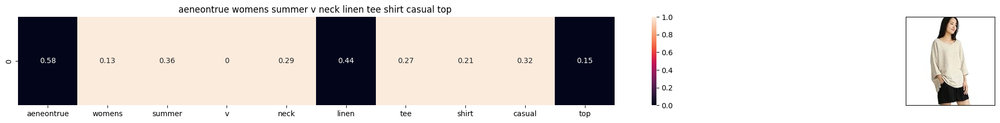

ASIN : B06XSC8TZ1
BRAND : Aeneontrue
Eucliden distance from the given image : 0.7067496892527939


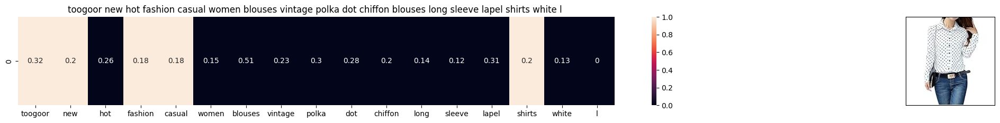

ASIN : B010UTCVB6
BRAND : TOOGOO(R)
Eucliden distance from the given image : 0.7088357017947191


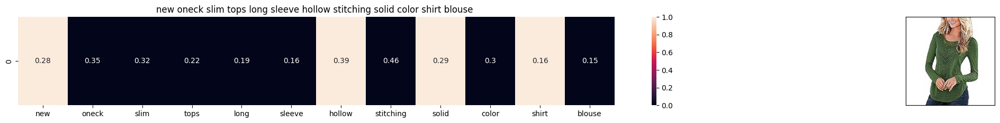

ASIN : B0754WQ2WZ
BRAND : Rbwinner
Eucliden distance from the given image : 0.7090910446648063


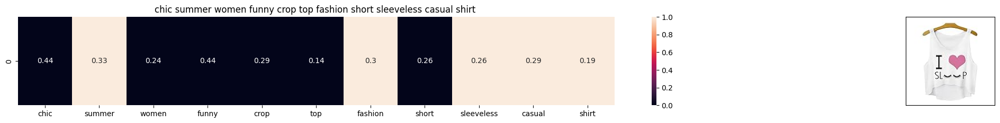

ASIN : B011RCIVS2
BRAND : Chiclook Cool
Eucliden distance from the given image : 0.7200365034577412


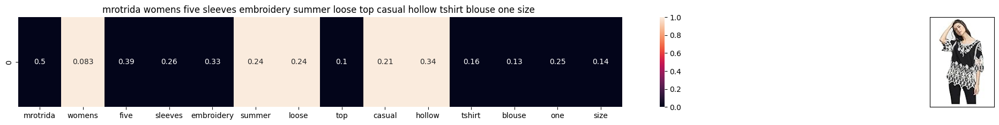

ASIN : B06XDG78H7
BRAND : Mrotrida
Eucliden distance from the given image : 0.7216359981626602


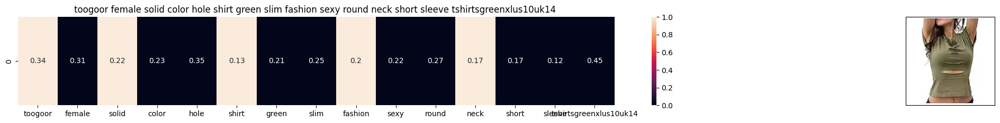

ASIN : B073NYSL6L
BRAND : TOOGOO(R)
Eucliden distance from the given image : 0.7248107755700415


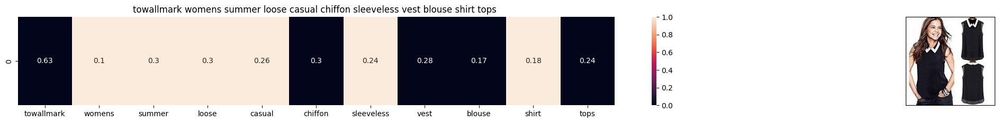

ASIN : B00QGEJ3MA
BRAND : Towallmark
Eucliden distance from the given image : 0.725644470809171


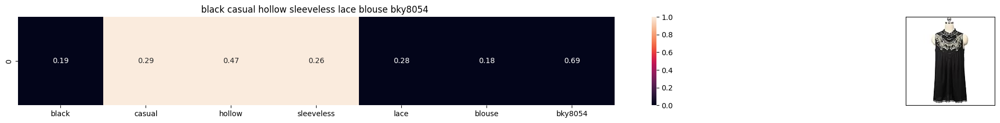

ASIN : B00UP2467G
BRAND : bankhunyabangyai store
Eucliden distance from the given image : 0.7322418475301526


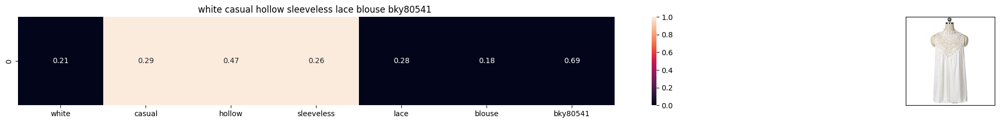

ASIN : B00UP2AB3Y
BRAND : bankhunyabangyai store
Eucliden distance from the given image : 0.7331411410498473


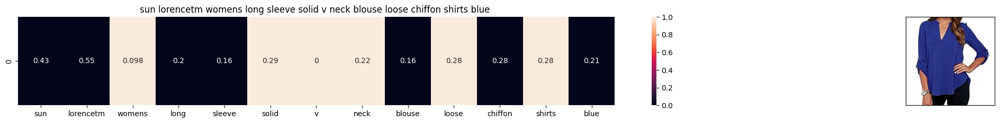

ASIN : B06X3W96RT
BRAND : Sun Lorence
Eucliden distance from the given image : 0.7454371117573715


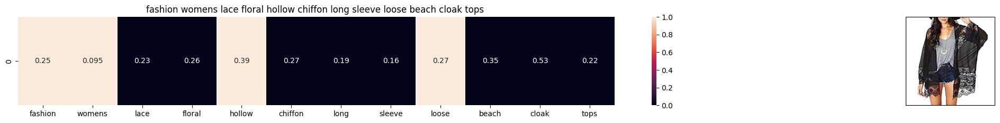

ASIN : B00Y9HREL8
BRAND : Ai.Moichien
Eucliden distance from the given image : 0.7457243924651152


In [192]:
tf_idf_euclidean=[]
def tfidf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id], metric='cosine')

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        tf_idf_euclidean.append(pdists[i])
        print('='*125)
tfidf_model(12566, 20)
# in the output heat map each value represents the tfidf values of the label word, the color represents the intersection with inputs title

### IDF based product similarity

In [156]:


# Load Data (Example)
# data = pd.read_csv("your_data.csv")

# 1️⃣ Compute Term Frequency (TF) Matrix
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])  # Sparse matrix

# 2️⃣ Precompute Document Frequencies (IDF)
def compute_idf_values(data):
    doc_count = data.shape[0]  # Total documents
    word_doc_freq = Counter()   # Store number of documents each word appears in

    for title in data['title']:
        words = set(title.split())  # Unique words in each title
        word_doc_freq.update(words)  

    return {word: math.log(doc_count / (word_doc_freq[word] + 1)) for word in word_doc_freq}  # Avoid division by zero

idf_values_dict = compute_idf_values(data)

# 3️⃣ Apply IDF Values Efficiently
idf_values = np.array([idf_values_dict.get(word, math.log(data.shape[0])) 
                       for word in idf_title_vectorizer.vocabulary_.keys()])

idf_title_features = idf_title_features.astype(np.float64)  # Ensure correct dtype
idf_title_features = idf_title_features.multiply(idf_values)  # Apply IDF scaling


2️⃣ Optimize Cosine Distance Computation

We only need top-K most similar documents instead of computing pairwise distances for everything.


🔹 **Top Similar Items** 🔹

1. Title: sodialr womens new summer sexy tops loose casual sleeveless vest camisole fashion shirt tank backless tshirtpinksus4 
   ASIN: B074FNT8XW
   Brand: SODIAL(R)
   Similarity Score: 0.5292


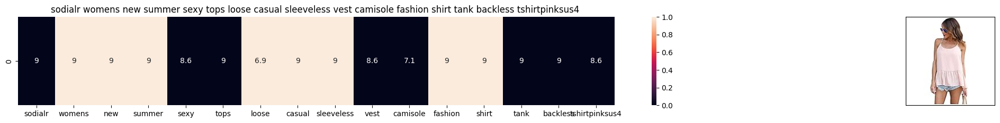

2. Title: aeneontrue womens summer v neck linen tee shirt casual top 
   ASIN: B06XSC8TZ1
   Brand: Aeneontrue
   Similarity Score: 0.5043


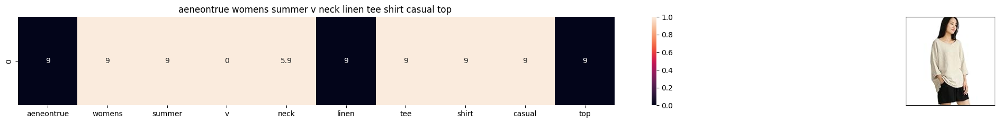

3. Title: towallmark womens summer loose casual chiffon sleeveless vest blouse shirt tops 
   ASIN: B00QGEJ3MA
   Brand: Towallmark
   Similarity Score: 0.4786


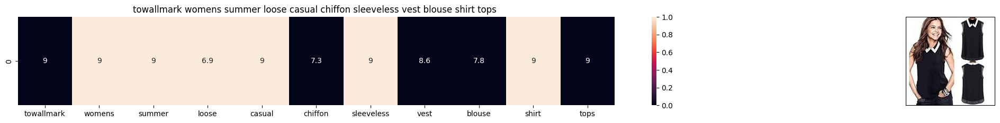

4. Title: toogoor summer style women chiffon sexy tops neck sleeveless fashion solid fitness casual vest topswhitexlus10uk14 
   ASIN: B073NYKGRL
   Brand: TOOGOO(R)
   Similarity Score: 0.4615


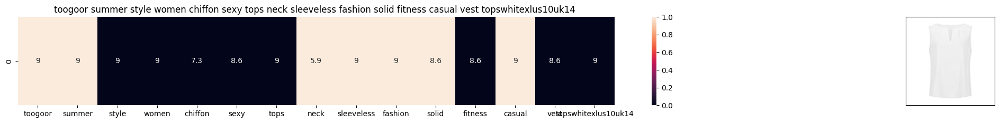

5. Title: fashion story womens summer casual floral print sleeveless loose tank blouses tops 
   ASIN: B073M2LDZK
   Brand: Fashion Story
   Similarity Score: 0.4517


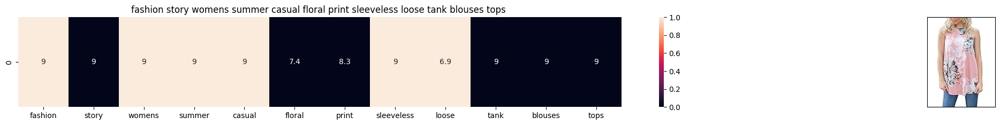

6. Title: mfrannie womens summer loose casual sexy vest tee shirt blouse ladies top mxxxl 
   ASIN: B010AVGFIY
   Brand: MFrannie
   Similarity Score: 0.4422


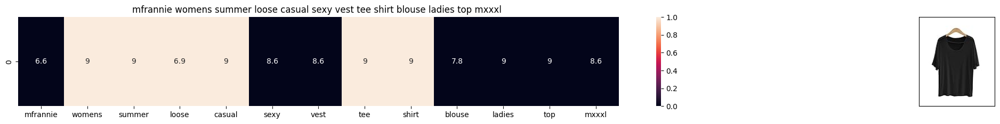

7. Title: toogoor womens new fashion summer tank tops floral print sleeveless sexy vneck tshirt vest shirtpinkxlus1012 
   ASIN: B0734JPW8W
   Brand: TOOGOO(R)
   Similarity Score: 0.4271


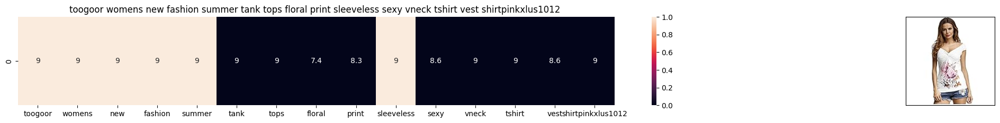

8. Title: feianna fashion womens summer casual 100 linen sleeveless vests tanks tops 
   ASIN: B07376VXBP
   Brand: FEIANNA
   Similarity Score: 0.4170


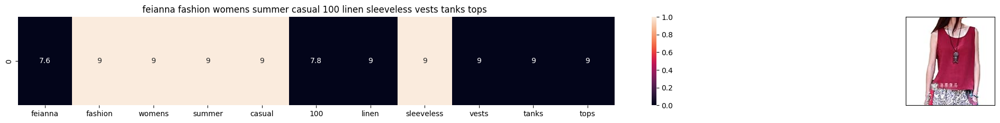

9. Title: chic summer women funny crop top fashion short sleeveless casual shirt 
   ASIN: B011RCIVS2
   Brand: Chiclook Cool
   Similarity Score: 0.4158


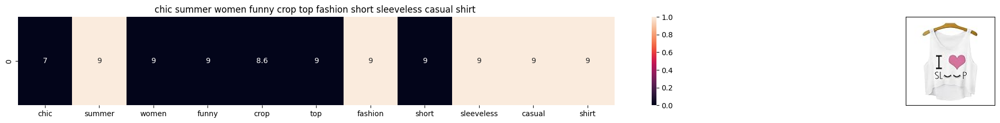

10. Title: adam ants prince charming casual womens v neck tee shirts black 
   ASIN: B01I37F2YK
   Brand: Bunny Angle
   Similarity Score: 0.4063


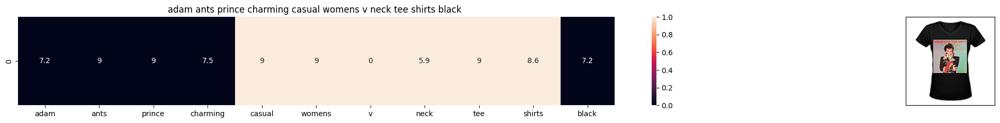

11. Title: almost famous womens fashion sleeveless shirt large melonnavy 
   ASIN: B072NY3TZG
   Brand: Almost Famous
   Similarity Score: 0.4030


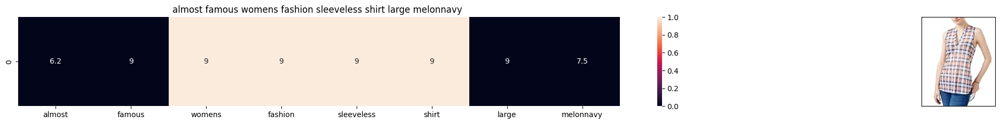

12. Title: arjosa womens black fashion casual oversized large blouse shirt loose tops 
   ASIN: B00UWK1J4E
   Brand: ARJOSA
   Similarity Score: 0.4018


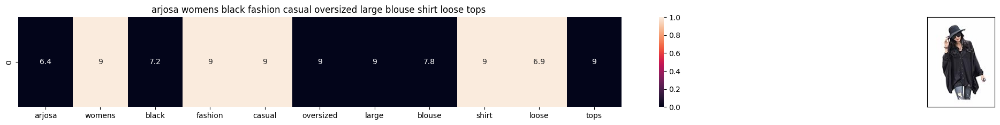

13. Title: zeko womens fashion sleeveless shirt deathstroke size black 
   ASIN: B01547U3E6
   Brand: ZEKO
   Similarity Score: 0.4014


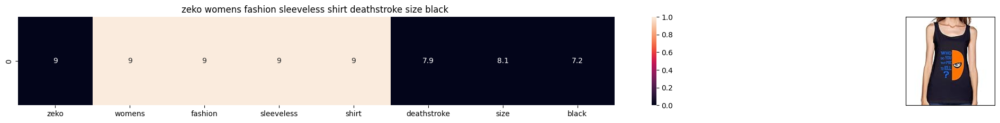

14. Title: kwok blousewomens summer casual sleeveless hoody shirt tops 
   ASIN: B01H2ZIHBE
   Brand: Kwok
   Similarity Score: 0.3944


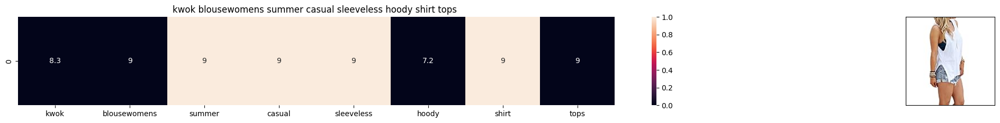

15. Title: womens new york mets vee neck tee shirt size large 
   ASIN: B073RRHP4Y
   Brand: Campus Lifestyle
   Similarity Score: 0.3931


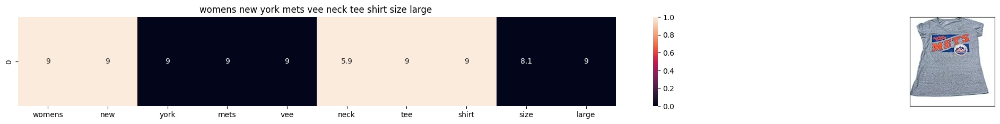

16. Title: clothingloves womens summer short sleeve purecolor comfy loose casual tee tshirt 
   ASIN: B0746G8DGZ
   Brand: ClothingLoves
   Similarity Score: 0.3906


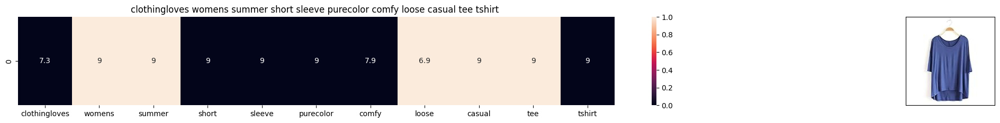

17. Title: womens shoulder tops 3 4 sleeve loose knit summer blouse tee shirts black 
   ASIN: B071G2C7Q4
   Brand: JQstar
   Similarity Score: 0.3874


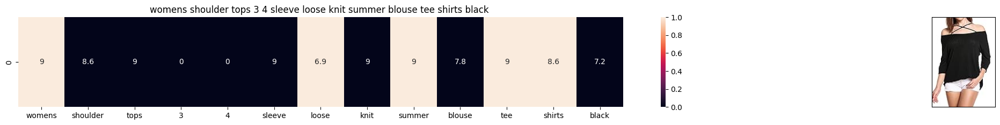

18. Title: sexy womens backless casual sleeveless shirt crop top l 
   ASIN: B00PBXP3QW
   Brand: Wotefusi
   Similarity Score: 0.3857


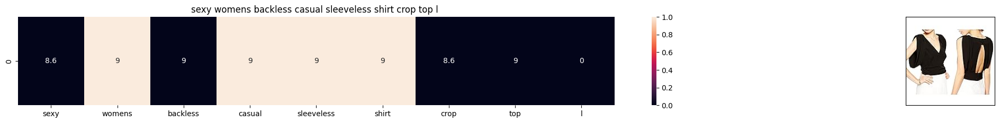

19. Title: womens blouses chiffon solid casual cuffed sleeve v neck shirt blue large 
   ASIN: B01I50AZ24
   Brand: Manzocha
   Similarity Score: 0.3832


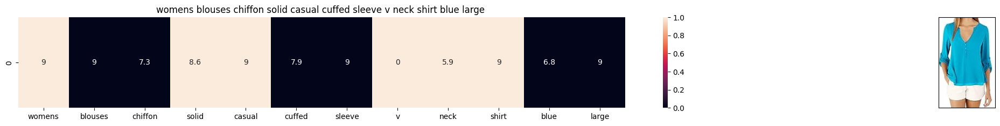

20. Title: ygt womens chiffon flower printed long sleeve summer casual shirt loose blouse 
   ASIN: B01FROZ9WC
   Brand: YangguTown
   Similarity Score: 0.3815


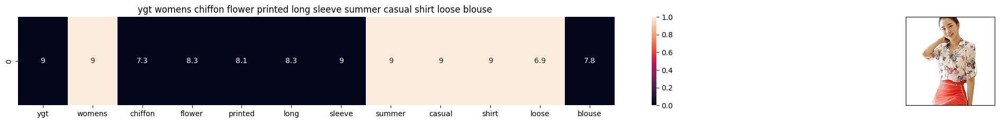

In [157]:



idf_title_features = idf_title_features.tocsr()  # Convert to CSR format
idf_cosine=[]

def idf_model(doc_id, num_results=10):
    """
    Finds the most similar titles based on TF-IDF cosine similarity.
    
    """
    query_vector = idf_title_features[doc_id]  # Extract query doc's feature vector
    
    # Compute cosine similarity only with relevant rows
    similarities = cosine_similarity(query_vector, idf_title_features).flatten()

    # Get top `num_results` similar items (excluding itself)
    top_indices = similarities.argsort()[::-1][1:num_results+1]  # Sort by highest similarity

    print("\n🔹 **Top Similar Items** 🔹\n")
    query_title = data['title'].iloc[doc_id]  # Get title of query product
    for i, idx in enumerate(top_indices):
        print(f"{i+1}. Title: {data['title'].iloc[idx]}")
        print(f"   ASIN: {data['asin'].iloc[idx]}")
        print(f"   Brand: {data['brand'].iloc[idx]}")
        print(f"   Similarity Score: {similarities[idx]:.4f}")
        idf_cosine.append(similarities[idx])
         # Display Image (if available)
        get_result(idx, query_title, data['title'].iloc[idx], data['medium_image_url'].iloc[idx], 'idf')
        print("=" * 80)

# Run optimized function
idf_model(12566, 20)


In [158]:
import nltk
nltk.download('punkt_tab')


[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\bkc_k\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [159]:


model = KeyedVectors.load_word2vec_format("GoogleNews-vectors-negative300.bin", binary=True)

# ✅ Precompute vocabulary set for fast lookup
vocab_set = set(model.key_to_index.keys())

def get_word_vec(sentence, doc_id, m_name):
    """
    Converts a sentence into a matrix of word vectors.
    Uses either 'avg' (average) or 'weighted' (TF-IDF weighted) representations.
    """
    words = word_tokenize(sentence.lower())  # lowercasing helps with matching
    vecs = []

    for word in words:
        if word in vocab_set:  # safe to access model[word]
            if m_name == 'weighted' and word in idf_title_vectorizer.vocabulary_:
                idx = idf_title_vectorizer.vocabulary_[word]
                weight = idf_title_features[doc_id, idx]
                vecs.append(weight * model[word])
            else:
                vecs.append(model[word])
        else:
            vecs.append(np.zeros(300))

    return np.array(vecs)


def get_distance(vec1, vec2):
    """
    Optimized Euclidean distance computation between two matrices.
    Uses broadcasting instead of nested loops.
    """
    return np.linalg.norm(vec1[:, np.newaxis, :] - vec2[np.newaxis, :, :], axis=-1)

def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    """
    Generates a heatmap visualization for word-level distances.
    """
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    s1_s2_dist = get_distance(s1_vec, s2_vec)

    fig, ax = plt.subplots(figsize=(12, 6))
    sns.heatmap(np.round(s1_s2_dist, 4), annot=True, ax=ax)
    
    ax.set_xticklabels(sentence2.split(), rotation=45)
    ax.set_yticklabels(sentence1.split(), rotation=0)
    ax.set_title(f"Distance Heatmap: {sentence2}")

    # Load Image
    try:
        img = Image.open(requests.get(url, stream=True).raw)
        display.display(img)
    except Exception as e:
        print("❌ Image Not Found:", e)

    plt.show()

def build_avg_vec(sentence, num_features, doc_id, m_name):
    words = word_tokenize(sentence.lower())  # Lowercase for consistency
    vectors = []

    for word in words:
        if word in vocab_set:
            if m_name == 'weighted' and word in idf_title_vectorizer.vocabulary_:
                weight = idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]]
                vectors.append(weight * model[word])
            else:
                vectors.append(model[word])
        else:
            continue  # Word not in Word2Vec model, skip

    if vectors:
        return np.mean(vectors, axis=0)
    else:
        return np.zeros(num_features)


# ✅ Precompute W2V representations once to avoid recalculating
doc_id = 0
w2v_title = np.array([build_avg_vec(title, 300, doc_id, 'avg') for doc_id, title in enumerate(data['title'])])

avg_w2v_cosine=[]
def avg_w2v_model(doc_id, num_results=10):
    """
    Finds the most similar titles using word2vec and Euclidean distance.
    """
    # ✅ Use np.argpartition for faster nearest neighbor search
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1, -1), metric='cosine')
    nearest_indices = np.argpartition(pairwise_dist.flatten(), num_results)[:num_results]
    sorted_indices = nearest_indices[np.argsort(pairwise_dist.flatten()[nearest_indices])]

    for i, idx in enumerate(sorted_indices):
        heat_map_w2v(data['title'].iloc[doc_id], data['title'].iloc[idx], data['medium_image_url'].iloc[idx], doc_id, idx, 'avg')
        print(f"ASIN : {data['asin'].iloc[idx]}")
        print(f"BRAND : {data['brand'].iloc[idx]}")
        print(f"Euclidean Distance: {pairwise_dist[idx][0]:.4f}")
        avg_w2v_cosine.append(pairwise_dist[idx])
        print("=" * 100)




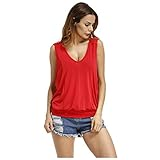

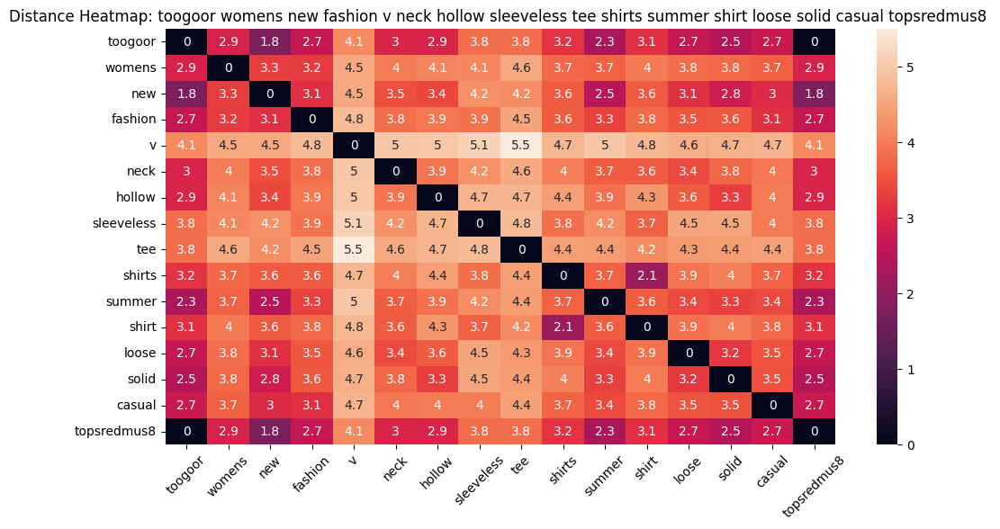

ASIN : B0734JB6ZT
BRAND : TOOGOO(R)
Euclidean Distance: 0.0000


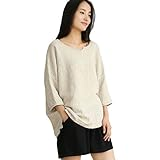

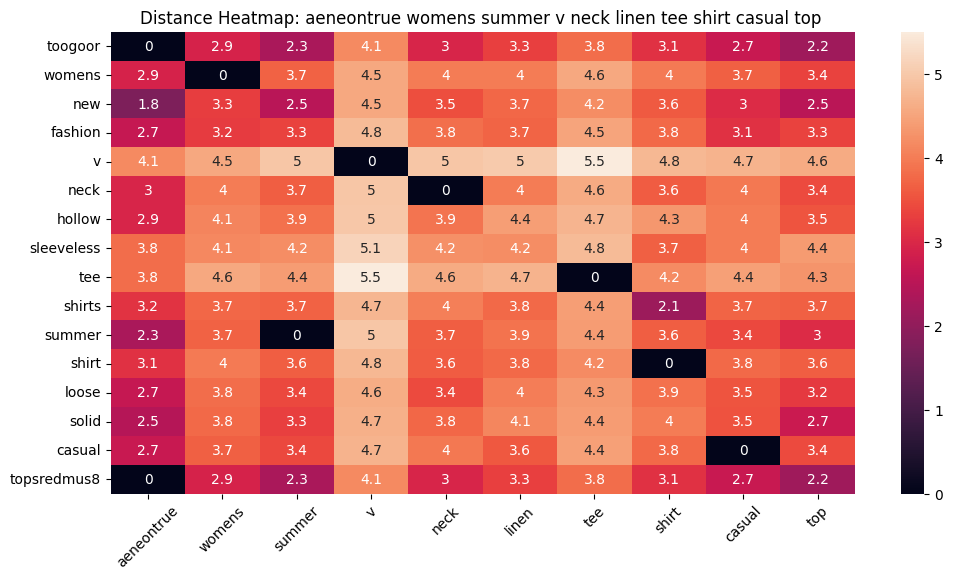

ASIN : B06XSC8TZ1
BRAND : Aeneontrue
Euclidean Distance: 0.1076


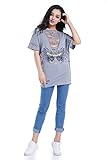

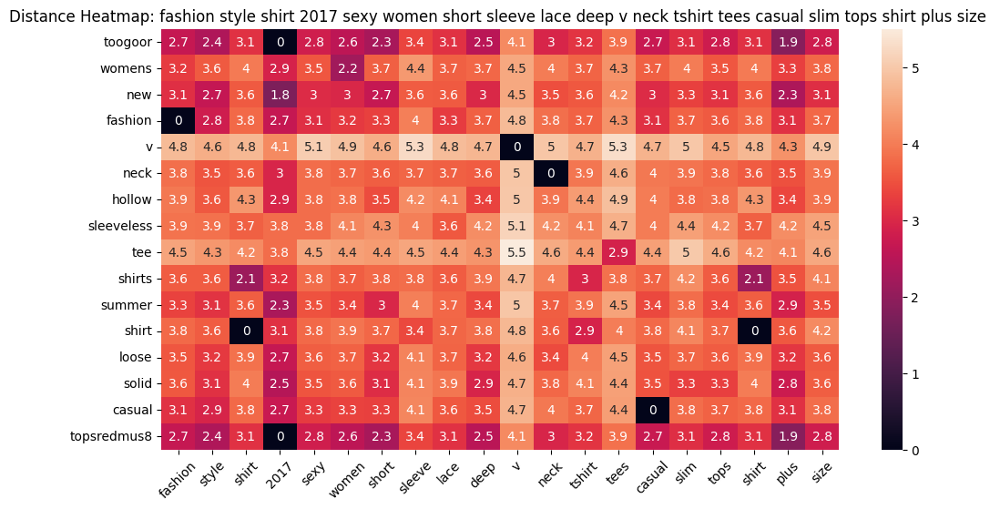

ASIN : B01MS2NG40
BRAND : LHS Charmer
Euclidean Distance: 0.1158


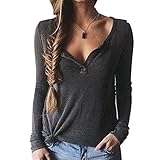

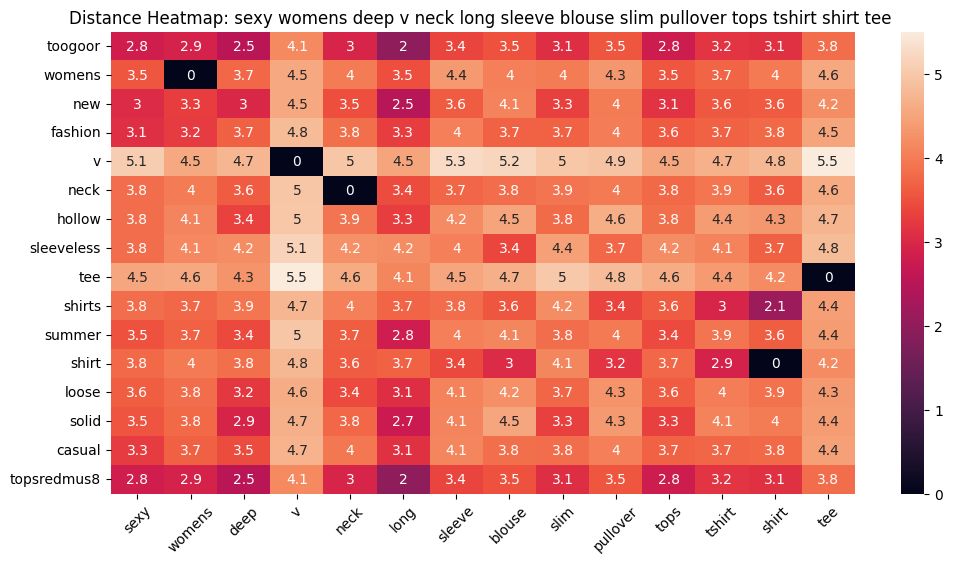

ASIN : B016UMLKIW
BRAND : Innovateyfm
Euclidean Distance: 0.1288


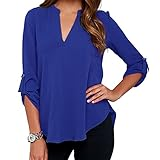

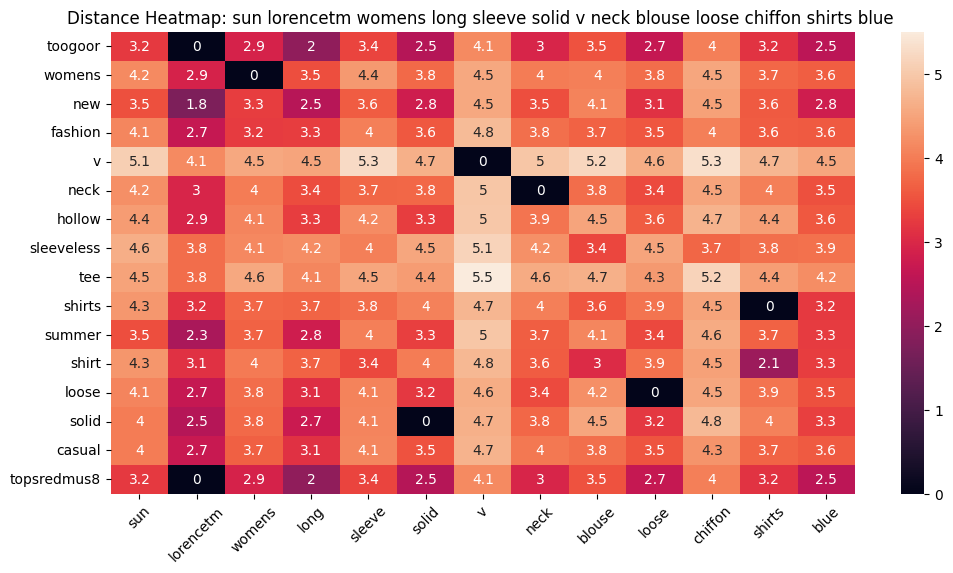

ASIN : B06X3W96RT
BRAND : Sun Lorence
Euclidean Distance: 0.1328


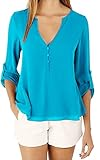

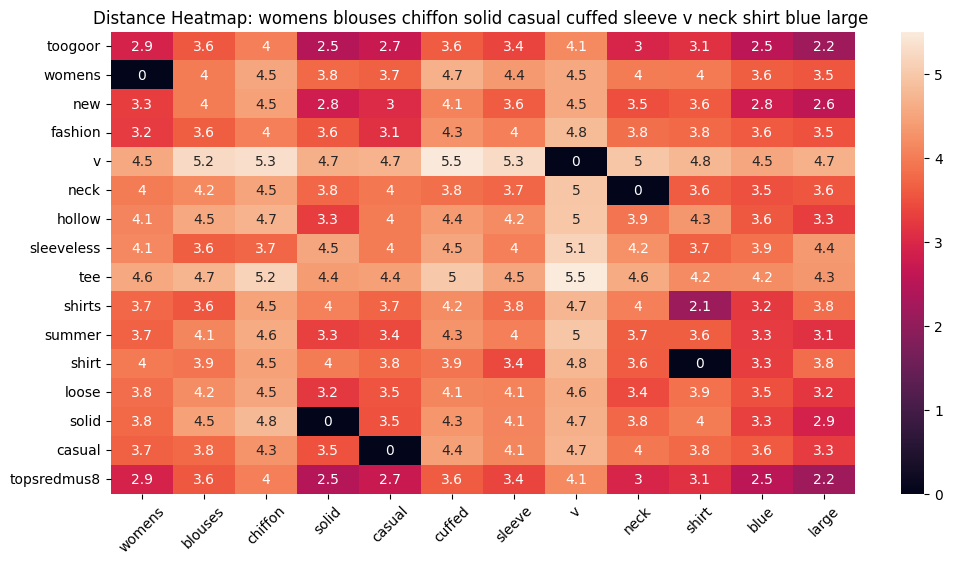

ASIN : B01I50AZ24
BRAND : Manzocha
Euclidean Distance: 0.1338


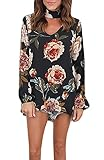

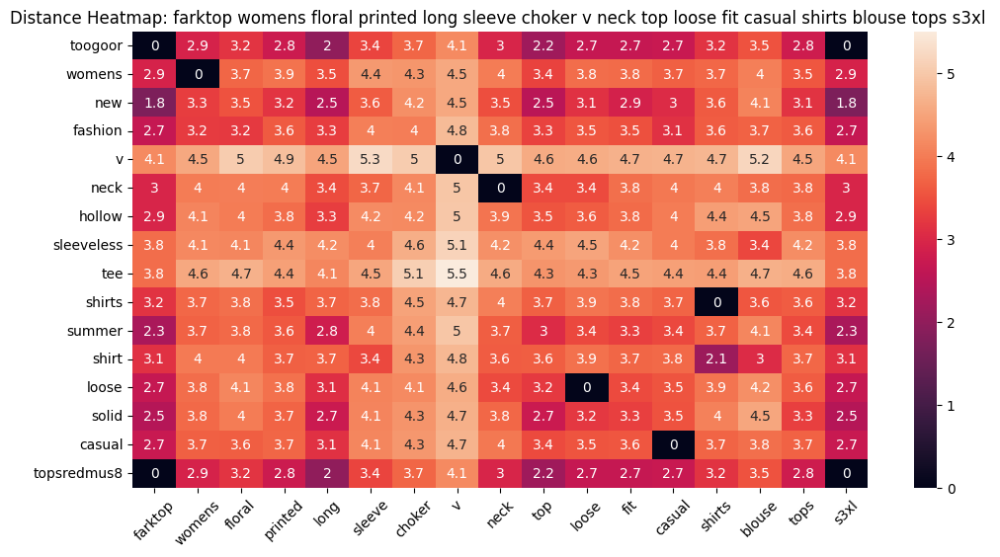

ASIN : B0749MX555
BRAND : Farktop
Euclidean Distance: 0.1343


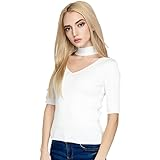

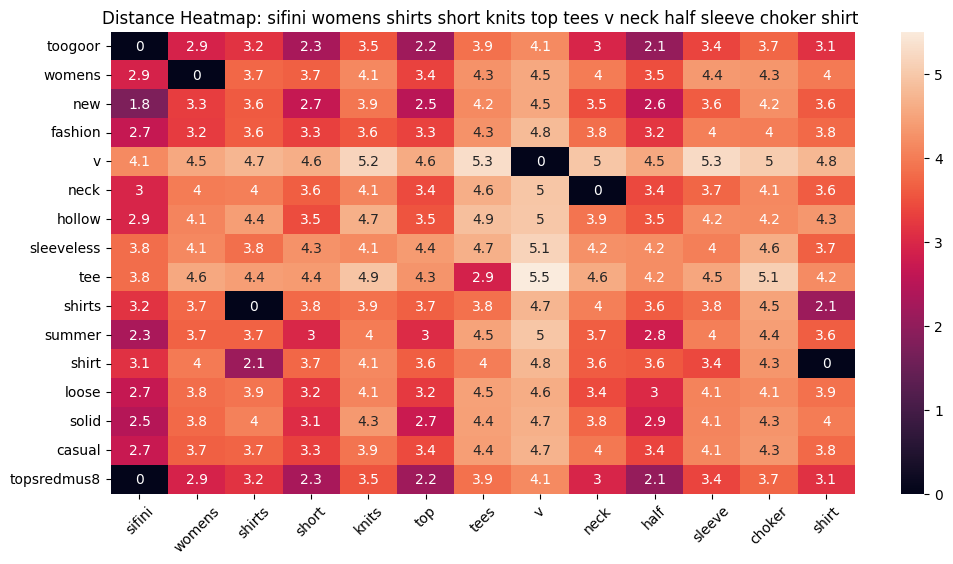

ASIN : B01MY1Z5SK
BRAND : SIFINI
Euclidean Distance: 0.1391


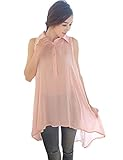

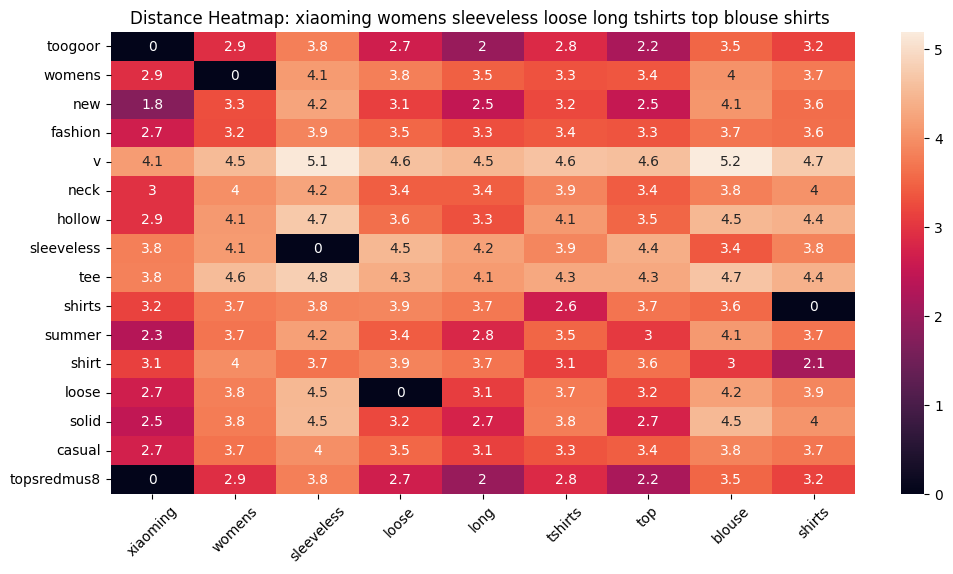

ASIN : B010RV33VE
BRAND : xiaoming
Euclidean Distance: 0.1438


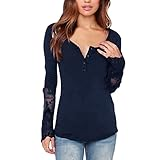

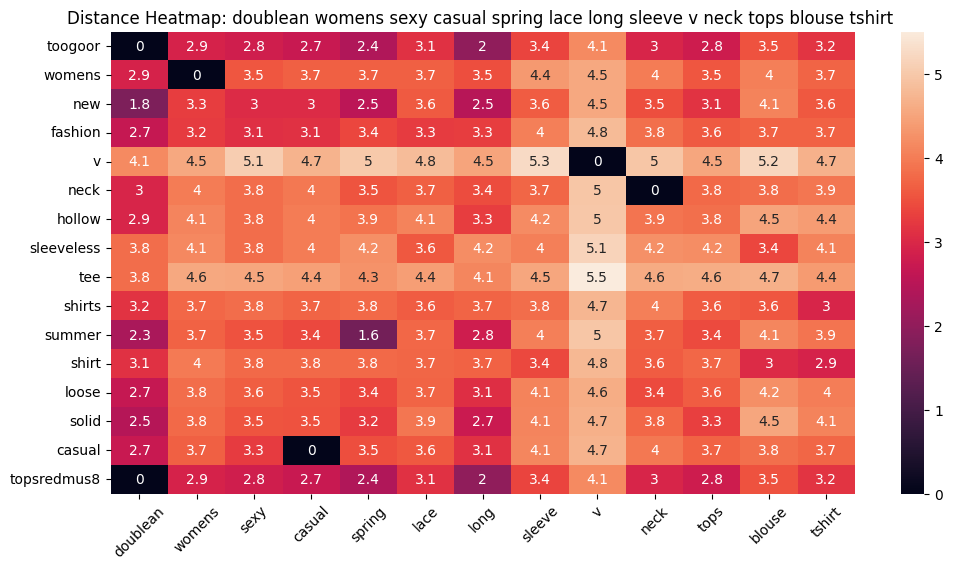

ASIN : B06WW5TZ68
BRAND : Doublean
Euclidean Distance: 0.1445


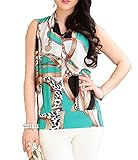

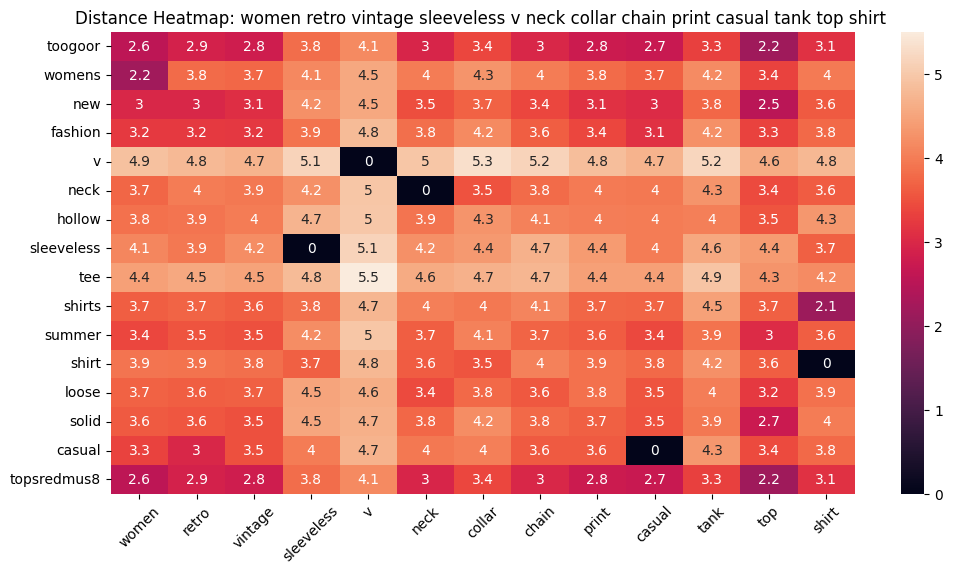

ASIN : B01D2TISLI
BRAND : Blansdi
Euclidean Distance: 0.1510


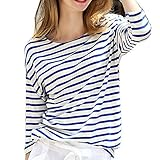

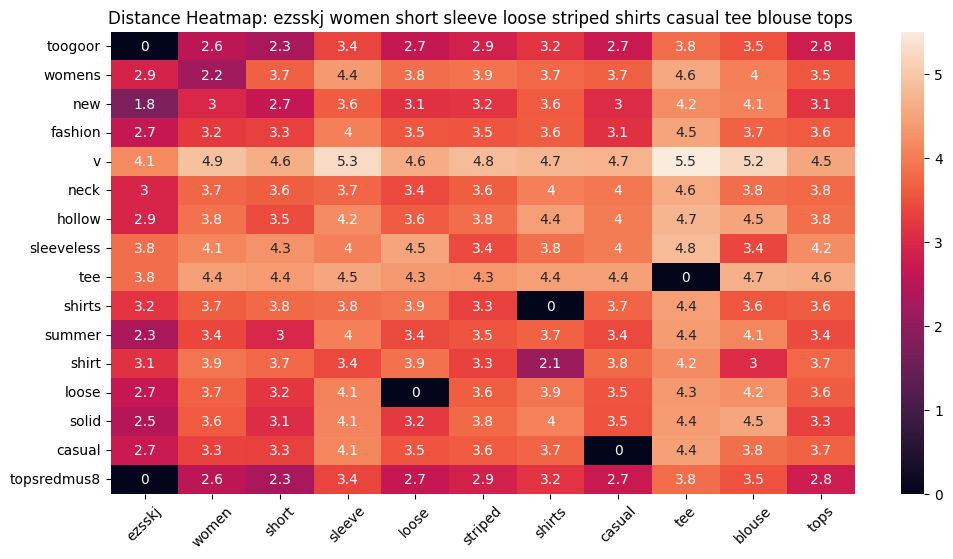

ASIN : B01LZWFA41
BRAND : Ezsskj
Euclidean Distance: 0.1516


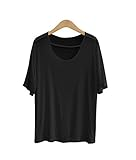

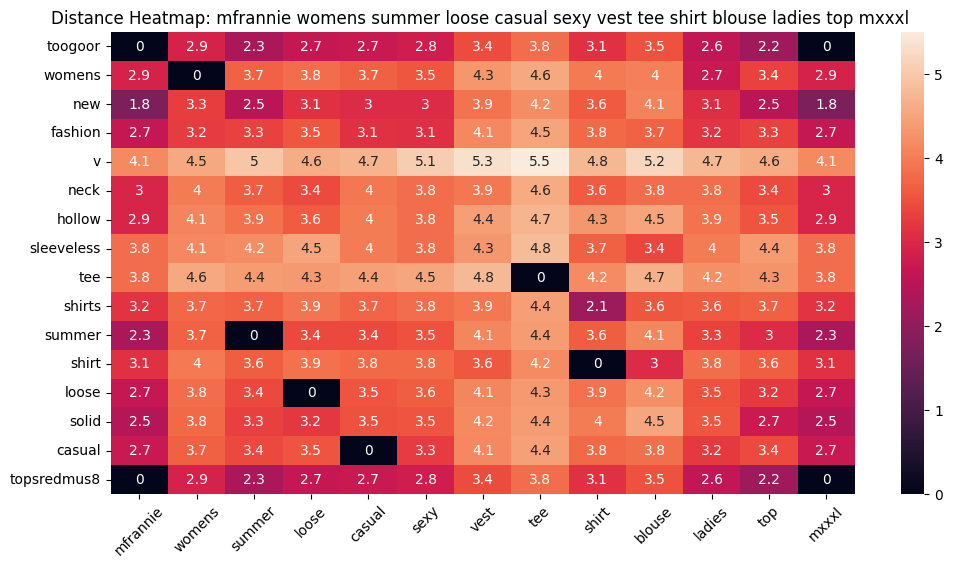

ASIN : B010AVGFIY
BRAND : MFrannie
Euclidean Distance: 0.1526


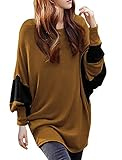

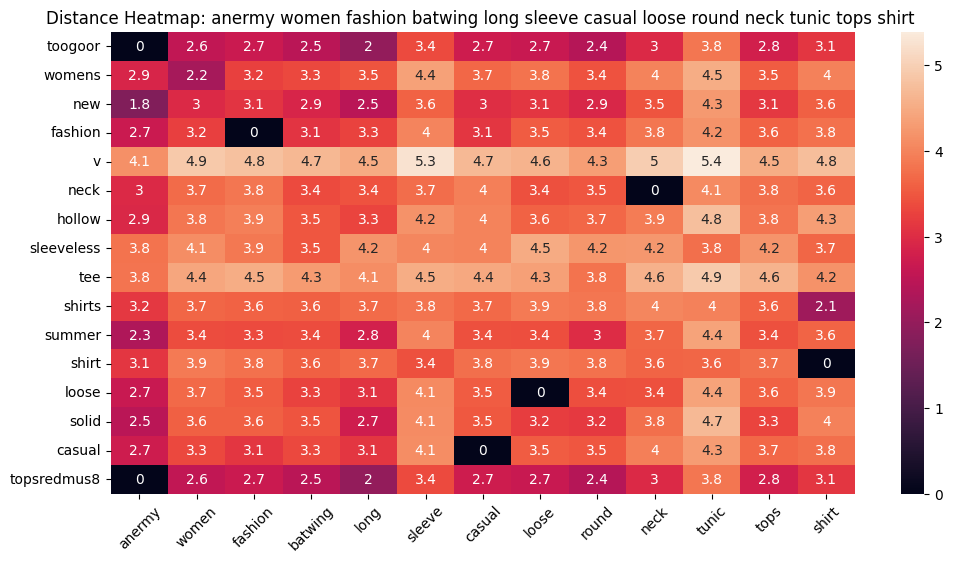

ASIN : B01A6CZMM2
BRAND : Anermy
Euclidean Distance: 0.1531


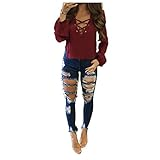

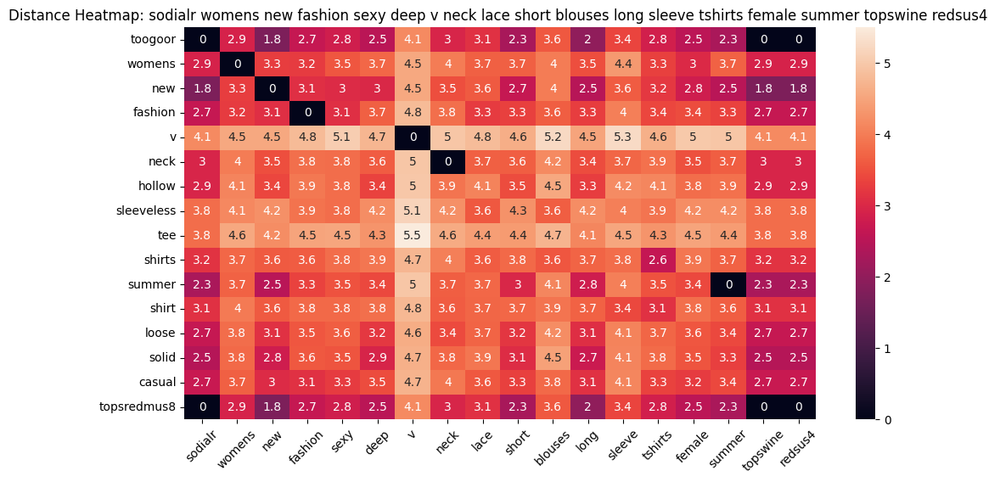

ASIN : B074FT1X1M
BRAND : SODIAL(R)
Euclidean Distance: 0.1533


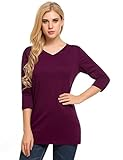

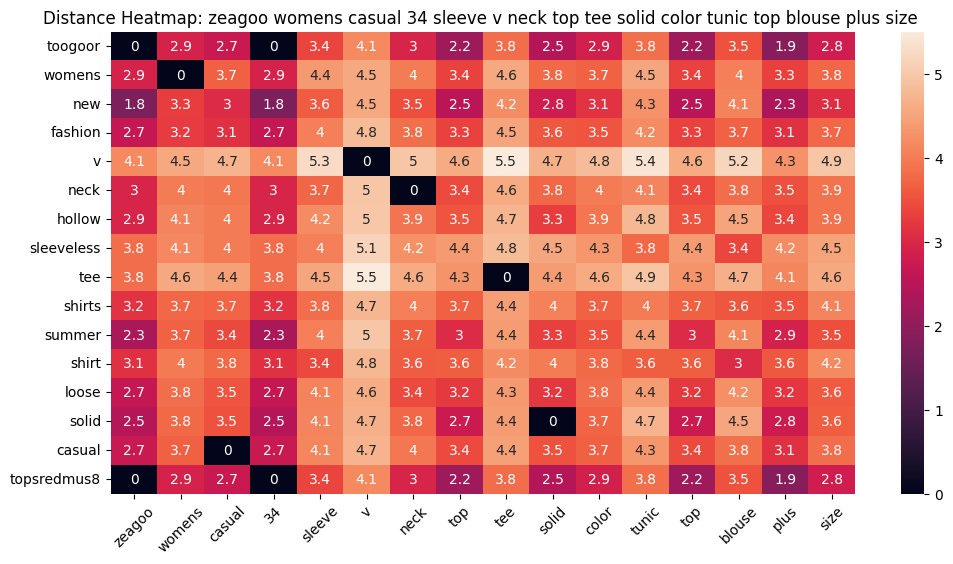

ASIN : B0711T395Q
BRAND : Zeagoo
Euclidean Distance: 0.1543


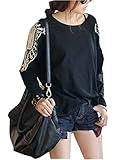

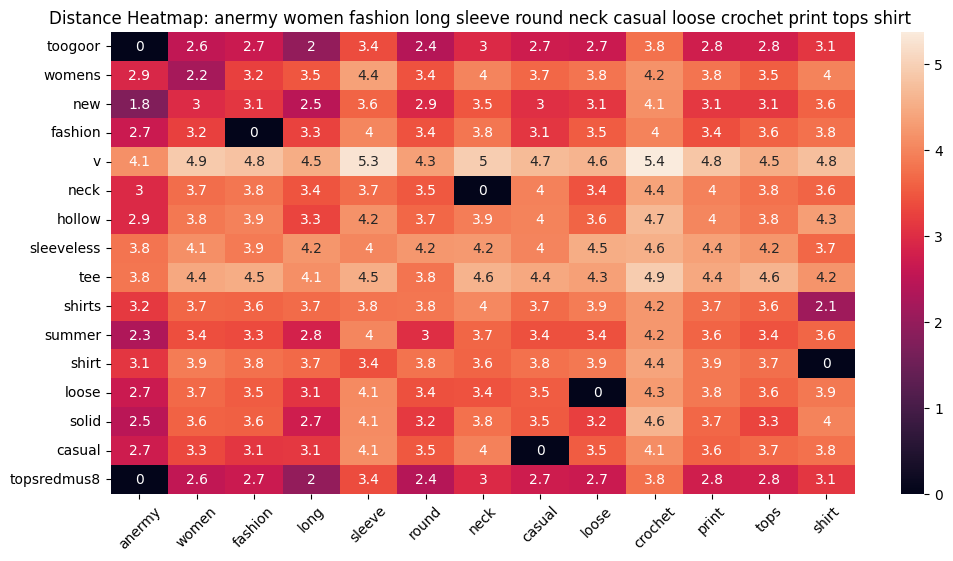

ASIN : B01A6X6I06
BRAND : Anermy
Euclidean Distance: 0.1546


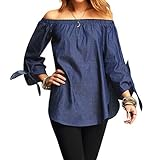

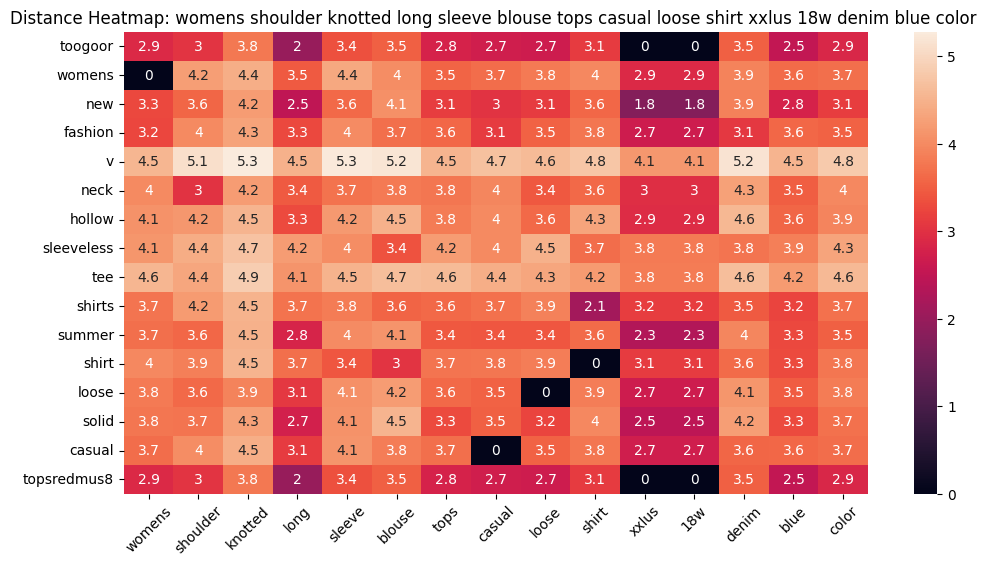

ASIN : B06XX2Q8N5
BRAND : Armear
Euclidean Distance: 0.1560


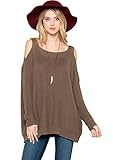

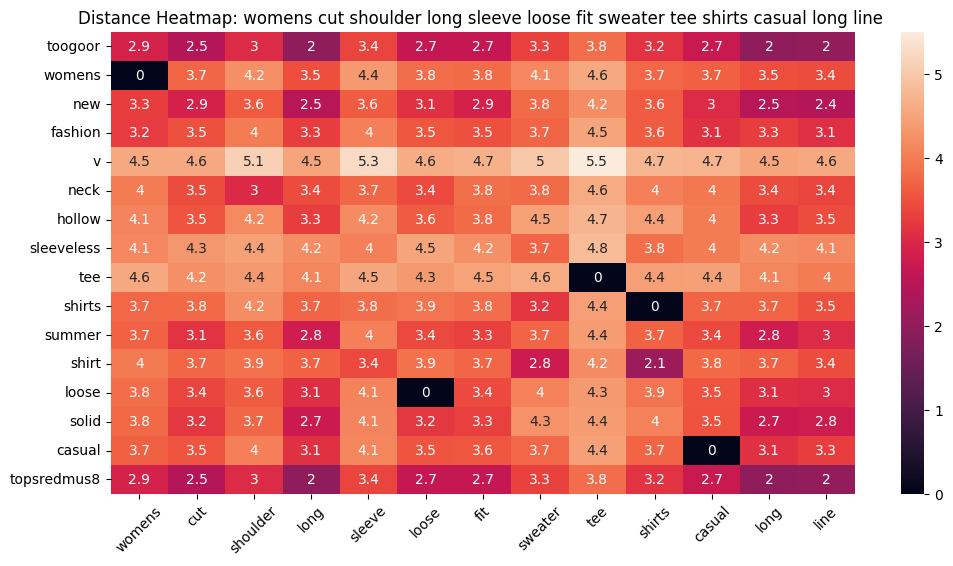

ASIN : B075BSMDY9
BRAND : Avenue hill
Euclidean Distance: 0.1564


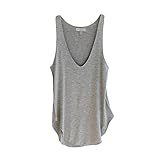

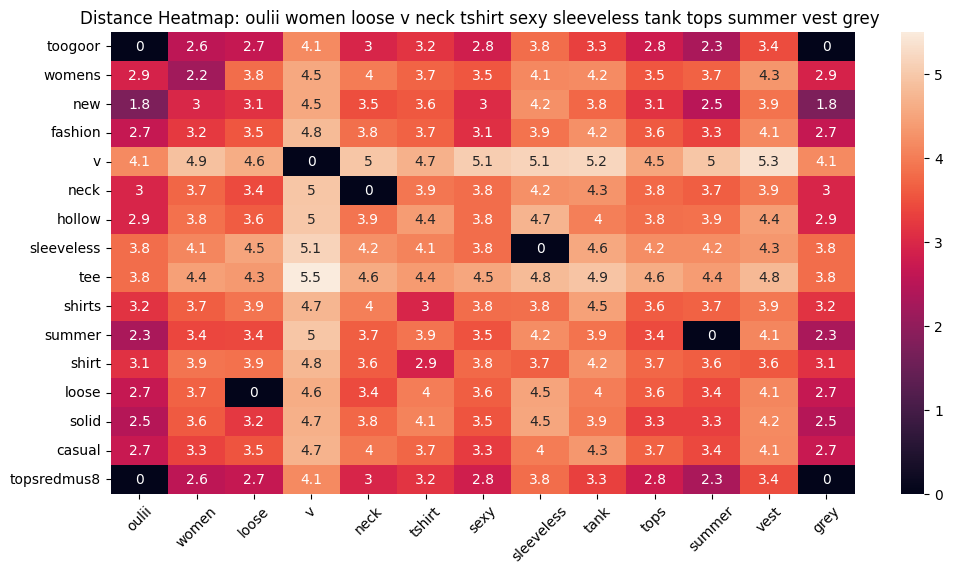

ASIN : B072KH8HBJ
BRAND : OULII
Euclidean Distance: 0.1589


In [160]:
# Run the optimized function
avg_w2v_model(12566, 20)

In [161]:
word_vectors = KeyedVectors.load_word2vec_format("GoogleNews-vectors-negative300.bin", binary=True)
print(len(word_vectors.key_to_index))

3000000


In [162]:
for title in data['title']:
    if "focal18" in title:
        print(title)


focal18 paisley printed shirt mini dress blouse loose tops long sleeve novelty 
focal18 cute patterns embroidery shirt blouse girl casual tops novelty design 
focal18 rainbow print tshirt tee crop top short sleeve tops neck womens stripe 


In [163]:
#  IDF weighted Word2Vec for product similarity


# Step 1: Compute Weighted Word2Vec Representations Efficiently
w2v_title_weight = np.array([build_avg_vec(i, 300, doc_id, 'weighted') for doc_id, i in enumerate(data['title'])])

# Step 2: Precompute Pairwise Distance Matrix (Optional for faster retrieval)
pairwise_dist_matrix = pairwise_distances(w2v_title_weight, metric='cosine')

weighted_w2v_cosine=[]
def weighted_w2v_model(doc_id, num_results):
    """
    Retrieves the most similar items to the given doc_id using cosine similarity.
    """
    # Get precomputed distances
    pairwise_dist = pairwise_dist_matrix[doc_id]

    # Efficient selection of `num_results` smallest distances
    indices = np.argpartition(pairwise_dist, num_results)[:num_results]
    pdists = pairwise_dist[indices]

    # Sort the results by actual distance
    sorted_indices = np.argsort(pdists)
    indices = indices[sorted_indices]
    pdists = pdists[sorted_indices]

    # Fetch the results in one go for efficiency
    df_results = data.iloc[indices]

    for i in range(len(indices)):
        heat_map_w2v(df_results['title'].iloc[0], df_results['title'].iloc[i], 
                     df_results['medium_image_url'].iloc[i], indices[0], indices[i], 'weighted')
        
        print(f"ASIN: {df_results['asin'].iloc[i]}")
        print(f"Brand: {df_results['brand'].iloc[i]}")
        print(f"cosine similarity from input: {pdists[i]}")
        weighted_w2v_cosine.append(pdists[i])
        print("=" * 125)




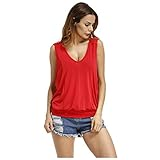

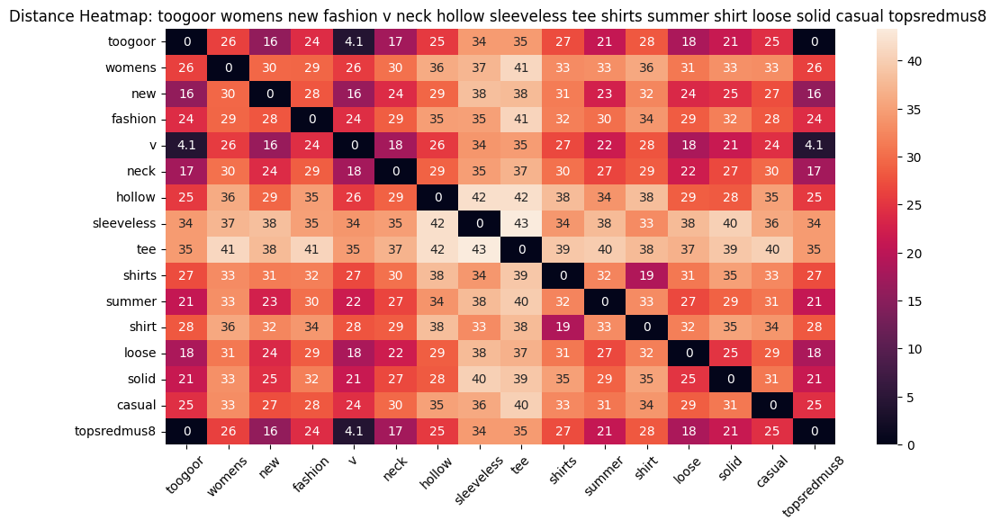

ASIN: B0734JB6ZT
Brand: TOOGOO(R)
cosine similarity from input: 0.0


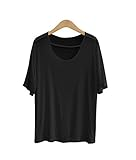

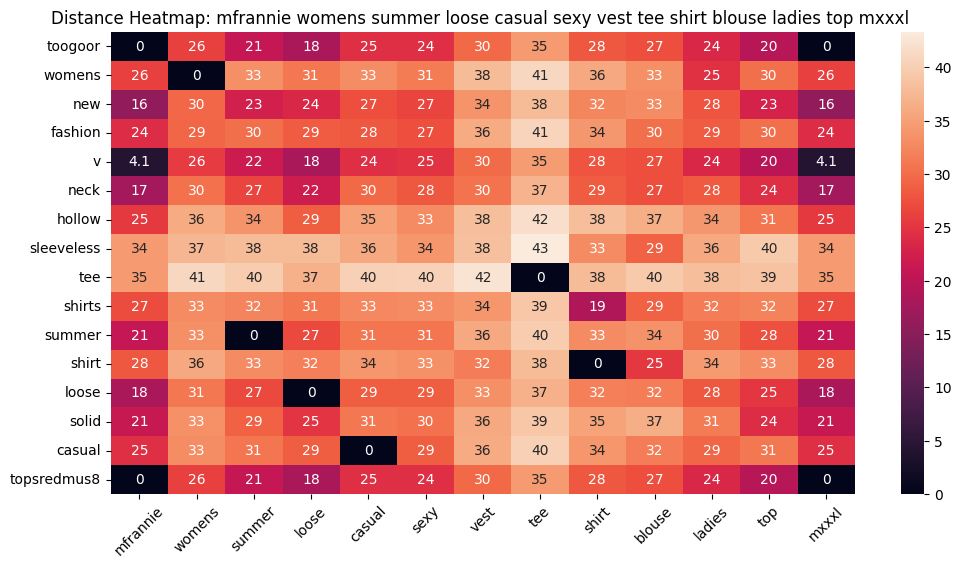

ASIN: B010AVGFIY
Brand: MFrannie
cosine similarity from input: 0.12093740701675415


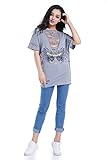

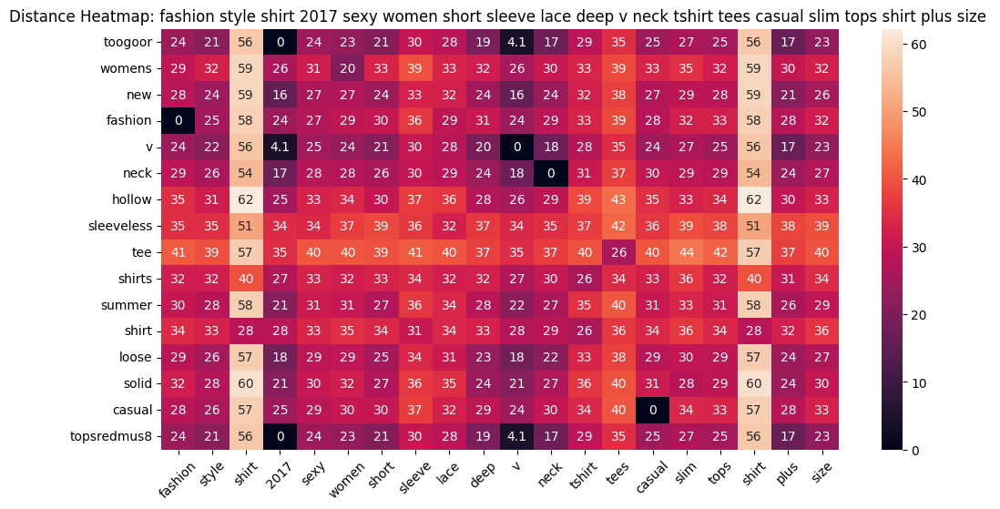

ASIN: B01MS2NG40
Brand: LHS Charmer
cosine similarity from input: 0.12220984697341919


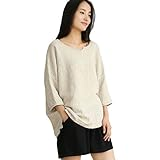

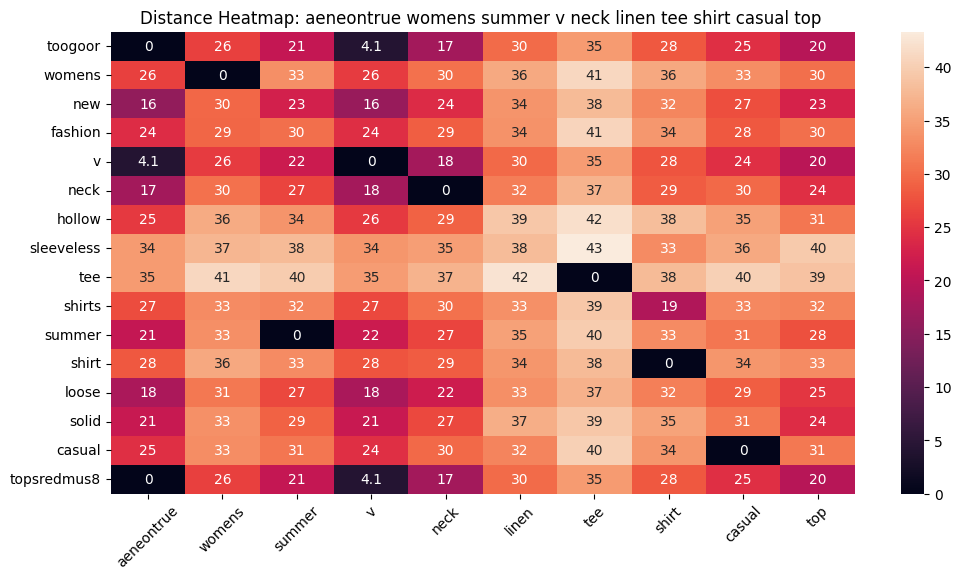

ASIN: B06XSC8TZ1
Brand: Aeneontrue
cosine similarity from input: 0.12756890058517456


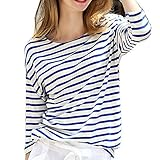

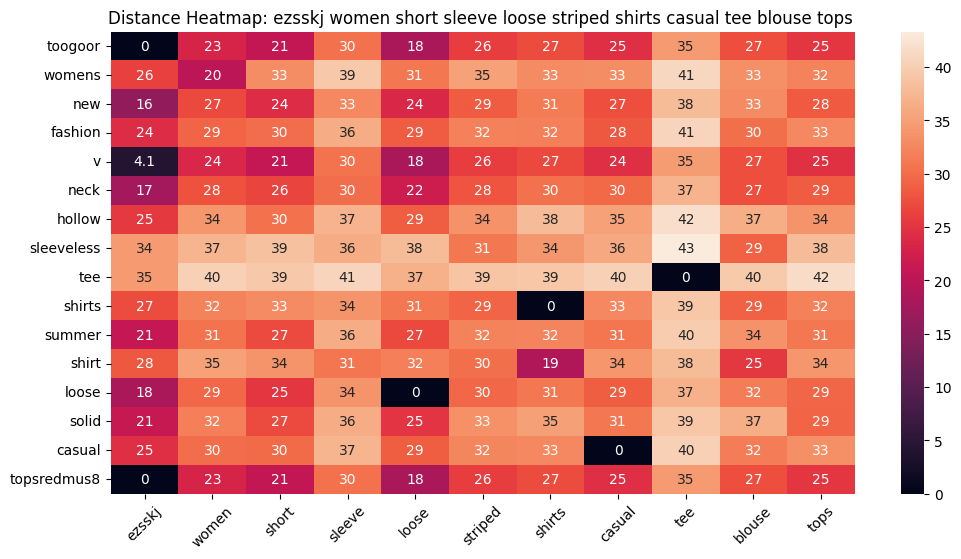

ASIN: B01LZWFA41
Brand: Ezsskj
cosine similarity from input: 0.13235151767730713


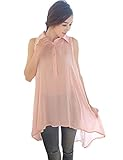

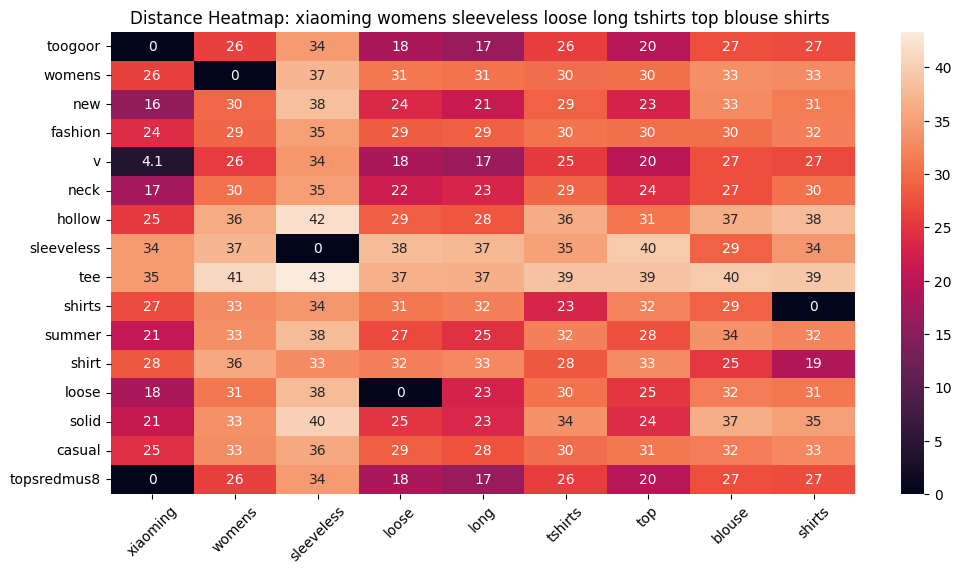

ASIN: B010RV33VE
Brand: xiaoming
cosine similarity from input: 0.1372048258781433


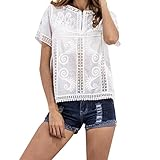

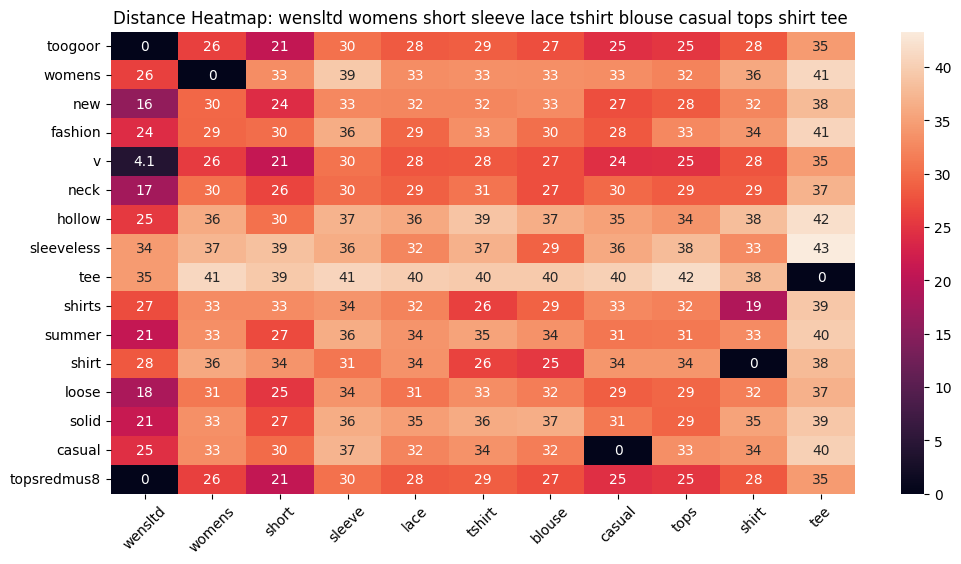

ASIN: B06W2LXT6G
Brand: WensLTD
cosine similarity from input: 0.14177989959716797


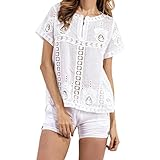

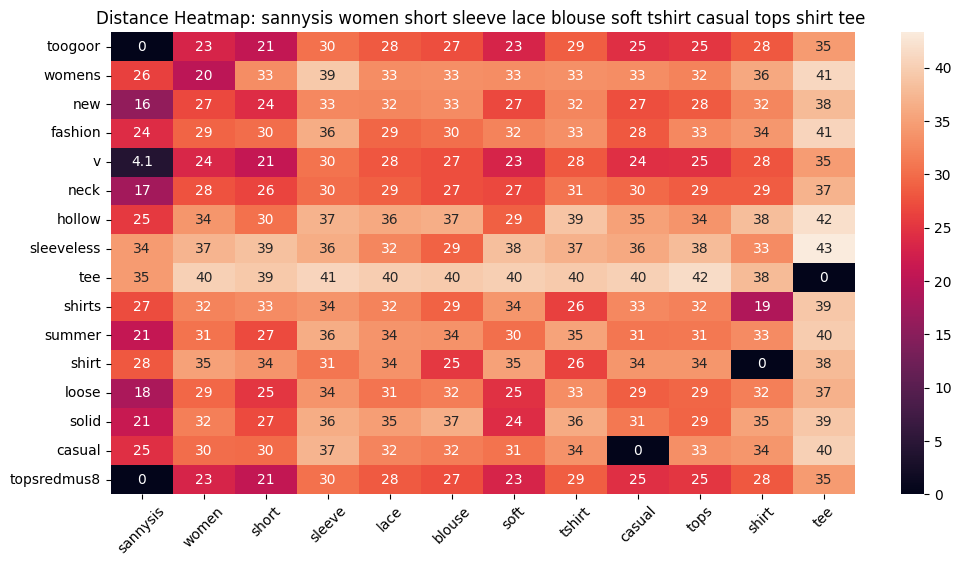

ASIN: B06WP6SW2S
Brand: Sannysis
cosine similarity from input: 0.14193367958068848


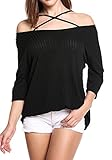

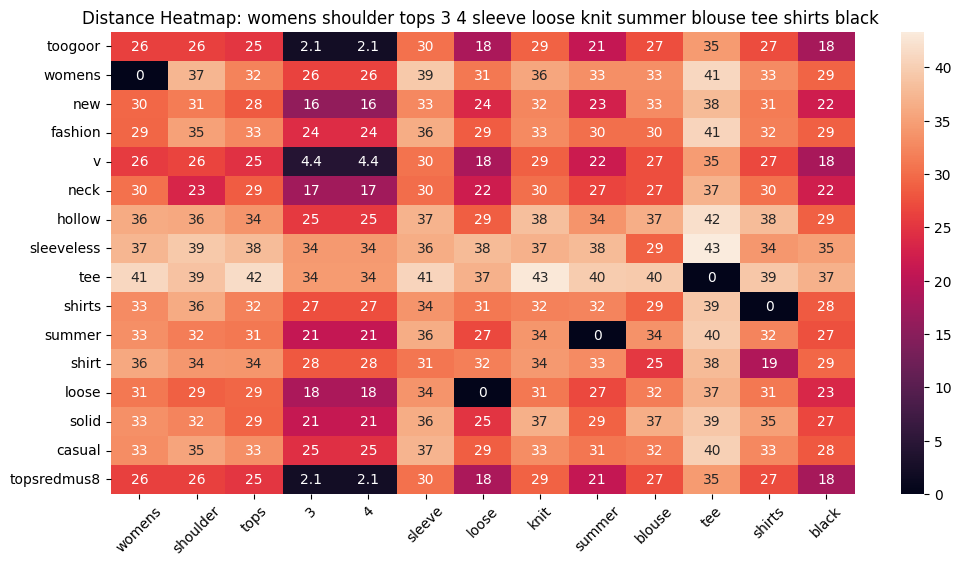

ASIN: B071G2C7Q4
Brand: JQstar
cosine similarity from input: 0.14555740356445312


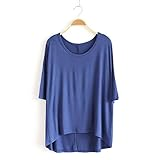

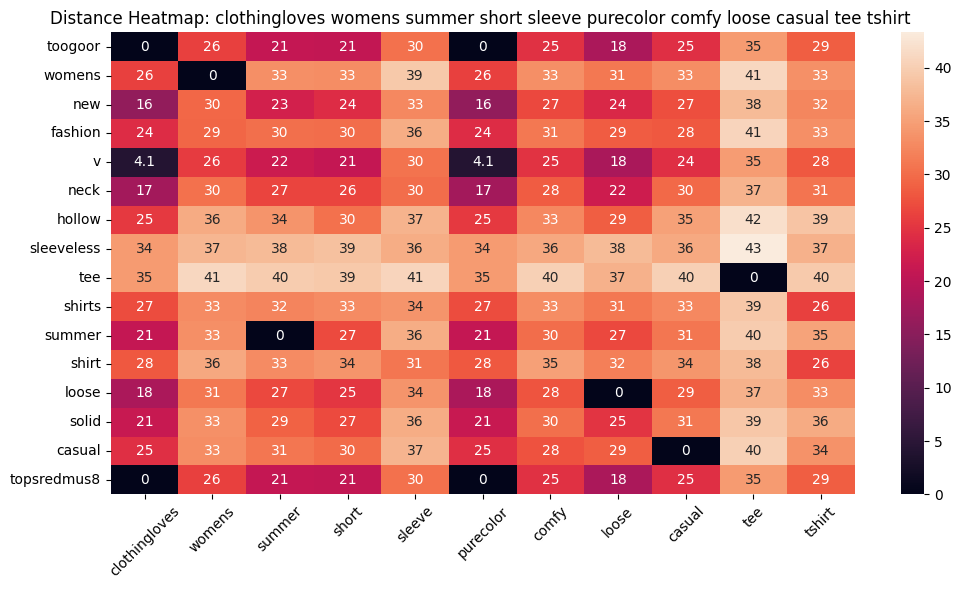

ASIN: B0746G8DGZ
Brand: ClothingLoves
cosine similarity from input: 0.14559829235076904


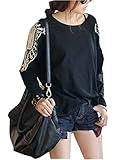

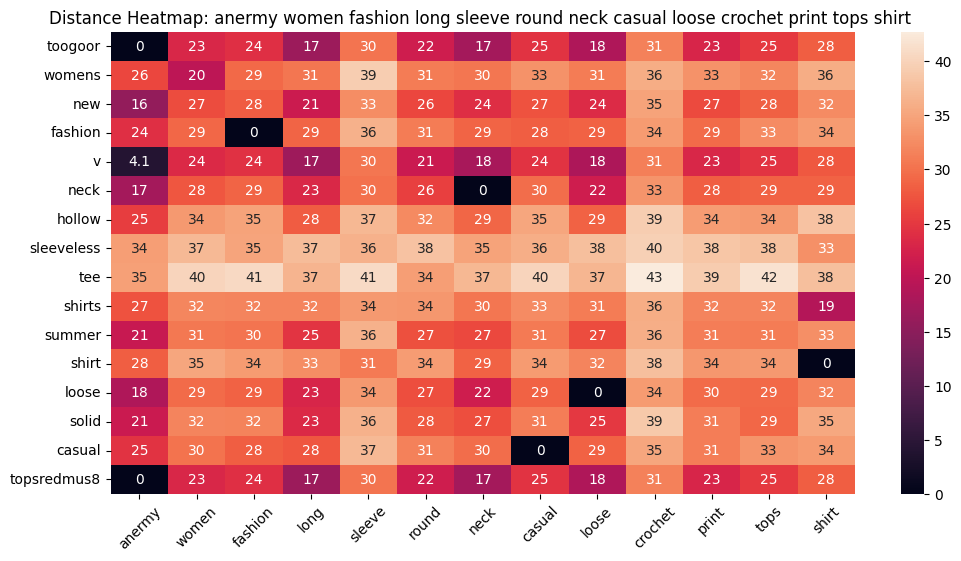

ASIN: B01A6X6I06
Brand: Anermy
cosine similarity from input: 0.14662981033325195


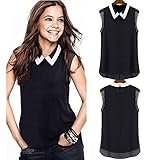

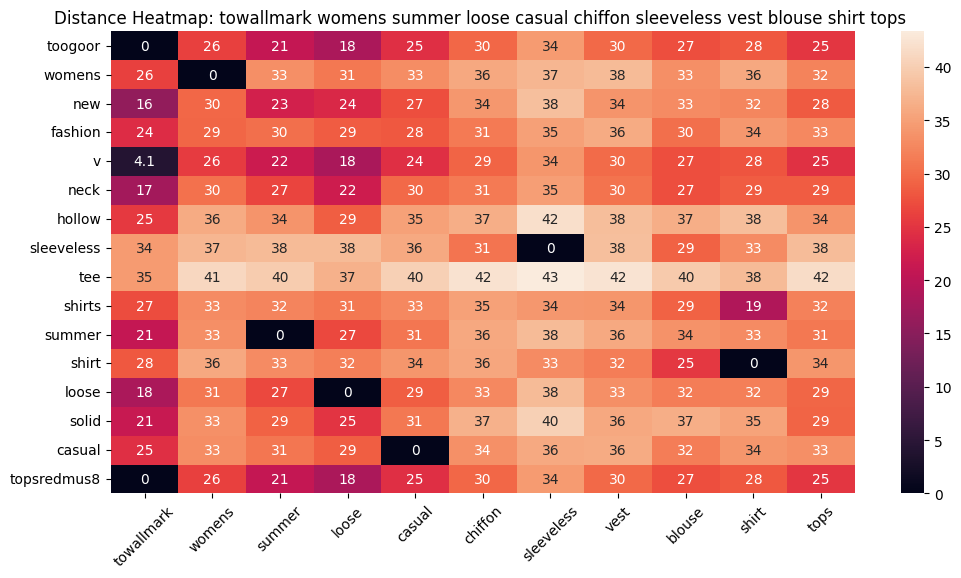

ASIN: B00QGEJ3MA
Brand: Towallmark
cosine similarity from input: 0.14663898944854736


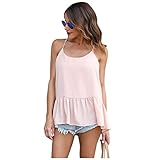

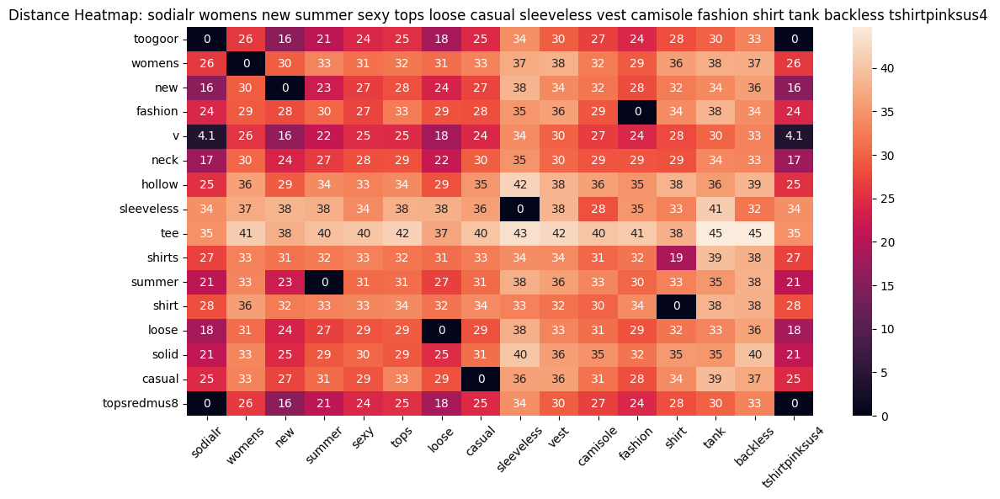

ASIN: B074FNT8XW
Brand: SODIAL(R)
cosine similarity from input: 0.1466497778892517


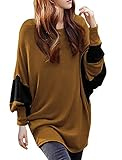

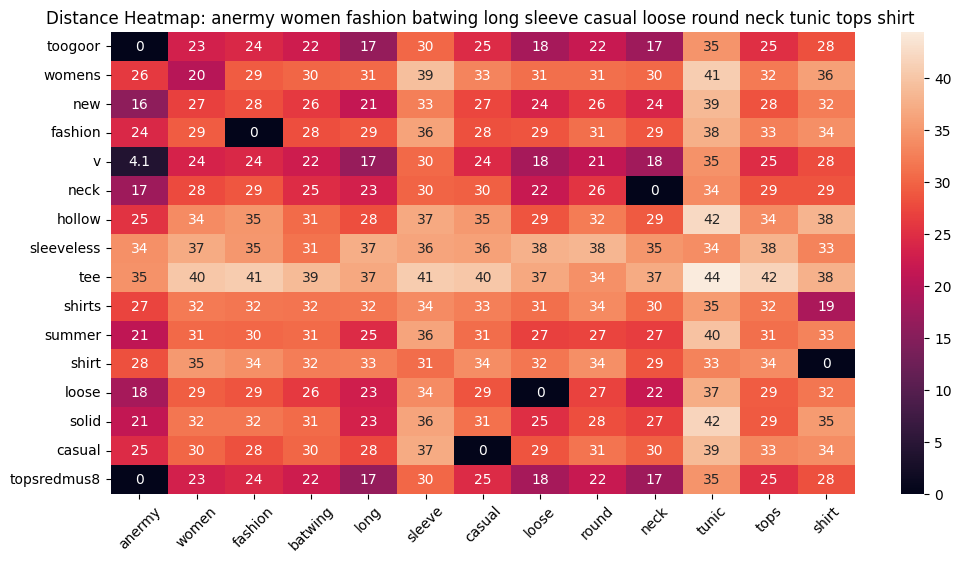

ASIN: B01A6CZMM2
Brand: Anermy
cosine similarity from input: 0.1470281481742859


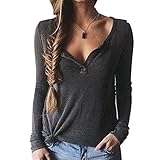

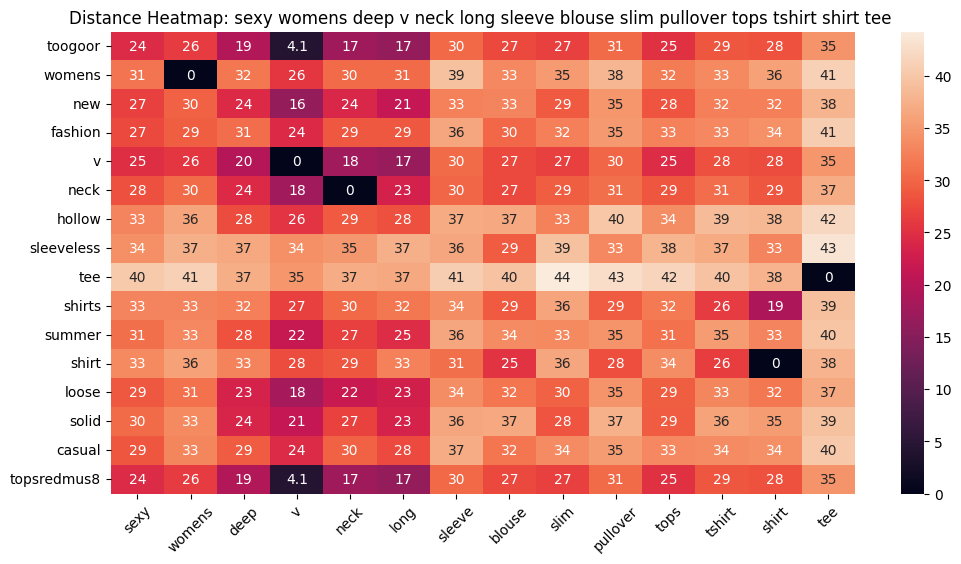

ASIN: B016UMLKIW
Brand: Innovateyfm
cosine similarity from input: 0.1482885479927063


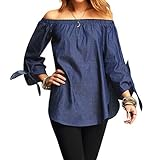

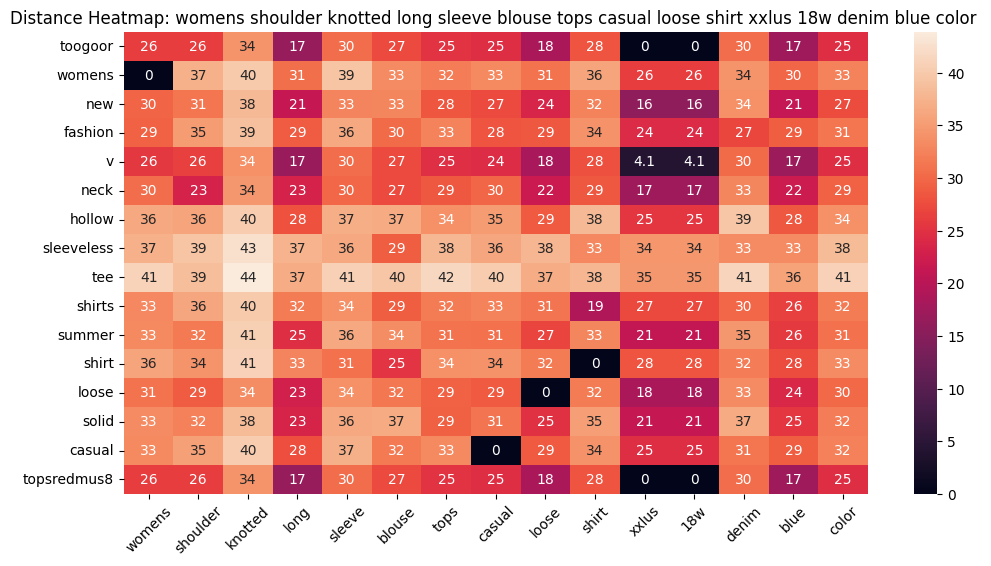

ASIN: B06XX2Q8N5
Brand: Armear
cosine similarity from input: 0.15008527040481567


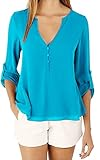

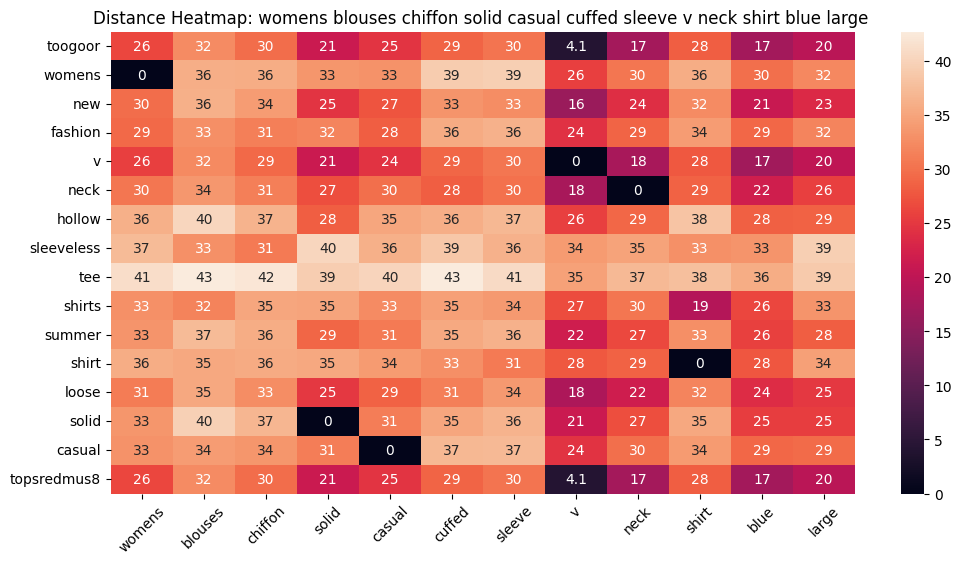

ASIN: B01I50AZ24
Brand: Manzocha
cosine similarity from input: 0.15170323848724365


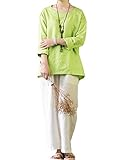

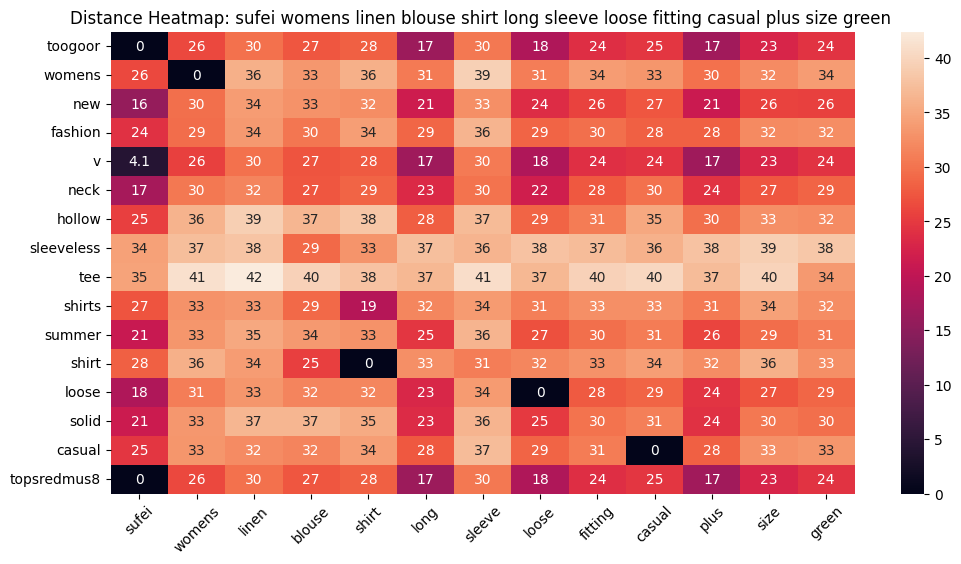

ASIN: B074SVS1HY
Brand: Sufei
cosine similarity from input: 0.15194588899612427


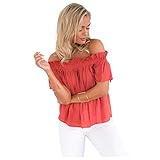

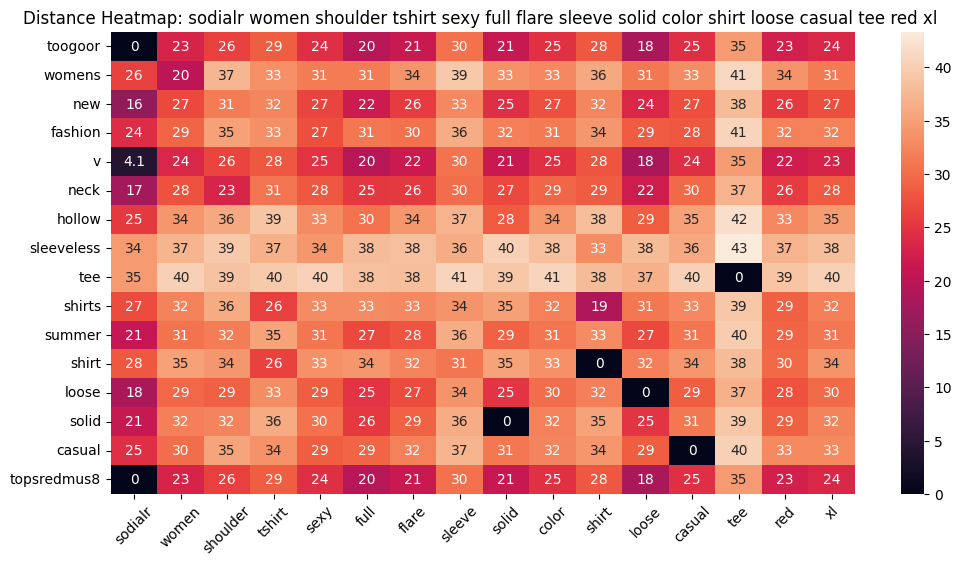

ASIN: B073WBF4D8
Brand: SODIAL(R)
cosine similarity from input: 0.1533043384552002


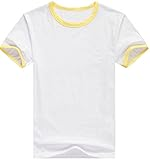

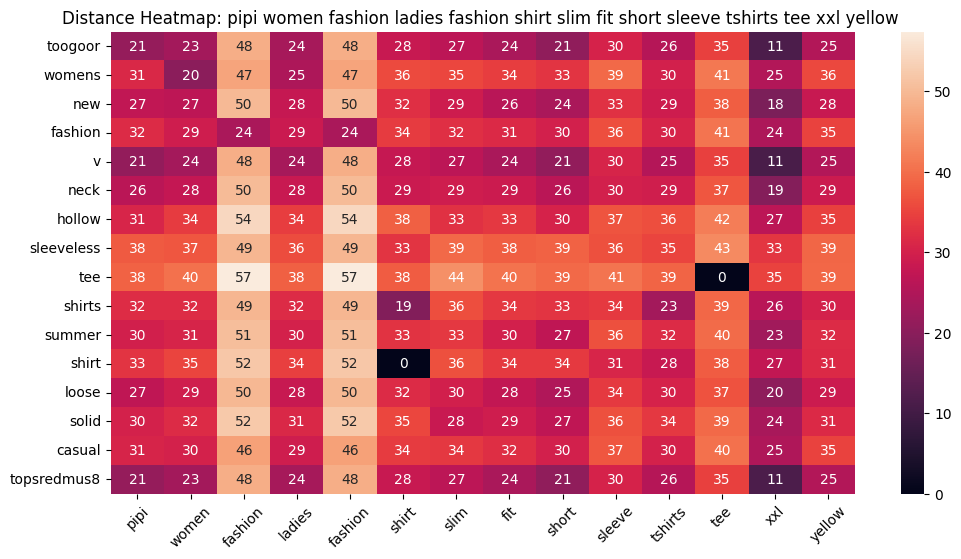

ASIN: B01C8KWOFI
Brand: Absolutely
cosine similarity from input: 0.15726375579833984


In [164]:
# Call the function
weighted_w2v_model(12566, 20)

Batches: 100%|███████████████████████████████████████████████████████████████████████| 523/523 [04:55<00:00,  1.77it/s]


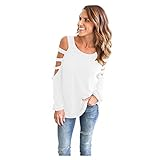

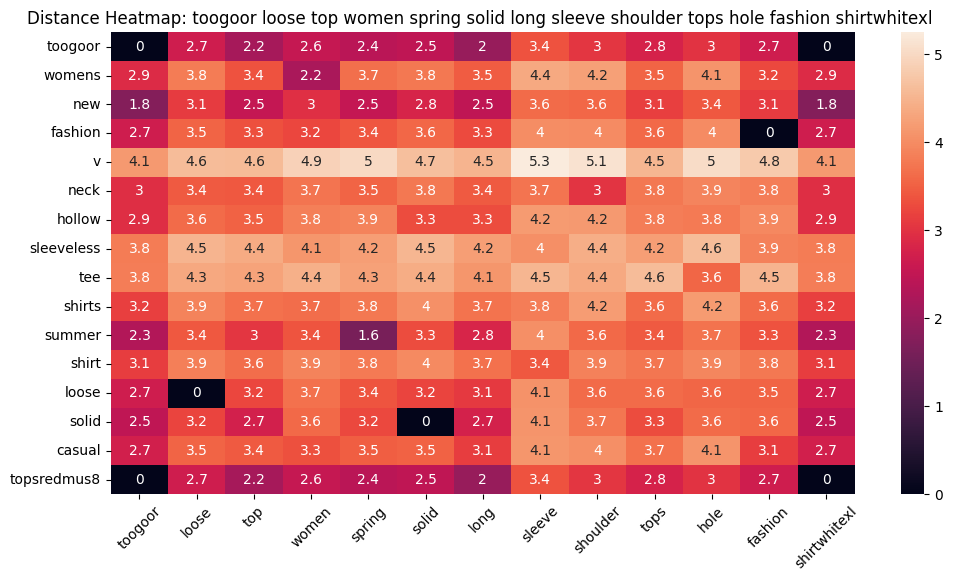

Title: toogoor loose top women spring solid long sleeve shoulder tops hole fashion shirtwhitexl 
Brand: TOOGOO(R)
Similarity Score: 0.8727


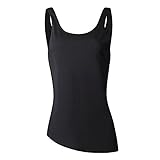

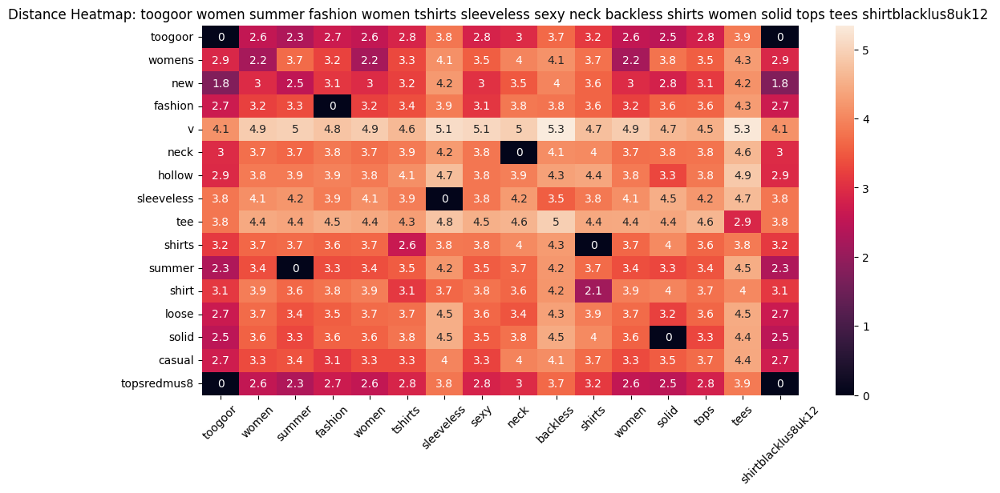

Title: toogoor women summer fashion women tshirts sleeveless sexy neck backless shirts women solid tops tees shirtblacklus8uk12 
Brand: TOOGOO(R)
Similarity Score: 0.8338


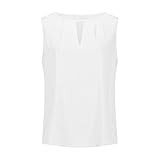

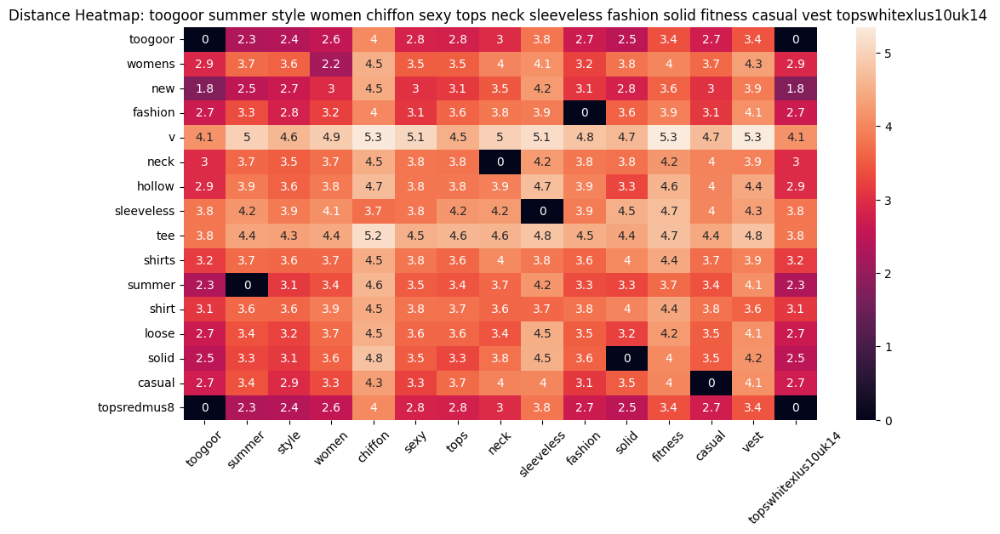

Title: toogoor summer style women chiffon sexy tops neck sleeveless fashion solid fitness casual vest topswhitexlus10uk14 
Brand: TOOGOO(R)
Similarity Score: 0.8008


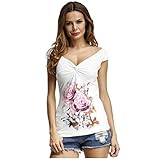

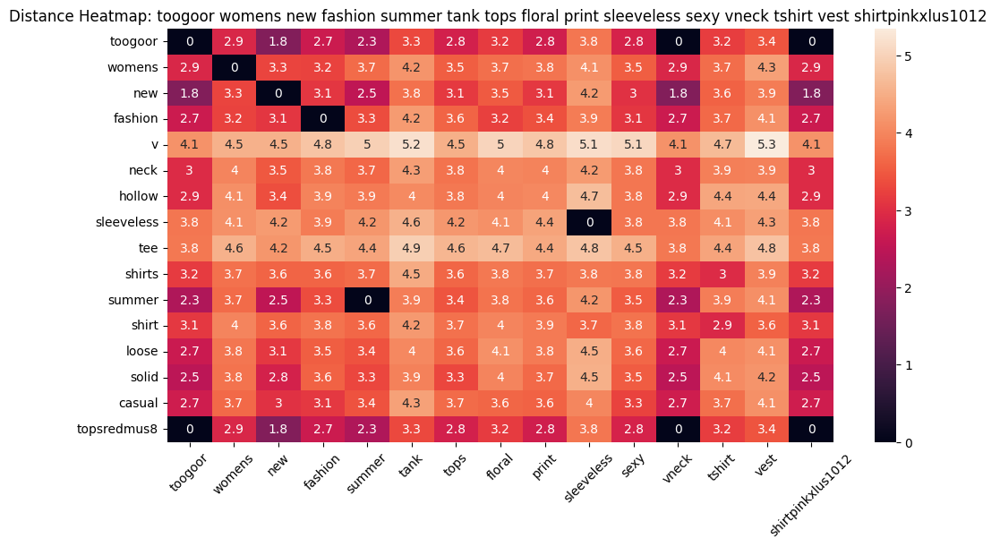

Title: toogoor womens new fashion summer tank tops floral print sleeveless sexy vneck tshirt vest shirtpinkxlus1012 
Brand: TOOGOO(R)
Similarity Score: 0.7833


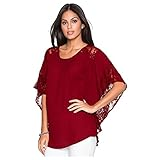

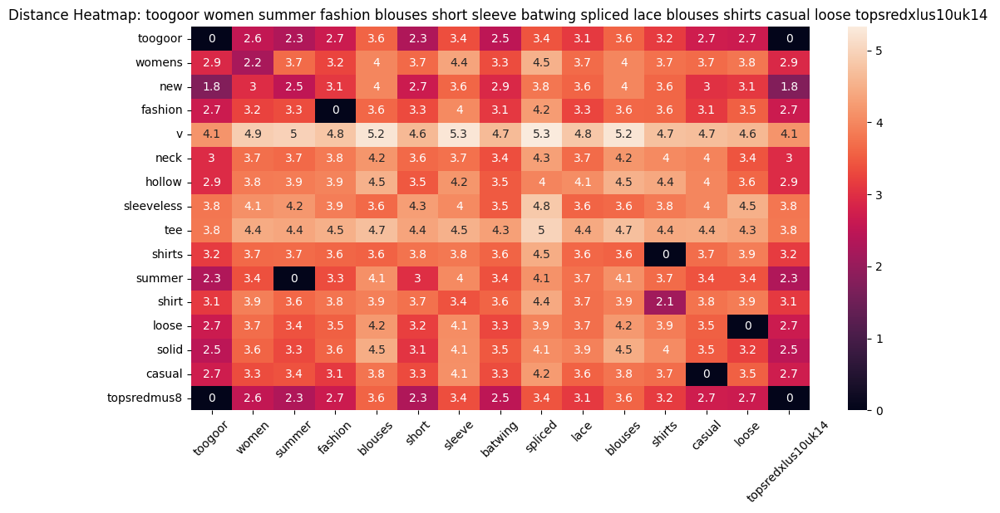

Title: toogoor women summer fashion blouses short sleeve batwing spliced lace blouses shirts casual loose topsredxlus10uk14 
Brand: TOOGOO(R)
Similarity Score: 0.7736


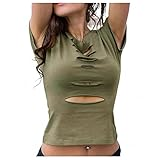

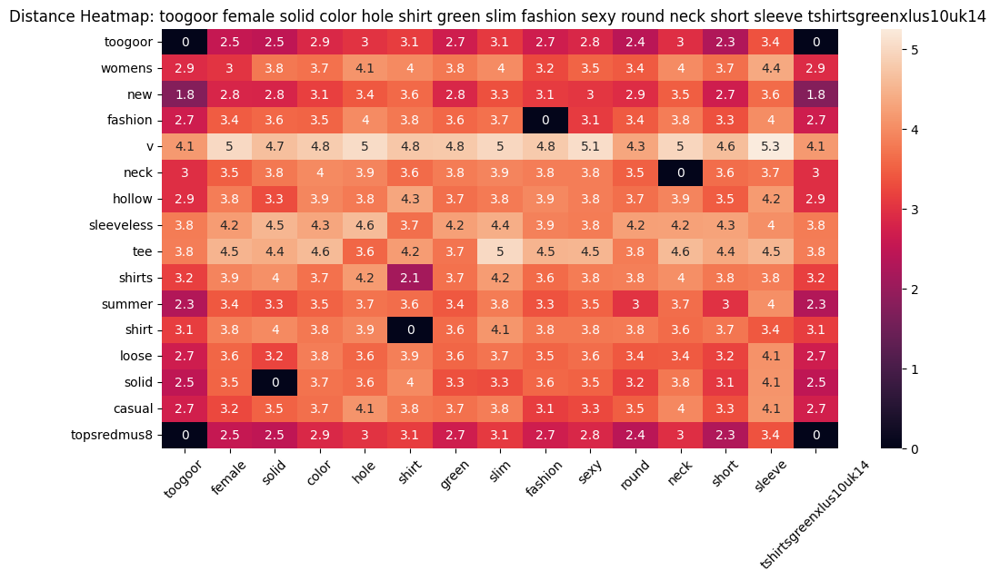

Title: toogoor female solid color hole shirt green slim fashion sexy round neck short sleeve tshirtsgreenxlus10uk14 
Brand: TOOGOO(R)
Similarity Score: 0.7590


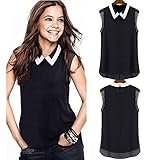

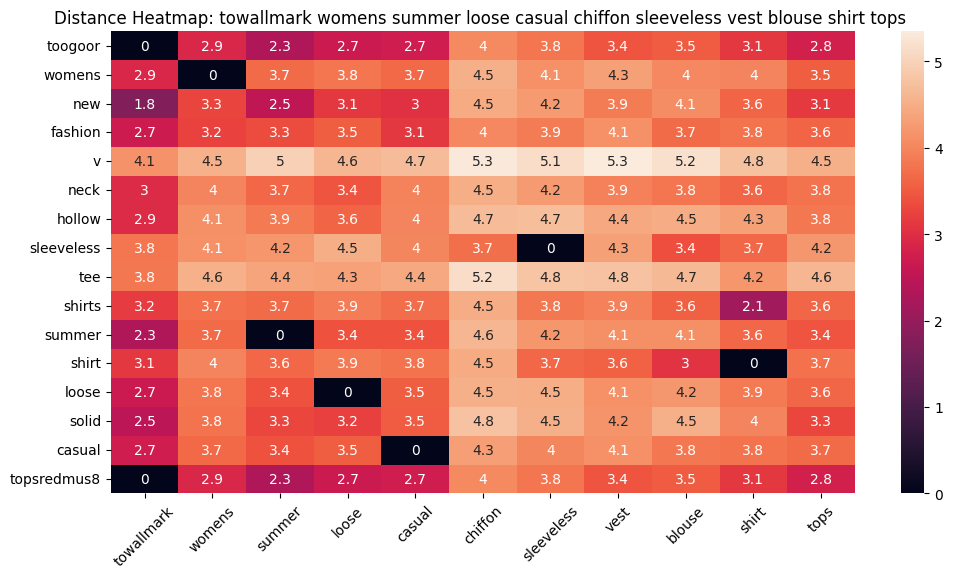

Title: towallmark womens summer loose casual chiffon sleeveless vest blouse shirt tops 
Brand: Towallmark
Similarity Score: 0.7516


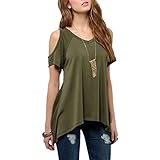

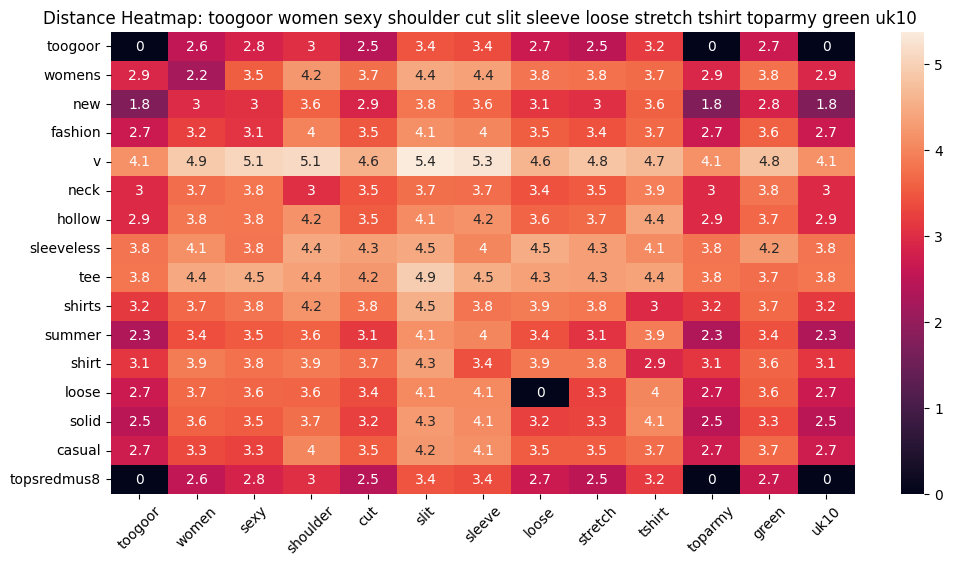

Title: toogoor women sexy shoulder cut slit sleeve loose stretch tshirt toparmy green uk10 
Brand: TOOGOO(R)
Similarity Score: 0.7498


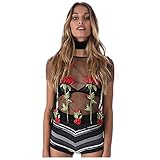

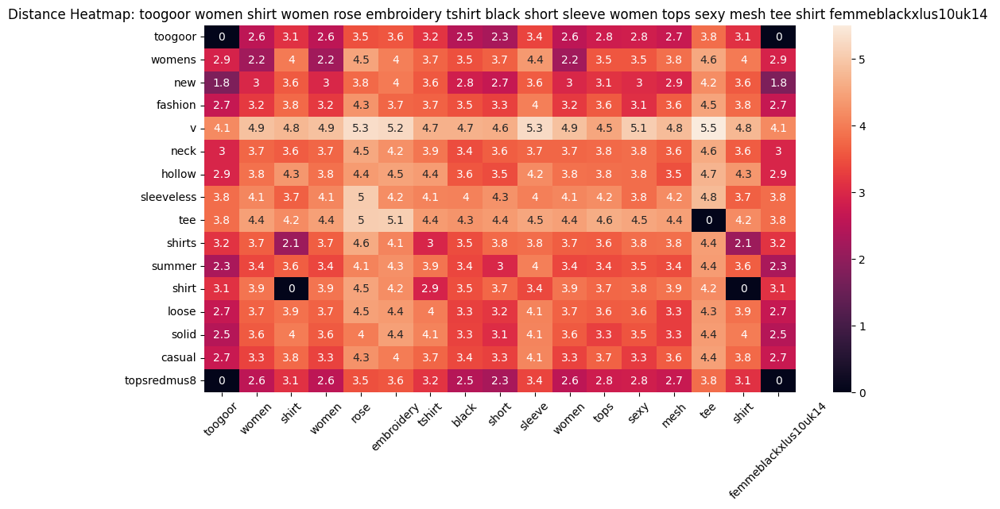

Title: toogoor women shirt women rose embroidery tshirt black short sleeve women tops sexy mesh tee shirt femmeblackxlus10uk14 
Brand: TOOGOO(R)
Similarity Score: 0.7435


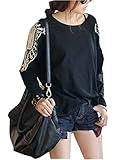

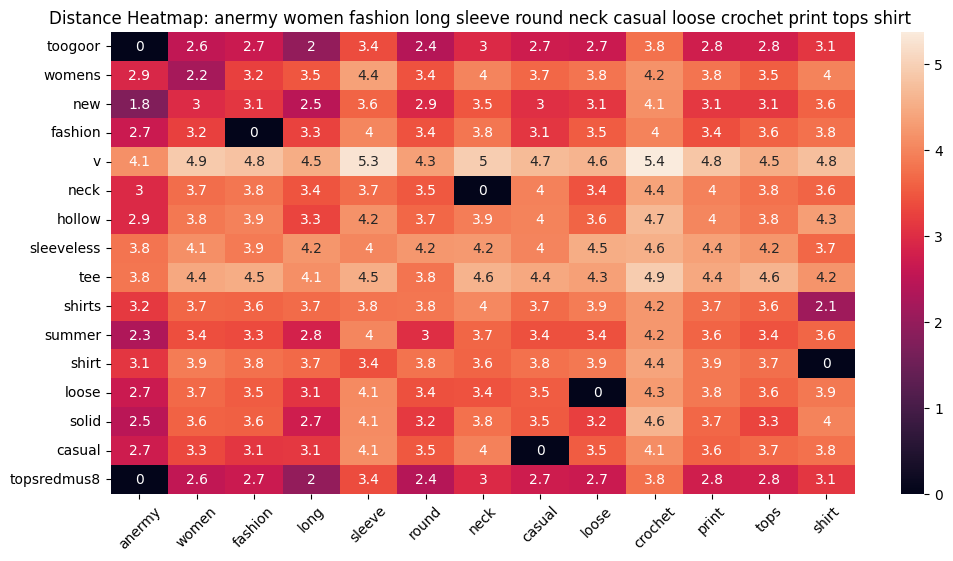

Title: anermy women fashion long sleeve round neck casual loose crochet print tops shirt 
Brand: Anermy
Similarity Score: 0.7402


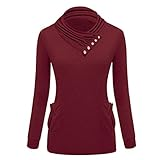

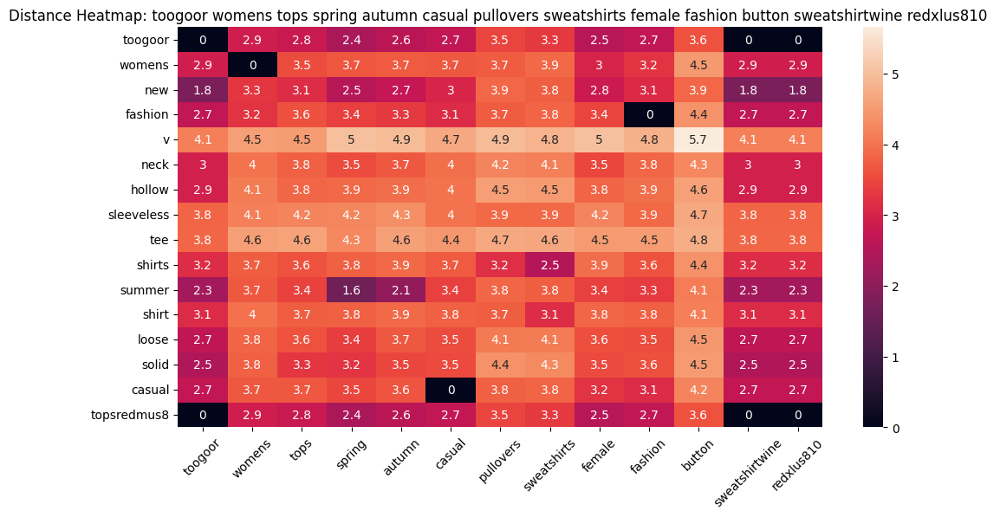

Title: toogoor womens tops spring autumn casual pullovers sweatshirts female fashion button sweatshirtwine redxlus810 
Brand: TOOGOO(R)
Similarity Score: 0.7355


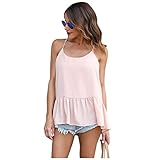

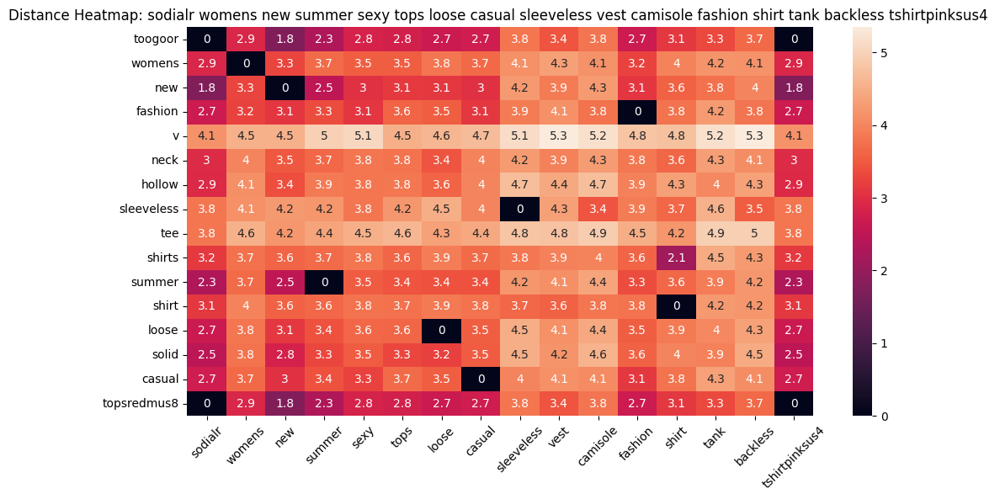

Title: sodialr womens new summer sexy tops loose casual sleeveless vest camisole fashion shirt tank backless tshirtpinksus4 
Brand: SODIAL(R)
Similarity Score: 0.7310


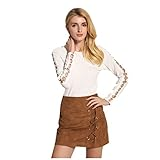

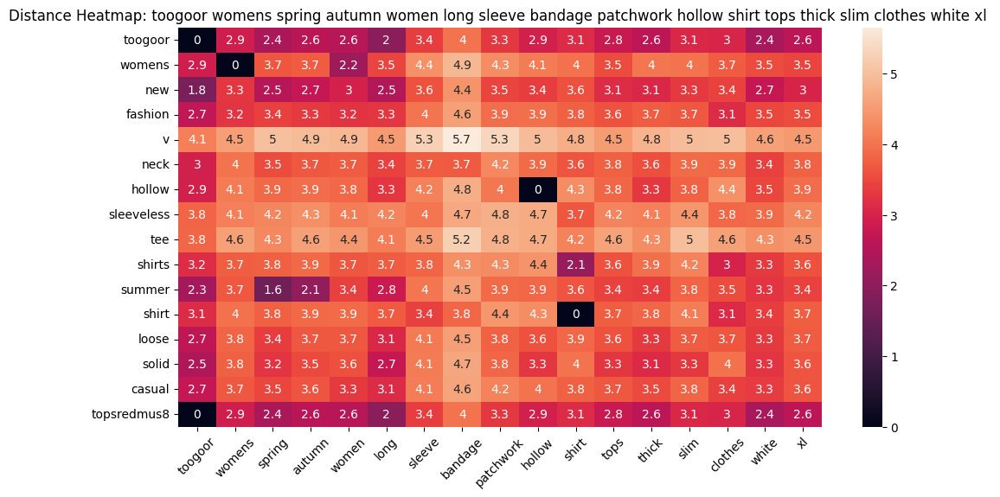

Title: toogoor womens spring autumn women long sleeve bandage patchwork hollow shirt tops thick slim clothes white xl 
Brand: TOOGOO(R)
Similarity Score: 0.7284


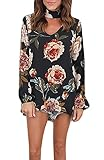

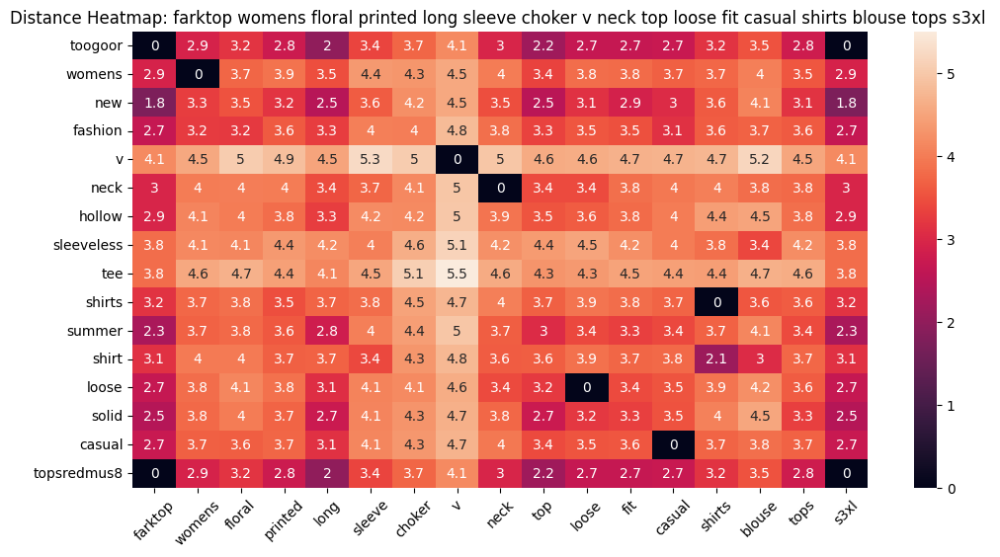

Title: farktop womens floral printed long sleeve choker v neck top loose fit casual shirts blouse tops s3xl 
Brand: Farktop
Similarity Score: 0.7284


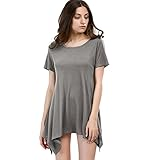

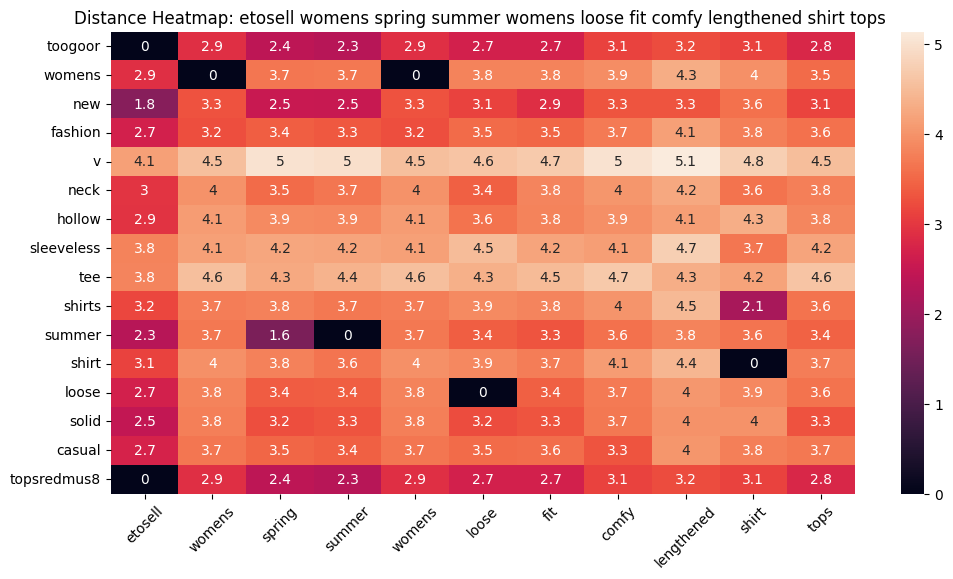

Title: etosell womens spring summer womens loose fit comfy lengthened shirt tops 
Brand: Etosell
Similarity Score: 0.7282


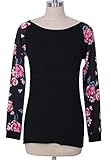

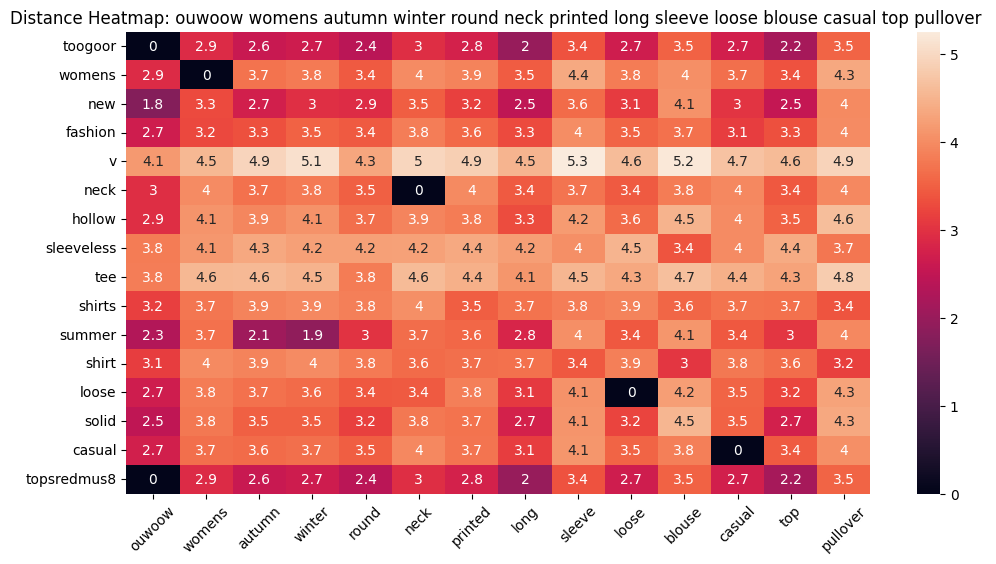

Title: ouwoow womens autumn winter round neck printed long sleeve loose blouse casual top pullover 
Brand: ouwoow
Similarity Score: 0.7279


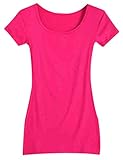

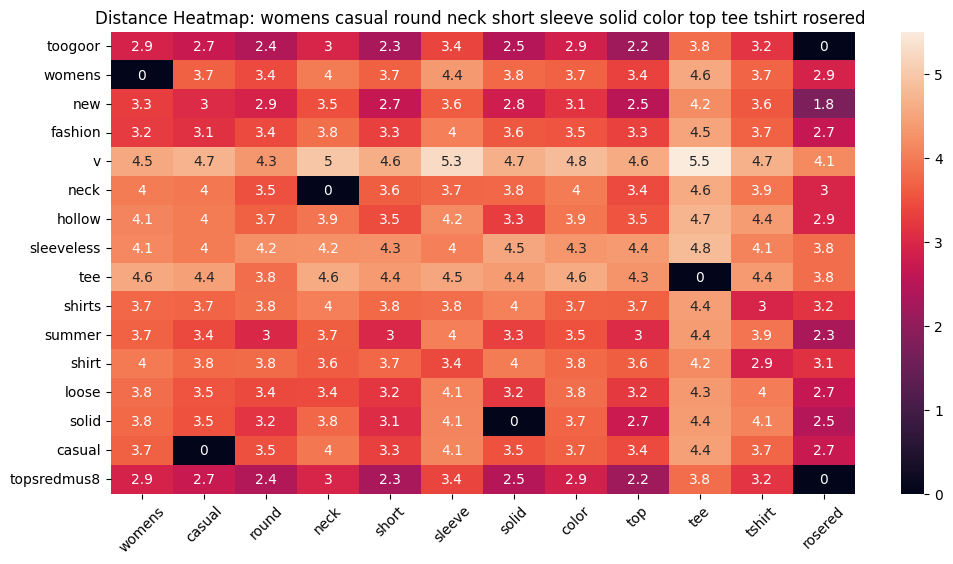

Title: womens casual round neck short sleeve solid color top tee tshirt rosered 
Brand: AM CLOTHES
Similarity Score: 0.7267


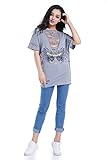

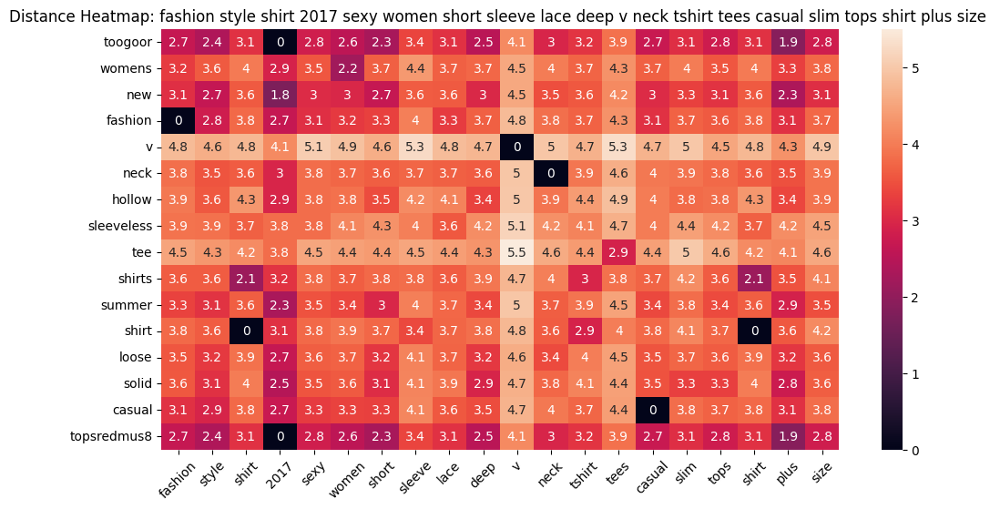

Title: fashion style shirt 2017 sexy women short sleeve lace deep v neck tshirt tees casual slim tops shirt plus size 
Brand: LHS Charmer
Similarity Score: 0.7234


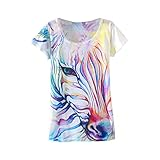

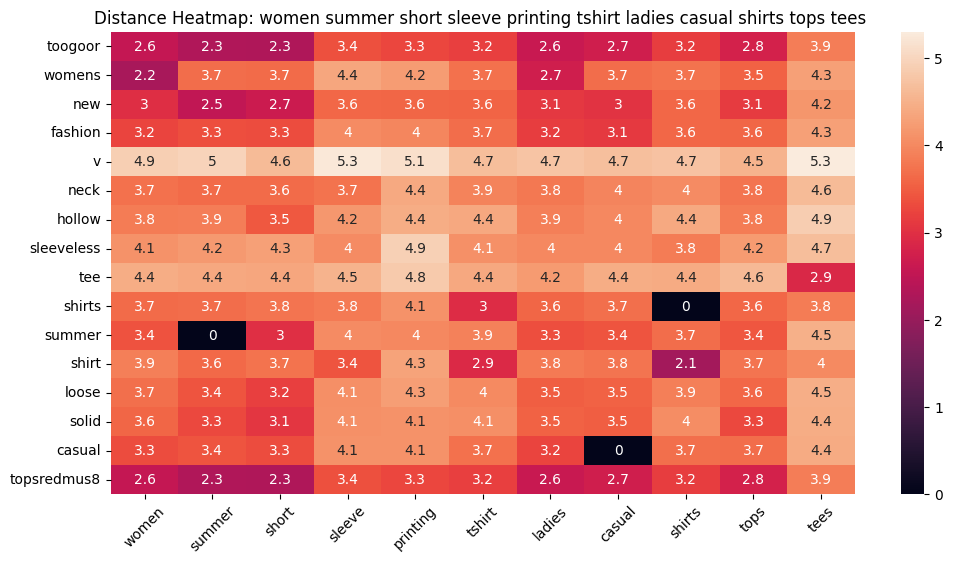

Title: women summer short sleeve printing tshirt ladies casual shirts tops tees 
Brand: Rbwinner
Similarity Score: 0.7213


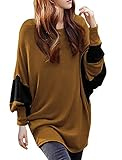

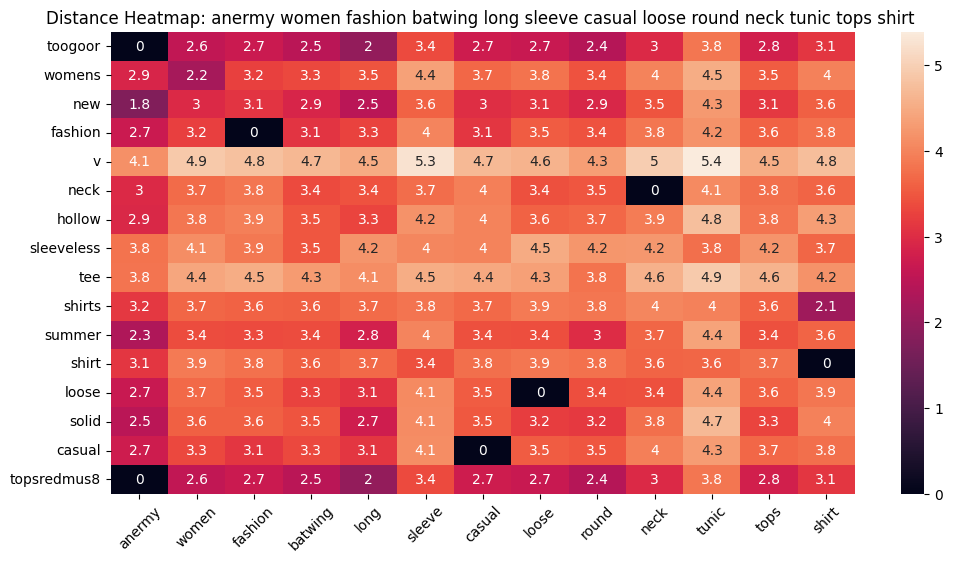

Title: anermy women fashion batwing long sleeve casual loose round neck tunic tops shirt 
Brand: Anermy
Similarity Score: 0.7205


In [165]:
# transformer 
# Load a strong pre-trained SBERT model
sbert_model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Titles of products in your dataset
titles = data['title'].tolist()

# Generate SBERT embeddings
sbert_embeddings = sbert_model.encode(titles, show_progress_bar=True)
sbert_cosine = []
def sbert_recommender(doc_id, num_results=10):
    query_vec = sbert_embeddings[doc_id].reshape(1, -1)
    sim_scores = cosine_similarity(query_vec, sbert_embeddings)[0]
    
    # Get top N indices (excluding itself)
    top_indices = np.argsort(sim_scores)[::-1][1:num_results+1]

    for idx in top_indices:
        heat_map_w2v(
            data['title'].iloc[doc_id],         # Query title
            data['title'].iloc[idx],            # Match title
            data['medium_image_url'].iloc[idx], # Image
            doc_id, idx,                        # Doc IDs
            'sbert'                             # Label
        )
        print(f"Title: {data['title'].iloc[idx]}")
        print(f"Brand: {data['brand'].iloc[idx]}")
        print(f"Similarity Score: {sim_scores[idx]:.4f}")
        sbert_cosine.append(sim_scores[idx])
        print("="*100)

sbert_recommender(12566, 20)

In [175]:
# weighted similarity using brand and color
from IPython.display import Image, display
brand_colour_cosine=[]
def weighted_similarity_bc(doc_id, sbert_embeddings, data, weight_text=0.7, weight_brand_color=0.8):
    # Step 1: Compute text similarity (SBERT embeddings)
    query_vec = sbert_embeddings[doc_id].reshape(1, -1)
    sim_scores_text = cosine_similarity(query_vec, sbert_embeddings)[0]
    
    # Step 2: Compute brand and color similarity
    brand_color_similarity = np.array([1 if data['brand'].iloc[doc_id] == data['brand'].iloc[i] and data['color'].iloc[doc_id] == data['color'].iloc[i] else 0 for i in range(len(data))])
    
    # Step 3: Combine text, brand, and color similarity with respective weights
    combined_similarity = (weight_text * sim_scores_text) + (weight_brand_color * brand_color_similarity)
    
    # Step 4: Get top k similar items
    top_k = 20
    indices = np.argsort(combined_similarity)[::-1][1:top_k+1]  # skip self
    
    # Step 5: Display results
    for idx in indices:
         display(Image(url=data['medium_image_url'].iloc[idx]))
         print(f"Title: {data['title'].iloc[idx]}")
         print(f"Brand: {data['brand'].iloc[idx]}")
         print(f"Color: {data['color'].iloc[idx]}")
         print(f"Similarity Score: {combined_similarity[idx]:.4f}")
         brand_colour_cosine.append(combined_similarity[idx])
         print("="*100)

In [176]:
weighted_similarity_bc(12566, sbert_embeddings, data)

Title: toogoor women summer fashion blouses short sleeve batwing spliced lace blouses shirts casual loose topsredxlus10uk14 
Brand: TOOGOO(R)
Color: Red
Similarity Score: 1.3416


Title: toogoor loose top women spring solid long sleeve shoulder tops hole fashion shirtwhitexl 
Brand: TOOGOO(R)
Color: White
Similarity Score: 0.6109


Title: toogoor women summer fashion women tshirts sleeveless sexy neck backless shirts women solid tops tees shirtblacklus8uk12 
Brand: TOOGOO(R)
Color: Black
Similarity Score: 0.5837


Title: toogoor summer style women chiffon sexy tops neck sleeveless fashion solid fitness casual vest topswhitexlus10uk14 
Brand: TOOGOO(R)
Color: White
Similarity Score: 0.5606


Title: toogoor womens new fashion summer tank tops floral print sleeveless sexy vneck tshirt vest shirtpinkxlus1012 
Brand: TOOGOO(R)
Color: Pink
Similarity Score: 0.5483


Title: toogoor female solid color hole shirt green slim fashion sexy round neck short sleeve tshirtsgreenxlus10uk14 
Brand: TOOGOO(R)
Color: Green
Similarity Score: 0.5313


Title: towallmark womens summer loose casual chiffon sleeveless vest blouse shirt tops 
Brand: Towallmark
Color: Black
Similarity Score: 0.5261


Title: toogoor women sexy shoulder cut slit sleeve loose stretch tshirt toparmy green uk10 
Brand: TOOGOO(R)
Color: Army Green
Similarity Score: 0.5249


Title: toogoor women shirt women rose embroidery tshirt black short sleeve women tops sexy mesh tee shirt femmeblackxlus10uk14 
Brand: TOOGOO(R)
Color: Black
Similarity Score: 0.5204


Title: anermy women fashion long sleeve round neck casual loose crochet print tops shirt 
Brand: Anermy
Color: Black
Similarity Score: 0.5181


Title: toogoor womens tops spring autumn casual pullovers sweatshirts female fashion button sweatshirtwine redxlus810 
Brand: TOOGOO(R)
Color: Wine Red
Similarity Score: 0.5149


Title: sodialr womens new summer sexy tops loose casual sleeveless vest camisole fashion shirt tank backless tshirtpinksus4 
Brand: SODIAL(R)
Color: Pink
Similarity Score: 0.5117


Title: toogoor womens spring autumn women long sleeve bandage patchwork hollow shirt tops thick slim clothes white xl 
Brand: TOOGOO(R)
Color: White
Similarity Score: 0.5099


Title: farktop womens floral printed long sleeve choker v neck top loose fit casual shirts blouse tops s3xl 
Brand: Farktop
Color: Black
Similarity Score: 0.5099


Title: etosell womens spring summer womens loose fit comfy lengthened shirt tops 
Brand: Etosell
Color: Gray
Similarity Score: 0.5098


Title: ouwoow womens autumn winter round neck printed long sleeve loose blouse casual top pullover 
Brand: ouwoow
Color: Black2
Similarity Score: 0.5095


Title: womens casual round neck short sleeve solid color top tee tshirt rosered 
Brand: AM CLOTHES
Color: RoseRed
Similarity Score: 0.5087


Title: fashion style shirt 2017 sexy women short sleeve lace deep v neck tshirt tees casual slim tops shirt plus size 
Brand: LHS Charmer
Color: Gray
Similarity Score: 0.5064


Title: women summer short sleeve printing tshirt ladies casual shirts tops tees 
Brand: Rbwinner
Color: Colorful
Similarity Score: 0.5049


Title: anermy women fashion batwing long sleeve casual loose round neck tunic tops shirt 
Brand: Anermy
Color: Chocolate Color
Similarity Score: 0.5043


In [177]:
# autoencoder 
from IPython.display import Image, display
# Assuming `embeddings` is your SBERT or W2V matrix (shape: [n_samples, 384])
tensor_data = torch.tensor(sbert_embeddings, dtype=torch.float32)
dataset = TensorDataset(tensor_data)
loader = DataLoader(dataset, batch_size=64, shuffle=True)

# build the autoencoder
class Autoencoder(nn.Module):
    def __init__(self, input_dim=384, latent_dim=64):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, latent_dim)
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.ReLU(),
            nn.Linear(256, input_dim)
        )
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded


In [178]:
# train the autoencoder
model = Autoencoder()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

for epoch in range(20):
    total_loss = 0
    for batch in loader:
        x = batch[0]
        optimizer.zero_grad()
        output = model(x)
        loss = loss_fn(output, x)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}, Loss: {total_loss:.4f}")

# extract the encoded vectors
with torch.no_grad():
    compressed_vectors = model.encoder(tensor_data).numpy()
# recommend 10 similar products
# Example: recommend 5 similar items for doc_id
auto_sim = []
doc_id = 12566
query_vec = compressed_vectors[doc_id].reshape(1, -1)
sim_scores = cosine_similarity(query_vec, compressed_vectors)[0]

top_k = 20
indices = np.argsort(sim_scores)[::-1][1:top_k+1]  # skip self

for idx in indices:
    display(Image(url=data['medium_image_url'].iloc[idx]))
    print(f"Title: {data['title'].iloc[idx]}")
    print(f"Similarity: {sim_scores[idx]:.4f}")
    auto_sim.append(sim_scores[idx])
    print("="*100)

Epoch 1, Loss: 0.3137
Epoch 2, Loss: 0.1783
Epoch 3, Loss: 0.1548
Epoch 4, Loss: 0.1485
Epoch 5, Loss: 0.1454
Epoch 6, Loss: 0.1432
Epoch 7, Loss: 0.1415
Epoch 8, Loss: 0.1403
Epoch 9, Loss: 0.1396
Epoch 10, Loss: 0.1388
Epoch 11, Loss: 0.1377
Epoch 12, Loss: 0.1369
Epoch 13, Loss: 0.1363
Epoch 14, Loss: 0.1356
Epoch 15, Loss: 0.1347
Epoch 16, Loss: 0.1340
Epoch 17, Loss: 0.1337
Epoch 18, Loss: 0.1335
Epoch 19, Loss: 0.1330
Epoch 20, Loss: 0.1326


Title: toogoor loose top women spring solid long sleeve shoulder tops hole fashion shirtwhitexl 
Similarity: 0.8397


Title: toogoor women summer fashion women tshirts sleeveless sexy neck backless shirts women solid tops tees shirtblacklus8uk12 
Similarity: 0.7858


Title: toogoor women summer fashion blouses short sleeve batwing spliced lace blouses shirts casual loose topsredxlus10uk14 
Similarity: 0.7386


Title: etosell womens spring summer womens loose fit comfy lengthened shirt tops 
Similarity: 0.7219


Title: ouwoow womens autumn winter round neck printed long sleeve loose blouse casual top pullover 
Similarity: 0.7171


Title: toogoor summer style women chiffon sexy tops neck sleeveless fashion solid fitness casual vest topswhitexlus10uk14 
Similarity: 0.7119


Title: focal20 earth print shirt short sleeve neck tee casual loose tops home sweet home letter tee 
Similarity: 0.7093


Title: sodialr womens new summer sexy tops loose casual sleeveless vest camisole fashion shirt tank backless tshirtpinksus4 
Similarity: 0.6951


Title: fifth degree womens funny printed los angeles graphic printed shirts loose tops tees  
Similarity: 0.6950


Title: women summer short sleeve printing tshirt ladies casual shirts tops tees 
Similarity: 0.6939


Title: towallmark womens summer loose casual chiffon sleeveless vest blouse shirt tops 
Similarity: 0.6884


Title: anermy women fashion long sleeve round neck casual loose crochet print tops shirt 
Similarity: 0.6859


Title: toogoor womens new fashion summer tank tops floral print sleeveless sexy vneck tshirt vest shirtpinkxlus1012 
Similarity: 0.6852


Title: fashion style shirt 2017 sexy women short sleeve lace deep v neck tshirt tees casual slim tops shirt plus size 
Similarity: 0.6846


Title: aeneontrue womens summer v neck linen tee shirt casual top 
Similarity: 0.6823


Title: toogoor womens tops spring autumn casual pullovers sweatshirts female fashion button sweatshirtwine redxlus810 
Similarity: 0.6823


Title: womens loose fit casual cotton solid oneck short sleeve flare top long shirt 
Similarity: 0.6711


Title: yesno tk7 women loose shirt tops blouses pattern printed 100 linen casual fit raglan sleeve hilow fringed hem side split 
Similarity: 0.6707


Title: summer fashion life gone vintage tshirt women shirts top 
Similarity: 0.6687


Title: yichun summer girl womens tops cupid printed tees tshirts casual 
Similarity: 0.6687


### Comparing the models

In [193]:
print(type(bag_of_words_euclidean), np.array(bag_of_words_euclidean).shape)
print(type(tf_idf_euclidean), np.array(tf_idf_euclidean).shape)
print(type(idf_cosine), np.array(idf_cosine).shape)
print(type(avg_w2v_cosine), np.array(avg_w2v_cosine).shape)
print(type(weighted_w2v_cosine), np.array(weighted_w2v_cosine).shape)
print(type(sbert_cosine), np.array(sbert_cosine).shape)
print(type(brand_colour_cosine), np.array(brand_colour_cosine).shape)
print(type(auto_sim), np.array(auto_sim).shape)


<class 'list'> (20,)
<class 'list'> (20,)
<class 'list'> (20,)
<class 'list'> (20,)
<class 'list'> (20,)
<class 'list'> (20,)
<class 'list'> (20,)
<class 'list'> (20,)


In [183]:
# flatten
avg_w2v_cosine = [i[0] if isinstance(i, (list, np.ndarray)) else i for i in avg_w2v_cosine]

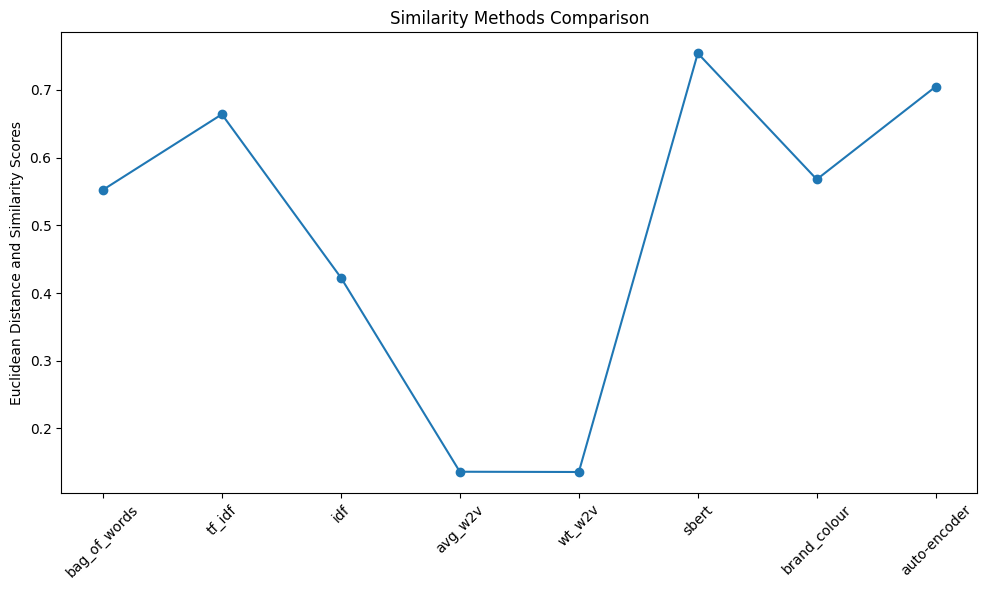

In [194]:
scores = []
num_results = 20
scores.append(sum(bag_of_words_euclidean) / num_results)
scores.append(sum(tf_idf_euclidean) / num_results)
scores.append(sum(idf_cosine) / num_results)
scores.append(sum(avg_w2v_cosine) / num_results)
scores.append(sum(weighted_w2v_cosine) / num_results)
scores.append(sum(sbert_cosine) / num_results)
scores.append(sum(brand_colour_cosine) / num_results)
scores.append(sum(auto_sim) / num_results)

objects = ('bag_of_words', 'tf_idf', 'idf', 'avg_w2v', 'wt_w2v', 'sbert', 'brand_colour', 'auto-encoder')
x_pos = np.arange(len(objects))

plt.figure(figsize=(10, 6))
plt.plot(x_pos, scores, marker='o')
plt.xticks(x_pos, objects, rotation=45)
plt.ylabel('Euclidean Distance and Similarity Scores')
plt.title('Similarity Methods Comparison')
plt.tight_layout()
plt.show()
data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAA9sAAAJOCAYAAACnVRSYAAAAOnRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjEwLjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvc2/+5QAAAAlwSFlzAAAPYQAAD2EBqD+naQAAwj9JREFUeJzs3QV4leUbx/HfemxsI8bo7k5pBBUFQRBbDBA7UbEDUOzC/ouKoGJhIDagSHd3d8OIDQbr/a/ngc0BAzY423vi+7muc+09sbObnbGd+33u5779MjIyMgQAAAAAAFzG33VPBQAAAAAADJJtAAAAAABcjGQbAAAAAAAXI9kGAAAAAMDFSLYBAAAAAHAxkm0AAAAAAFyMZBsAAAAAABcj2QYAAAAAwMVItgEAAAAAcDGSbQDAOalUqZJuueUWlz6nn5+fnnvuuazrn3/+ub1t48aNLv06HTp0sBdvZr6P5nsXGxvrkT8LvozvJwB4NpJtAECOlixZoquvvloVK1ZUaGioypYtq4svvljvv/++vNX27dttcrpw4cJ8SXj9/f21ZcuWk+6Pj49XoUKF7GPuv//+s/oaL7/8skaPHi1vsmvXLj366KOqVauWwsLCFB4erqZNm+rFF1/UgQMHnA4PAIDTCjz93QAAXzR9+nRdcMEFqlChgu644w6VKlXKJokzZ87Uu+++qwceeCDrsatWrbJJpCsdOXJEgYH5/ydq3LhxJyXbzz//vF1RbNSokcu/XkhIiL799ls9/vjjx90+atSoc35uk2ybkyM9evSQN5gzZ466dOmiQ4cO6aabbrJJtjF37ly9+uqrmjx58kmvn7fJj/9bAICCQ7INADjJSy+9pKioKJvwFClS5Lj7du/efVIC6WpmJT0/HT582K6UBgcHqyCZ5DGnZPubb75R165d9dNPPxVoPO7KrFpfccUVCggI0IIFC+zK9ok/n59++qm8UUZGhhITE22lQ3783wIAFBxOlwIATrJu3TrVrVv3pETbiImJOe2+0sz91VOnTlXfvn1VokQJ+zx33XWXkpOTbSLVq1cvFS1a1F5M4mkSjNPt2c7JL7/8YhPUMmXK2KSkatWqeuGFF5SWlnbc48ye7Hr16mnevHk6//zzbZL99NNPn7Rne+LEiTrvvPPscZ8+fWwM5mL+PQMHDlRQUJD27NlzUhx33nmn/feZBOlMbrjhBluivnLlyqzbdu7cqX///dfel5OkpCT79atVq2b/neXLl7ffM3N79u9XQkKCvvjii6y4T9zra77v5jYTqzmRYv6N5qRDdqmpqfZ7aL6X5muZ19Z8r7J/LcO8XqaUu1y5cvb7aaogli1bdlLsKSkptlKgevXq9gRK8eLF1bZtW/3999+n/T59/PHH2rZtmwYPHnxSom2ULFlSzz777HG3/e9//7M/syZu8zNx3333nVRqnvmzsHjxYrVv397Gbr6vP/74o71/0qRJatGihU10a9asqX/++SfH7QDm9bv22msVGRlp/00PPvjgSa//8OHDdeGFF9r/LyamOnXq6KOPPjrp32K+x5dddpnGjh2rZs2a2a9t/v2Z92V/HXP7/TQ/T+3atbNl9+b1vvzyy7VixYoc/y1r1649488FAODskGwDAE5i9mmb5HTp0qVn/Rym1HzNmjU2Oejevbs++eQT9e/fX926dbMJsSl7NonCG2+8oREjRuT5+U0SXLhwYfXr18+Wtpsy4wEDBujJJ5886bF79+7VpZdeakvD33nnHZscnqh27doaNGhQVgJtYjIXk6DffPPNNhEdOXLkcZ9jTh6YRO2qq67K1Wq8eS6ToJqV7EzmOc2/w5w4OFF6err93r355pv2+2b2y5sy8bffflvXXXdd1uNMnCahMwlWZtzm5EZ2Jjk8ePCgXnnlFXtsvn/mtcnu9ttvt9/DJk2a2K9hElLz+Ouvv/64x5nHmNeyYcOG9vWrUqWKLrnkEpvwn5jQma9hvt8ffPCBnnnmGbs1Yf78+af9Pv3666826TRl8blhvo5Jrk2S/dZbb9nXwySsJiaToGa3f/9+m9yapPr111+33zfz7zOvg/loqg9Mmbr5t5ivb75nJzLfP5Ncm++Nefx7771nf2ayM4m1+X9kTlaYmMxJknvvvVcffvhhjuXiPXv2tD0RzM/yqbYw5Ob7aU4QdOrUyVagmMeb/x9mW0ibNm1ybDCYm58LAMBZygAA4ATjxo3LCAgIsJdWrVplPP744xljx47NSE5OPumxFStWzOjdu3fW9eHDh5tl6oxOnTplpKenZ91unsfPzy/j7rvvzrotNTU1o1y5chnt27c/7jnN5w8cOPCk59ywYUPWbYcPHz4plrvuuisjLCwsIzExMes289zmc4cMGXLS48192b/2nDlz7GPN1zuRib9FixbH3TZq1Cj7+AkTJmScjvm3mMft2bMn49FHH82oVq1a1n3nnXdeRp8+fbL+3ffdd1/WfSNGjMjw9/fPmDJlynHPZ/4t5rHTpk3Lui08PPy41+HEr33rrbced/sVV1yRUbx48azrCxcutI+7/fbbj3ucidfc/u+//9rru3fvzggODs7o2rXrca/v008/bR+XPYaGDRvax+VV0aJF7efmRmY8l1xySUZaWlrW7R988IGNZ9iwYSf9LHzzzTdZt61cudLeZr7PM2fOzLrd/Lyf+LOQ+b3s3r37cTHce++99vZFixad9ufT/J+oUqXKSf9/zOeOGTPmjP+3cvP9bNSoUUZMTEzG3r17s24zcZl/X69evfL8cwEAOHusbAMATmJW2GbMmGFXVRctWmRXAM1qmelIblYdc+O2226zZaqZzEqiySfN7ZnMnlxTOrt+/fo8x2hWPjOZlTkz2sqs7JoS2Oxl2oZZvTTlsefClL7PmjXLlthn+vrrr+2KpVkBzi1TLm5Kd81++MyPpyoh/+GHH+yKuymlNv++zIspTzYmTJiQ66979913H3fdfK/Mir/phG78+eef9qNZCc3ukUcesR//+OOPrJVTs6JvKheyv74PPfTQSV/TlCab8nJT4ZAXJqaIiIhcPTYzHvP1szcTM439TJl3ZtyZTBVB9pV6Uy5u4jTfZ/MzminzOKefTbOKnl1mw8DM7+GJP59xcXH2dTM/J+b5zPXsKleubP9/ncmZvp87duyw2xRMWXixYsWybm/QoIH9P509vtz+XAAAzh7JNgAgR2b/sumSbcpuZ8+eraeeesomtaa0dvny5Wf8fFPemp3ZD2qY5PTE283XyCuTdJgmWubzTVJl9oabrtXGicmMOUlwrs3QTNm2SdpNgp35NX7//XfdeOONxyWdZ9K4cWObPJtScvNcptN7ZvJ8IpNUmX+n+bdlv9SoUSPHZnV5eT3Mfnkj83u/adMmm6yaPczZmfhMkmfuz3ycYfYNZ2fiynzOTKYs3+ybNvHWr19fjz32mN0vfSbm9cypfDsnmfGYpDk783qb8vbM+zOZMv4TXy/zM5TTz6WR08/mif92s8fdfO+yl2lPmzZNHTt2zNo3bb4/mb0Cckq2c+NM389TfS8MczLBJPwnlvqf6ecCAHD2SLYBAKdlkhaTeJs91mYfqtkDa1Zcz8SsWuf29hMbpJ2JSTjMKqFZdTcJyG+//WabRL322mtZe52zy77KeLZMEmL2+mYm22avtmkclpng54VZyTZ7hE3CbZL4U413Mv8Ok1SZf1tOF7MHOLdO9Xrk1JzOVcwedVMJMGzYMNuYbOjQoXY/uPl4OuZkxOrVq+2Ktavl5ecytz+bJ37PzL/5oosussmtafJmVtfN6/Xwww+f08/n2X4/T+dc/t0AgNNj9BcAINdMyXdmuaqTTOdwU+pqVt5NApJpw4YN5/S8Z0o0TSm56exsSr9N0m1WqU0H7LNJtk2TMfN9PF1zOLNiak4omMTtTLGda5JsmnmZJNCspptV0Ey7du2yJzfM/ZmPM8zjzMpxJtOpPafVUFPObEr4zcXMzDavl2ncZZqxnYppBme2MZhRaKZx2Jnizmwylj0ek6ibnwezuuxq5t+efTXabAcw3zvTPdwwJ3/MiRiz5SL7ynFeyv5P5XTfz+zfixOZrRXR0dF2pR0AUDBY2QYAnMQkBTmtbGXu+cypTLUgZa7GZY/RJFdm/NO5yExEThwZlcl0NDcJi1lBN2OizmZVOzOJNl3RTQfo5s2bn/Jxpju0GYGV00zpI0eOHFcSbGI/Vdy5YbpqGyau7MzKrJHZLd0kr2YMmumMnv37f+LnGeaEyIn7pU2Z+omjxHLaR1y6dGm7X9yscJ/IlM+b0WOZ8ZjqC9MRPHs8n332mS3XzqnL+7k6saO4+V5k/nyc6ufTxGLGgZ2LM30/zffMdDI3I+Cy/yyYqQLjxo3Leo0BAAWDlW0AwElMwyfTaMzsiTYlvSaRNeODTOmzWb0712Zj56p169a2rLt37952lrdZ1TUrxOda+mqSYLO/dsiQIbZBl0lgTaOszFVMk2Sa5lpm7JJJqM606no6ZjbzmZiRY99//71NPs0JEDO+yYxNM6uU5vbM2cyGGX1mmoWZ5NiMwDIxZ2/4dSZmjJf5fpoRbZll+mavvknczLixzHFpZu/xo48+ak8UmLJ6k8AtWLBAf/31lz0RkZ2ZLW1mW5vYzIrs3Llzbfn9/ffff9pYzGv7888/2+c2yaM5qWGewzBjrr799lu1atUqKx7TT8CMq+rcubNt6mdWds2JF7P94WxPiJyOWTE3X8d8PbMC/9VXX9lqBfM9NMzIMXMCwKzQmxFsZgXanDAxM7fPpSokN99PM4rNJP3m+2OaEZqTMuZkgNmDfqbZ9QAA1yLZBgCcxMx1NvuyzUq2Sb5Msm3KYc0e4WeffdYmpE4qXry4bU5mVj5NPCY5M0mVKbfOTVfnUzHJtEkuTfJmElwzW9usRmYvGTal5CbZNl/LrCTmJ7OXe/To0Xbm9ZdffmkT0LCwMFsubZL1zEZphkmyzaxn8/0wCZZJnPOSbBtm7695bjNr2Xwt0xzNfC8GDhx43OPMqrKZK25OSpiTAObrmJXTE1eRzYkQU0pt7jOrr6bM2Xyuaex1JuY5zYqsSR7NnmdzMsV8P0yJu5mlnj3BNEmkSbrN62L2RZtE1HwvTJ8B85q6mjnplDnTPTAw0MZi4sxkKj9MEmxeC3Niwnwf77nnHhvjrbfeetZfNzffT7PSP2bMGPuamRjNv9+cODHVGLltxAYAcA0/M//LRc8FAIDXM3uozWqrSX7NyjN8h0nqzQq62Z9+4io+AAAnYs82AAB5YMqBzV7ZK6+80ulQAACAG6OMHACAXDAdps18cVNWb8qG6eoMAABOh2QbAIBcNo0zY7BM0y5TSgwAAHA67NkGAAAAAMDF2LMNAAAAAICLkWwDAAAAAOBiPrdnOz09Xdu3b1dERIT8/PycDgcAAAAA4CHMLuyDBw+qTJky8vc//dq1zyXbJtEuX76802EAAAAAADzUli1bVK5cudM+xueSbbOinfnNiYyMdDocAAAAAICHiI+Pt4u3mXnl6fhcsp1ZOm4SbZJtAAAAAEBe5WZLMg3SAAAAAABwMZJtAAAAAABcjGQbAAAAAAAXI9kGAAAAAMDFSLYBAAAAAHAxkm0AAAAAAFyMZBsAAAAAABcj2QYAAAAAwMVItgEAAAAAcDGSbQAAAAAAXIxkGwAAAAAAFyPZBgAAAADAxUi2AQAAAABwsUBXPyEAAADgpLT0DM3esE+7DyYqJiJUzSsXU4C/n9NhAfAxJNsAAADwGmOW7tDzvy3XjrjErNtKR4VqYLc66lyvtKOxAfAtlJEDAADAaxLte76af1yibeyMS7S3m/sBoKCQbAMAAMArSsfNinZGDvdl3mbuN48DgIJAsg0AAACPZ/Zon7iinZ1Jsc395nEAUBBItgEAAODxTDM0Vz4OAM4VyTYAAAA8nuk67srHAcC5ItkGAACAxzPjvUzX8dMN+DL3m8cBQEEg2QYAAIDHM3O0zXiv07U/69GoLPO2ARQYkm0AAAB4BTNHu3uDk2dpFwoKsB8/m7ZB09fGOhAZAF8U6HQAAAAAgKtsO9aR/Pa2lVW/XJTdo92kQhH1/W6Bxi7bpdu/nKuvbm+hJhWKOh0qAC/HyjYAAAC8woHDyVqweb897tO2si5vVFatqhZXSFCA3uvZWO2qR+twcppuGTZbK3bEOx0uAC9Hsg0AAACvMGVNrNIzpOoxhVW2SKHj7gsJDNDHNzdVs4pFFZ+Yqps/m6X1ew45FisA70eyDQAAAK8wafUe+7FDzRI53h8WHKjPbjlPdctEKvZQsm4aOkvbDhwp4CgB+AqSbQAAAHi89PSMbMl2zCkfF1UoSF/e2lxVS4Rre1yiTbj3HEwqwEgB+AqSbQAAAHi85TvibdIcFhygZpVO3/yseOEQ2yStXNFC2hCbYEvKzX5vAHAlkm0AAAB4vMxV7damIVrg0VFfp1M6qpC+vr2FYiJCtHLnQd0yfI4OJaUWQKQAfAXJNgAAADzepFVHk+32pykhP1HF4uF2hbtIWJAWbjmgO76Yq8SUtHyMEoAvIdkGAACAR4s7kqJ5x0Z+daiRc3O0U6lRMsLu4S4cEqgZ6/fqvq/nKyUtPZ8iBeBLSLYBAADg0aatjVVaeoaqlAhX+WJhef78BuWK6LPezRQS6K/xK3er3/eL7PMBwLkg2QYAAIBXlJB3qJH7EvITtahSXENubqqgAD/9tmi7nh29RBkZJNwAzh7JNgAAADyWSYjPNF87ty6oGaN3rmssfz/p29lb9PKfK0i4AZw1km0AAAB4LNNJfGd8okKD/NW8crFzfr6uDUrr1asa2ONPp2zQ+/+udUGUAHwRyTYAAAA81sRjJeStqhRXaNCZR37lxrXNymvAZXXs8eC/V2vY1A0ueV4AvoVkGwAAAB5r0urd9mOHPIz8yo1b21ZWv4tr2ONBvy/X93O2uPT5AXg/km0AAAB4pIOJKZq7cb9L9mvn5IELq+nO86vY4ydHLdYfi3e4/GsA8F4k2wAAAPBI09buVWp6hipHh6ti8XCXP7+fn5+eurSWejavIDMJ7KGRCzRh5dGVdAA4E5JtAAAAeHQJefsarl/Vzp5wv9ijnro3LKOUtAzd/dU8zVy/N9++HgDvQbINAAAAzxz5daw5Wvt8KCHPLsDfT29d21Ada8coKTVdt38xV4u2HMjXrwnA85FsAwAAwOOs2X1I2+MSFRLobzuR57egAH99cEMTta5aXIeSUtV7+Gyt2nkw378uAM9Fsg0AAACPM3HV0RLyli4c+XUm5ut82quZGlcoogOHU3TTZ7O0MTahQL42AM9Dsg0AAACPna+dn/u1cxIeEqjPb2muWqUitOdgkm4cOks74o4UaAwAPAPJNgAAADxKQlKq5mzcl28jv84kKixII25rYbugbztwxCbcsYeSCjwOAO6NZBsAAAAeZfq6vbYzeIViYTbhdUKJiBB9dXsLlYkK1fo9Cer12WzFHUlxJBYA7olkGwAAAB65X9uUkJvRXE4pW6SQvr6jpaILh2j5jnjd+vkcHU5OdSwewJOlpWdoxrq9+mXhNvvRXPd0gU4HAAAAAORl5Ffmfm0nSshPZFbWR9zWXNd9PEPzNu3XnV/O09DezQqsaRvgDcYs3aHnf1uuHXGJWbeVjgrVwG511LleaXkqVrYBAADgMdbtSbD7pIMD/NWqav6P/MqN2qUj9cWtzRUWHKCpa2PV99sFSk1LdzoswGMS7Xu+mn9com3sjEu0t5v7PZVbJNsffvihKlWqpNDQULVo0UKzZ88+5WM7dOhgy4VOvHTt2rVAYwYAAIBzJeQtqhRTWLD7FGk2rlDUrmgHB/pr3PJdeuzHxUr3gjJYID+lpWfYFe2c/qdk3mbu99SScseT7ZEjR6pfv34aOHCg5s+fr4YNG6pTp07avfvoL9ITjRo1Sjt27Mi6LF26VAEBAbrmmmsKPHYAAAAUrEmrnRn5lRutq0brfzc0UaC/n35esE0Dfl1qy94B5Gz2hn0nrWhnZ/73mPvN4zyR48n24MGDdccdd6hPnz6qU6eOhgwZorCwMA0bNizHxxcrVkylSpXKuvz999/28STbAAAA3s00H5u13rmRX7nRsU5JDb6ukUzftq9mbtbrY1c5HRLgtnYfTHTp49yNo8l2cnKy5s2bp44dO/4XkL+/vT5jxoxcPcdnn32m66+/XuHhzox9AAAAQMGYuX6vktPSbRfwqiUKy111b1hGL19R3x5/NHGdPpyw1umQALeTkZGhuRv35+qxMRGh8kSObnSJjY1VWlqaSpYsedzt5vrKlSvP+Plmb7cpIzcJ96kkJSXZS6b4+PhzjBoAAABOyN6F3MmRX7nRs3kFHUpM1Ut/rtAbY1cpIjRQvVpVcjoswC0kJKXqiZ8W6/fFp29+Zv6Xl4oKVfPKxeSJHC8jPxcmya5fv76aN29+yse88sorioqKyrqUL1++QGMEAACAa0d+ueN+7ZzccX4V9b2ouj0e8Msy/TRvq9MhAY5bt+eQenw4zSbapr/Btc3K2aT6xNNnmdfN+K8Af/c+ueaWyXZ0dLRtbrZr167jbjfXzX7s00lISNB3332n22677bSPe+qppxQXF5d12bJli0tiBwAAQMHZEJugzfsOKyjAT62rRctTPNyxuvq0Obqi/diPizx6jBFwrsYs3aHLP5imNbsPKSYiRN/d2VKvX91QH93UxK5gZ2eum9s9ec62o2XkwcHBatq0qcaPH68ePXrY29LT0+31+++//7Sf+8MPP9jy8Jtuuum0jwsJCbEXAAAAeH4X8vMqFVPhEPcZ+XUmpty9f9c6tmz2+7lb9cC3C/RZ70Cd7yGr84ArpKal641xq/TxpPX2uikL/+CGxll7sU1CfXGdUrbruGmGZm43j/HUFe1Mjv+mMmO/evfurWbNmtly8HfeeceuWpvu5EavXr1UtmxZWw5+Ygm5SdCLFy/uUOQAAABwYr+2p/H399MrVzZQQlKa/liyQ3eOmKsRt7WwJw4Ab7fnYJL6frtAM9bvtdfvaFdZj3eupaCA44usTWLdqqp35XaOJ9vXXXed9uzZowEDBmjnzp1q1KiRxowZk9U0bfPmzbZDeXarVq3S1KlTNW7cOIeiBgAAQEFJTEmznciN9jVi5IlMIvH2dY2UkJxqTxzcOnyOvr2zpeqVjXI6NCDfzNu0X/d9PV874xMVFhygN65uqK4NPLcsPK/8Mky3CR9iupGbRmlm/3ZkZKTT4QAAAOAMJq7arVuGz1HpqFBNf/JCt+9EfjpHktPUe/hsWy5bLDxY39/VUtViIpwOC3Apk2KOmLlJL/y+XClpGapaIlwf39zUK37W85JPenQ3cgAAAHg/Txr5dSaFggP0We9malAuSvsSknXj0Fnasu+w02EBLj2h1O/7RbYDv0m0u9QvpV/ub+sViXZekWwDAADAI5qjeWoJ+YkiQoP0RZ/mqlGysHbFJ9mEe1d8otNhAedsY2yCrvjfNP28YJvdOvFs19r68IYmHtXU0JVItgEAAOC2Nu1NsGO/zDzeNtW8p3lS0fBgfXVbC1UsHmZHmt00dJZd6QY81d/Ld6nbB1O1cudBRRcO1te3t9Dt7ap4fDXKuSDZBgAAgNuvajetWNSuCHuTmMhQm3CXigy1c4d7D5ut+MQUp8MC8iQtPUNvjl2lO76cq4OJqfb/6u8PtFPLKt5zcuxskWwDAADAA/Zre0cJ+YnKFwvTV7e3sM3SlmyL0+2fz7V7XgFPYKoxbhk+Wx9MWGuv39K6kr69o6VKRR2dn+3rSLYBAADgtiO/pq+L9dj52rlVLaawvry1uSJCAzV74z7d/dU8JaemOx0WcFqLthxQt/enasqaWBUKCtC71zfSc93rKjiQFDMT3wkAAAC4JTMeKzElXSUjQ1SrlHd3Mjbztoffcp5NWkzp/IPfLVBqGgk33HOs17ezN+uaITO07cARVY4O1+j72ujyRmWdDs3tkGwDAADAzbuQe/7Ir9xoVqmYPunVVMEB/vpr6U49OWqJ0tMznA4LOK7a5PEfF+upUUuUnJaui+uU1C/3t1FNLz8ZdrZItgEAAOCWJq7a7dX7tXPSrnoJvdezsR2b9OO8rRr0+3K7kgg4zcyDv+qj6fph3lb5+0mPd66pj29qqkgva1zoSiTbAAAAcMs39uv2JNiks021aPmSzvVK6Y2rG9jjz6dv1OC/VzsdEnzchFW7ddn7U7Vse7xt5jfitha6t0M1+ZusG6fkm9PFAQAA4NYmHishb1KhiKIK+d7K2ZVNyikhKVX9f1mm9/9dq8IhgbqrfVWnw4KPMdsY3vt3jd4dv0amwKJh+SL66MYmKlOkkNOheQSSbQAAALidSV4+8is3bm5VSYeS0vTamJV65a+VKhwaqBtbVHQ6LPiIA4eT9fDIhZpw7P/iTS0rqP9ldRQSGOB0aB6DZBsAAABuJSn1v5FfpjmaL7unQ1UdTEzR/yau07Ojl9oVbro+I78t3Rane76epy37jigk0F8vXVFfVzct53RYHodkGyhAaekZdozJ7oOJiokIVfPKxexeNAAA8J+5G/frcHKaoguHqE7pSPm6xzrV1KGkVH05Y5P6fb/Ijge7pG4pp8OCl/p+7hb1H71USanpKl+skIbc1FR1y0Q5HZZHItkGCsiYpTv0/G/LtSMuMeu20lGhGtitjjrXK+1obAAAuGMXcrOqTQMm2bFnz3WraxPuUfO36f5vFmh4n/N8rnEc8r+i5Llfl9sZ2saFtWL09rWNFBXmez0TXIVu5EABJdr3fDX/uETb2BmXaG839wMAgOPna3eo6dsl5NmZkw6vX9VAneqWtPON7/hyruZt2u90WPAS2w4c0bVDZthE24y073dxDQ3t1YxE+xyRbAMFUDpuVrRzmpCZeZu53zwOAABft/3AEa3edcjO8W1XnZXb7AID/O0MbvN9MWX2fYbP1vLt8U6HBQ83dU2sLntvihZtjVORsCB93qe5+l5UnaoSFyDZBvKZ2aN94op2dibFNvebxwEA4OsmHut83Kh8ERUJC3Y6HLdjOkF/fHNTNatYVPGJqeo1bJbW7TnkdFjw0LFeH05Ya3+G9h9OUb2ykfrt/rY+35TQlUi2gXxmmqG58nEAAPjCfm1fHvl1JmHBgRrW5zzVLROp2EPJumnoLG3df9jpsOBB4o6k6M4R8/TG2FUyxZXXNSuvH+9urfLFwpwOzauQbAP5LCklPVePM93JAQDwZcmp6Zq+bq89Zr/26UWGBunLW5uraolwWyFnEm5O3CM3VuyIV/cPpuqfFbsUHOivV6+sr9eubqDQIOZnuxrJNpBPElPS9ObYVXpq1OLTPs7vWFdyMwYMAABfZhp+mY7bxcODVY9RQ2dUvHCIvr69pcoVLaSNew/r5qGzdeBwstNhwY39vGCrrvjfNG3ae1hlixTSj3e30vXNKzgdltci2Qbywcz1e9Xl3Sn6YMJapWVIDcoefcPgd4o922b8F/O2AQC+buLqoyXk5zPyK9dKRYXq69tbKCYiRKt2HVTv4XPsCQvgxKqRgb8s1cMjFykxJd3+H/v9gbZqUK6I06F5NZJtwIXM2eQnflys6z+ZqfWxCSoREaKPbmyiX+5voyE3NbF/EE9VCgYAgK+bdKw5GiXkeVOxeLi+ur2FioYFadGWA7r9izm2wg7IHDV7/Scz9MWMTfZ63wurafgt56loOA0I85tfRkaGT80bio+PV1RUlOLi4hQZGel0OPAS5r/R74t36PnfltlGJcYNLSroic61FFXov0TajPcyXcfNniqzR9uU8nw/d6s9G/3Xg+1sORgAAL6aELR8Zbyd8Tvv2YtVjEQgzxZvPaAbPp1lV7YvrBVju5YHBbC25sumr4tV328X2PenEaGBeue6Rrqodkmnw/KZfDKwwKICvNS2A0fUf/RS/bvyaOmbaVTy6lUNdF6lk/dgm1LxVlWLZ11vWD7K7k9btydBj/24WJ/1biY/8y4DAAAfM+lYCXnDckVItM+SKQk27yV6DZtt35c8PHKh3r2+MVvVfHQh6JPJ6/XamJW223jt0pG2ytJUQaDgcKoLOEtmlXrY1A26ePAk+wctKMBPD3Wsrj8fbJdjon2q0R3v92xiO0Ga5xg+bWO+xw0AgDvP12bG77lpUaX4sRVtP1t198zPS2ziBd9xMDFF93w1X6/8dTTRvrJJWY26pzWJticm22YZffTo0VqxYoVrIgI8wPLt8bryf9M06PflOpycpmYVi9oy8Ic61lBIYN7GJtQpE6lnutS2x6/+tVJLt8XlU9QAALinlLR0TV0Ta4/Zr33uzIxys6JtFrS/m7NFL/6xgoTbR6zZdVCXfzhNY5bttCdcXuxRT29d01CFghnr5RHJ9rXXXqsPPvjAHh85ckTNmjWztzVo0EA//fRTfsQIuA3TbMSU43T7YKoWbY1TREigXrqinr6/q5WqxUSc9fP2alVRHWuXVHJaut1Xk0AXUQCAD1mw+YAOJqXaBl90R3aNLvVL221txmdTN+jd8WucDgn57PfF222ivX5Pgh0ra96f3tSyIlsUPSnZnjx5stq1a2ePf/75Z3uW7MCBA3rvvff04osv5keMgFuYtjZWnd6ZrI8mrrMl5J3rltI/j7TXjS0qnvN4EvNL8I2rG6hUZKjtYv7cr8tcFjcAAO5u4qr/Rn6xv9h1rm1W3o4XNd75Z42GTlnvdEjIp8qQQb8t1/3fLLAVl62rFtdvD7RV4wpFnQ7N5+U52TZd14oVO7ofdcyYMbrqqqsUFhamrl27as0azpjB++xPSNYj3y/SjUNnadPewzYhNnuhhtzcVCUjcx7ldTbM+IV3rm9ku7D+MG+rflm4zWXPDQCAO2O/dv7p06ayHrm4hj025eQj52x2OiS40O74RN3w6UwNm7bBXr+nQ1V9eWtzRTPhxjOT7fLly2vGjBlKSEiwyfYll1xib9+/f79CQ12XeABOM1UbJuHtOHiSfpq/1SbBptz7737nq1PdUvnyNVtWKa4HLqhmj5/5eak27z2cL18HAAB3ShaW74jPWtmG691/YTXdeX4Ve/zkqCX6bdF2p0OCC8zZuE9d35+qORv3262NZjHIjJ0NZNyb28jz6K+HHnpIN954owoXLqwKFSqoQ4cOWeXl9evXz48YgQK3Zd9hPTt6qSatPnqmvUbJwnrlyvpqWjF3XcbPRd+Lqmv6ur2au2m/HvhugX68uxUzMgEAXivzb22DclGsxuUTs13tqUtr6WBiqr6dvdmOBAsPCdCFtZi37KkLQmaCzct/rlBqeoZ9nzrkpqaqUqKw06HhBHl+B3/vvffale1hw4Zp2rRp8vc/+hRVqlRhzzY8Xmpauj6dvF6XvD3Z/vEPDvC3pVe/P9CuQBJtw5yNNOXkkaGBWrTlgN4ct6pAvi4AAE6YeCzZ7sCqdr4n3KYz9eWNytgEzYyGmrFur9NhIY9ME90Hvl1gJ+KY17F7wzIafV8bEm035ZdxlnMAkpOTtWHDBlWtWlWBgXleIHeMGVUWFRVl955HRkY6HQ7ciBm59dSoJVpybPRW88rF7Gp2VYd+eY1ZukN3fzXfHpu9N5TWAQC88SR3kxf+Vnxiqn66p1WBndj29WZa93w1T/+s2K3w4AB9fUdLNSpPB3hPsG7PId09Yp7W7D6kQH8/PdO1tm5pXYlu426cT+Z5Zfvw4cO67bbbbFO0unXravPmo00WHnjgAb366qtnHzXgkCPJabYMx4xKMIm2WVF+9cr6+u6Olo4l2kbneqV1Y4sK9rjf94u052CSY7EAAJAfFm09YBPtqEJBalSezskFwWxN++CGJrZjdUJymnoPm62VO4/umYf7Moswl38wzSbaMREh+u7Olrb5HYm2e8tzsv3UU09p0aJFmjhx4nEN0Tp27KiRI0e6Oj4gX01evUeXvDNJn0xeb8d5dW1Q2o7zur55hXMe5+UK/S+rY/fhxB5K0qM/LFJ6+lkVogAA4NZdyNtVj2bkVwEKDQrQp72aqXGFIoo7kqKbhs7WxtgEp8PCKao/Xvlrha12PJSUaisvf+/bVs0qUQXilcn26NGj9cEHH6ht27bHnUkxq9zr1q1zdXxAvth7KMk2B+k1bLa27DuiMlGh+qx3M314QxPFRIS61R/D93s2UUigv91D/tnUo2MdAADwpmS7Q80Yp0PxOeEhgfr8luaqVSrCntQ3I063HzjidFjIxrwuN382Wx9POjof/Y52lfX17S3c6r0qXJxs79mzRzExJ/9CNKPAKGOAuzMtCn6at9WO8/p5wTY7zsvsdRnXr70uqu2eHTlrloqwK9zG62NXavHWA06HBADAOTPbozL7pJxfI9rpcHxSVFiQRtzWQpWjw7XtwBHdNHSWTfDgvPmb9+uy96Zqxvq9CgsOsAtCz3Stw4QaD5PnV6tZs2b6448/sq5nJthDhw5Vq1atXBsd4EKb9ibYs4OP/LBI+w+n2DO5P9/bRs91r6vCIe7d5M/s3e5ct5RS0jLU99sFtowIAABPNmXN0VXtumUiWalzUImIEH11ewuVLVJI62OPvleKO5zidFg+vTA0YsZGXffxDO2MT1TVEuH69f42dqsjPE+eM4yXX35Zl156qZYvX67U1FS9++679nj69OmaNGlS/kQJnGPXTVN+/c4/q5WYkq7gQH89eFF13Xl+FY85O2hOar16VX27qr1x72ENGL1Ug69r5HRYAAC4oIScaRtOM4m2SbivGTJDK3bEq8/ns+2Ktyk1R8E27X365yW2+tLoUr+UXr+6odsvCuHU8pxpmL3apkGaSbTr16+vcePG2bJyM3u7adOmeX06IF+Z5LT7B9P06l8rbaJtOm+Ofeh83XdBNY9JtDMVCQvWuz0by/SPGbVgm0bN3+p0SAAAnBXTlHTysZXt9jXYr+0OTCn5iNua287w8zcf0J0j5ioxJc3psHyGaVB3xf+m2UTbNAt8pkttWzpOou1Dc7ZTUlJ01113qX///qpcubI8EXO2fUNCUqoG/71aw6dtkGngbf5wPNu1tq5uWs7jewu8+88avf3Pajsb8/e+7ewfRwAAPG0/6pX/m66I0EAt6H+xAj3sBLg3W7B5v22Wdjg5TRfXKan/3djE4xYoPM0/y3fp4e8X6mBiqqILB9vRbC2rFHc6LBT0nO2goCD99NNPefkUoMBNWLVbl7w92ZaOm0T78kZlNP6R9rqmWXmPT7SN+y+sZsc+mNmYZv92cmq60yEBAJAnk7KN/CLRdi+NKxTV0N7N7La7v5fv0mOMHs3XCo83x67S7V/OtYl204pF9fsD7Ui0vUief7v16NHDjv8C3LGr6QPfLlCf4XNsR02z/2h4n/P07vWNFV04RN7ClBa9e30jFQkLsl1c3xi70umQAADIk4mrj+3XpoTcLbWuGq2PbmyiQH8/jV64Xf1/WWobd8F19iUk65bhs/XBhLX2upmO8+0dLVUqimaB3iTPmwCqV6+uQYMGadq0aXaPdnj48SWsffv2dWV8wBmZX/4/zNuql/5YobgjKXZP861tKqvfJTUUFuyd+1xKRxXS61c10J0j5unTKRvUulq0LmBGKQDAA+w9lJQ1xvL8GjRHc1dmJKppxvrgdwv09azNKhwaqCc71/KKKkGnLdpyQPd+Pd8uDhUKCrBNcC9vVNbpsJAP8rRn2zjdXm3zn2/9+qND190Ve7a9y4bYBD09aomdQZg5PuTVKxuofrko+YKBvyzVFzM2qXh4sP56qB2jUwAAbm/0gm16aORCO4JzzEPnOx0OzuDb2Zv11Kgl9vixTjVtk1mcHZN2fTdniwb+skzJaemqVDxMQ25uqlqlyEk8SV7yyTwv+23YsOFcYgNcNs7rk8nr9e74NXbPcmiQvx7uWEO3ta3sU3u/nupSW7M27NPKnQfVb+QifXlrc/mbpX0AANzUpMwSciqyPELP5hVs49kX/1ihN8ausg1ab2njmY2SnWQ6uw/4Zam+n3t0moxpPvfWtQ0VGRrkdGjIR/7nenaG/Rtwoktmt/en2l/4JtE2zVXGPdRed7Wv6lOJthEaFKAPbmhsTzZMXRurjye7d2UJAMC3mUZbk7OSbUrIPcXt7aqo70XV7fFzvy3Xj/MYP5oXW/Yd1lUfTbeJtlkTebxzTX18U1MSbR9wVpnJl19+aWdsFypUyF4aNGigESNGuD46IJtDSal67tdluvKj6XYlt2hYkAZf29Cu5lYoHiZfVS0mQs91q2uP3xq3yp6MAADAHZnGnnsTku3sYNN5GZ7j4Y7VbU8c4/EfF+mvJTucDsljpuRc9v5ULdser2LhwRpxWwvd26EalYg+Is9l5IMHD7Zztu+//361adPG3jZ16lTdfffdio2N1cMPP5wfccLHmfmDphPmjrhEe/3KxmX17GV17C8tSNedV15T1sbqj8U71Pe7BfqjbzvOlgIA3M7EYyO/2lQrzuxmD2N6M/W/rLYOJaXYFVrzfmNoSKDa0+TulFUc7/27xm55NIXADcsXsR3eyxQp5HRocPcGac8//7x69ep13O1ffPGFnnvuObff002DNM+yOz5Rz/+2XH8cO3tavlghvXxFfbWrzi/2E5lO7F3enWI7W3ZrWEbvXd+IjqEAALdy5f+maf7mA3rlyvp2LzA8czZ0328X2PdmZhvbl7e2UPPKxZwOy60cOJysh0cu1IRjJ5duallB/S+ro5DAAKdDQwHnk3k+pbhjxw61bt36pNvNbeY+wFVnA033y4sGT7K/zM1s6bvOr2L3ZpNo5yyqUJDe69nYfq9+W7TdjkMDAMCdEpCFW46O/GI11HOZ9xlvX9fI7rlPTEnXbZ/P0ZKtcU6H5TaWbotTtw+m2kQ7JNBfb17TUC/2qE+i7aPynGxXq1ZN33///Um3jxw50s7gBs7V2t2HdP2nM+2YiYOJqapfNkq/3NfGdt4uFMwvqtMx+9/6XVzDHpuxEuv2HHI6JAAArMlrYpWeIdUoWZhSWg8XHOivITc1VYvKxXQwKVW9hs3Sml0H5et+mLvFNkLbsu+IrcYcdW9rXd20nNNhwZP2bJsS8uuuu06TJ0/O2rM9bdo0jR8/PsckHMgt01l8yKR1+uDftXb2YKGgAD1ySQ3d0rqSz3UZPxd3t6+qaWtjNX3dXj3wzQL9fF9rzqYCABw36VhJLSO/vGciytDezXTT0FlatDVONw6dpR/vbu2TTWuTUtPstsdvZm221y+sFaO3r22kqDD65/i6PGcwV111lWbNmqXo6GiNHj3aXszx7NmzdcUVV+RPlPB68zbtU9f3pmjw36ttom3Ky8Y9fL4dNUGifXblXaZ53PId8Xr1r5VOhwQA8HFme1jWfG1KyL1GRGiQPu/T3FYr7D6YpBs/m6mdx5rZ+grTK+faITNsom1a5ZgKw6G9mpFo4+wapHk6GqS5l/jEFL0xZpW+mrXJdmosHh6sAd3qqHvDMjT3Okf/rtylWz+fa48/691MF9Uu6XRIAAAf3sdqxh+FBQdo4YBLbBkyvKuh7TUfz9CmvYdVLaawRt7ZUsULh8jbTV0Tqwe+na/9h1NUJCxI717fmH4EPiA+Pxuk/fnnnxo7duxJt5vb/vrrr7w+HXzY2GU7dfHgSRox82iifU3Tchr/SHtd3qgsibYLXFirZNY8zEd/WKRd8b51phkA4D4mrtptP7auGk2i7YViIkP11W0tVCoy1Pbe6T18tl1Q8eZKjQ8nrLV71U2iXa9spH67vy2JNk6S5992Tz75pNLS0k663SyQm/vy6sMPP1SlSpUUGhqqFi1a2HL00zlw4IDuu+8+lS5dWiEhIapRo4Y9AQDPYZK+u0bM1V0j5mlXfJIqFQ/TN7e30BvXNFSRMOZmu9ITl9ZU3TKR9g/BQ98ttOM6AAAoaFkl5DVJRrxV+WJh+ur2FrZKcem2eNul/EjyyTmDN4xavXPEPL0xdpVt+Hdds/J2r7r59wPnnGyvWbNGderUOen2WrVqae3atXl6LtPBvF+/fho4cKDmz5+vhg0bqlOnTtq9++jZzxMlJyfr4osv1saNG/Xjjz9q1apV+vTTT1W2bNm8/jPg0FnAr2ZuUse3Jmnssl0K9PfTvR2qasxD56t1tWinw/NKpjHa+z0b27K9Gev32gZ0AAAUdHJiZmsbJNvezZSQf3Frc0WEBmrOxv26c8Rc2zzMW6zcGa/LP5iqf1bsshUar15ZX69d3cA2iwNckmyb+vT169efdLtJtMPDw/P0XIMHD9Ydd9yhPn362AR+yJAhCgsL07Bhw3J8vLl93759timb6YRuVsTbt29vk3S4NzMO4tqPZ+jZ0UvtiIiG5Yvotwfa6vHOtfgFlc+qlCis57vXtcemAZ1pRgcAQEHuazWVVSYRK1eU1T9vV69slD7vc56dKjNlTawe/HahUtPS5elGL9imHh9O08a9h1W2SCH9eHcrXd+8gtNhwduS7csvv1wPPfSQ1q1bd1yi/cgjj6h79+65fh6zSj1v3jx17Njxv2D8/e31GTNm5Pg5v/76q1q1amXLyEuWLKl69erp5ZdfzrGsHe7BnM00CV6X96Zo7qb9doV1YLc6GnVPa9UuTYO6gmJmPF7eqIx9s9P324V2lQEAgILcr81+Vt/RtGIxfdKrqYID/DVm2U498dMSW+HoqaNpB/6yVA+NXKjElHSdX6OEfn+grRqUK+J0aPDGZPv111+3K9imbLxy5cr2Urt2bRUvXlxvvvlmrp8nNjbWJskmac7OXN+5c2eOn2NW1E35uPk8s0+7f//+euutt/Tiiy+e8uskJSXZjnHZLygYszfs06XvTtF749coJS1DF9WK0d/92qtPm8p2PBUKjmk492KPeqpQLMyOqHh61BLbZwEAgPxk/tawX9s3tateQu/f0Ni+5/tp/lY9/9syj3vvYcaYXf/JDH0xY5O93vfCahp+y3kqGk6PIeROoM6ijHz69On6+++/tWjRIhUqVEgNGjTQ+eefr/yWnp6umJgYffLJJwoICFDTpk21bds2vfHGG3bfd05eeeUVPf/88/keG/5jVk3NbOdvZ2+216MLh9gy5i71S9Fl3OFZmO/1bKyrP5quP5bsUNs50epJ+RMAIB+t2HHQzl82JcXNKxdzOhwUsE51S+nNaxro4ZGLbMJq3os82qmmPMGMdXvtWK/YQ8l2D/o71zVijCryP9k2TMJ0ySWX2MvZio6Otgnzrl27jrvdXC9VqlSOn2M6kAcFBdnPy2RW1c1KuClLDw4++SzTU089ZZuwZTIr2+XLlz/ruHFq5mzlX0t3auCvy7TnYJK9rWfz8nqyc21FhQU5HR4kNSpfxP6RMydDzBnmZhWLqnrJCKfDAgB4qYmrM0d+FbdNO+F7rmhcTocSU9X/l2X6YMJaFQ4N1N3tq8qd389+OmW9Xhuzym6/M9seh9zURBWL5603FZCnMnKzj/r3338/7rYvv/zSlpGb1eY777zTlmznlkmMzcr0+PHjj1u5NtfNvuycmKZoZn+4eVym1atX2yQ8p0TbMOPBzLDx7Be43vYDR3THl/N079fzbaJdJTpc393ZUq9c2YBE283c2a6K2lWPtvuOHvh2gRJT6HkAAMgfE1cdLSFvTwm5T7u5VSU90bmWPTYn/M10Gnd0KCnVvpd9+c+VNtG+sklZ22eIRBv5nmwPGjRIy5Yty7q+ZMkS3XbbbbahmZmv/dtvv9mS7bwwK85mdNcXX3yhFStW6J577lFCQoLtTm706tXLrkxnMvebbuQPPvigTbL/+OMP2yDNNEyDM8wvoi+mb9TFgyfZMQhBAX52P8ufD7ZTyyrFnQ4POfD399Nb1zZUdOFgrdx5UC//ucLpkAAAXig+MUXzN+23xx1qxDgdDhx2T4eqduSr0f+Xpfp5wVa52+Sc7h9MtVWa5v2s6XXz1jUNVSiYigwUQBn5woUL9cILL2Rd/+6779SiRQubLBumNNvsm37uuedy/cWvu+467dmzRwMGDLCl4I0aNdKYMWOymqZt3rzZdijPZL7G2LFj9fDDD9t94ma+tkm8n3jiiVx/Tbh21uBTo5ZowbHZmU0qFNGrVzVQDcqS3V5MRKjeuraReg+brS9nbFKbatF2XxUAAK4yfW2sUtMzbLVbheKM/IL0WKeadvXYvPd49IfFCg8O1CVu8P7j98Xb9fiPi3U4OU2lo0L1vxubqHGFok6HBS/gl5HLtoChoaFas2ZN1n7ntm3b6tJLL9Uzzzxjr2/cuFH169fXwYMH5c7Mnm3T5C0uLo6S8rNkyo4/+HethkxaZ/+IFg4J1BOda+rGFhXtqik8h1nV/mTyekUVCtJfD7ZTmSKFnA4JAOAlnvxpsb6bs0W3tK6k57rXdTocuAkzAuzRHxdp1PxtdjTYsFvOU9vq0Y7EkpKWbsvaP5u6Iau3gGkma5r7Aq7IJ3NdRm5WmzdsOPqDaJqRzZ8/Xy1btsy63yTZpnkZvJvpzGjGeZkGFybRvrhOSf3d73y7F4dE2/M8eklNNSgXZTvIm/mRZlsAAADnyqzlZO7XZuQXsjPvF1+/qoE61y2l5LR03fHlXM3btK/A49h9MFE3fjorK9E2Ze5f3tqcRBsuletku0uXLnZv9pQpU+w+6rCwMLVr1y7r/sWLF6tqVfftLIhzc+Bwsp74cbF6fjpTG2ITFBMRYjszftqrmUpHsRrqqYID/fXe9Y0VHhxg56KbigUAAM7V6l2HtDM+USGB/vRwwUkCA/z1bs9GtmHrkZQ03TJ8jpZtjyuwrz9n4z5d9t5Uzd64TxEhgfr45qa2gZuJC3ClXP9Emf3agYGBat++vd2nbS7ZO4APGzbsnEaBwX3PTP+2aLs6Dp6kkXO32NtubFFB/zzSXp3rlXY6PLhApehwvXhFPXv87vjVNukGAOBcTFx1dORXq6rFFRpEgymczIyCM0muGUN6MDFVvT6brbW7D+X7+9phUzeo5ycz7fz3GiUL65f729C3Bs7v2c5katMLFy583Kxrw3QJN7efagSXu2DPdu5t3X9YA35Zpn9XHv2DWS2msF65sr7Oq1TM6dCQD/p9v9DunyoTFWq7yRcJc+//ywAA92WSmRnr92pgtzrq06ay0+HAzbvW3/DpTC3dFm+bk31/VyuVL+b6hnoJSal64qfF+n3xDnu9e8MyevWq+goLznW/aCD/9mxnMk98YqJtFCtWzO0TbeSO2bdr9q9c8vZkm2ib5hUPd6yhP/q2JdH2YoMur6dKxcO0PS7R/jHK43k4AAAs02167rE9uB1qMvILpxcZGqQv+jRX1RLh2hGXqJs+m6Xd8Yku/Rrr9hxSjw+n2UQ70N/PngR69/pGJNrId2xMwHGWb4/XFf+bphd+X27HH5xXqaj+fLCtHuxY3Zb7wHuZrvLv92xiZ0uOXbZLX8/a7HRIAAAPHfmVkpahisXDVDk63Olw4AGKFw7R17e3VPlihbRp72Hd/Nls7U9Idslzj1m6U5d/ME1rdh+yPYe+u7Olrbbw86OxL/IfyTayxnmZ0QfdPpiqxVvjFBEaqJevqK+Rd7ZStRjmZvuK+uWibIMQw5xwWbXTvUf5AQDcz8TVx7qQ16ALOXKvVFSovr6tpU2IV+06qFuGz7ZVEmcr9dhYr7u/mmefp3nlYvq9b1s1o0oTBYhkG5q6Jlad3pls52abEvIu9UtpfL/2uqFFBcZ5+aBb21S2Y1qSUtP1wLfzdSQ5zemQAAAewmxBmnRs5Fd7Rn4hjyoUD9NXt7dQ0bAgLdoap9s+n2MXhPIq9lCSXR03722NO9pV1te3t1BMRGg+RA24MNlOSEjI66fATZnynEe+X2T3xpiSnVKRoXaU1/9ubKqYSH4Z+SpzguXNaxqqRESIHd3ywh/LnQ4JAOAhTDfpbQeO2NGSrapEOx0OPFCNkhH68tYWdnvbrA37dM9X85Scmp7rz5+/eb8d62Ua9IUFB+jDG5roma51FMRYLzggzz91JUuW1K233qqpU6fmT0QokLPOoxds00WDJ+mn+Vtltqz0blVRf/c7XxfXKel0eHAD0YVD9Pa1jezPxjezNuuvJUc7dwIAcDqTjpWQt6hcTIWC6fWCs9/WNuyW8xQa5K8Jq/bo4e8X2urLM72/HTFjo677eIad8W4arv16fxt1bcCoWnhQsv3VV1/ZMV8XXnihatSooVdffVXbt2/Pn+jgclv2HVbv4XP00MiF2peQbOcL/nh3az1/eT1FhAY5HR7cSNvq0bq7fVV7bLqTm1FwAACczsRjJeR0Ice5Mnush9zU1DZu/WPxDj09aolNqE3SPWPdXv2ycJv9aK6bLW+mWrP/L8tscz6zJfKX+9vSdwieN2c70549ezRixAh9/vnnWrFihTp16mRXvLt3767AQPdto++rc7ZNk4jh0zZq8N+rdSQlzZZ39b2wmu48v6o9BnKSkpaua4bM0MItB9SsYlHbwTOQMiwAwCnmGDce9LeS09L1T7/2qhZT2OmQ4AX+XLJD938zX2Zh+8JaMVq+I1474/4bDVaicIiCA/207UCiAvz99GTnWrq9Hd3G4R755Fkn29m9//77euyxx5ScnKzo6GjdfffdevLJJxUW5vqB9OfKF5Ptpdvi9OSoxVq6LT6rtOuVK+urSgn+CCJ31RBd3p2ig0mp9gRNv0tqOh0SAMANjV+xS7d9MVflihbSlMcvINmBy/wwd4se+3HxaR9jJumY3kMtqxQvsLjgm+LzkE+e9RLVrl279Prrr6tOnTo2sb766qs1fvx4vfXWWxo1apR69Ohxtk8NFzmcnKqX/1yhyz+cZhPtqEJBev2qBnZ1kkQbuVW+WJheurK+PX5/wlpbsgUAwKlLyEuQaMOlrmxSTpGhp6+cDQsK0HmM9YKbyXO9t0mkhw8frrFjx9pE+95779VNN92kIkWKZD2mdevWql27tqtjRR5MXr1Hz4xeoi37jtjrlzUorYHd6toO00BedW9YRlPX7NH3c7fqoZEL9NeD56tYeLDTYQEA3IQplJy4erc97lCD/dpwrdkb9ik+8fQzt3cdTLKPa1WVlW14cLLdp08fXX/99Zo2bZrOO++8HB9TpkwZPfPMM66ID3m091CSXvxjhX5esM1eL1ukkF7oUVcX1qLLOM7Nc93rau6m/Vq/J0GP/7jIlmqxcgEAMNbHJtgT/MEB/iQ7cLndBxNd+jjAbZPtHTt2nHEvdqFChTRw4MBziQtncUZ51PxtevGP5dp/OEX+ftItrSvrkUtqKDzEfRvWwXOEBQfq/Z6NdcWH0/XPit36csYm9W5dyemwAABuYNKxEvLzKhflfQdcLiYi1KWPAwpKnvdsR0REaPfuo2VC2e3du1cBAcxTdMKmvQm66bNZeuSHRTbRrlUqQj/f20YDutXhDx5cqm6ZKD3VpZY9funPFVq+/WjTPQCAb5t4bL42JeTIrzFgpaNCdap6OnO7ud88DvDoZPtUzcuTkpIUHMwezoIey/TRxHW65O3JmrZ2r0IC/fVE51r67YG2alj+vz30gCvd0rqSLqoVo+TUdD3w7XzbiA8A4LvMjOOZ6/dmNUcDXM2M9BrYrY49PjHhzrxu7jePA9xJrpc933vvPfvR7NEcOnSoChf+r5t1WlqaJk+erFq1jq54If8t2nJAT45aohU7jq4stqlWXC/1qK9K0eFOhwYvZ34HvHFNQ1367mSt25Og539drteubuB0WAAAh5hE25yALRMVymxt5JvO9Urro5ua6PnflmtHtjnbpaJCbaJt7gc8Ntl+++23s1a2hwwZclzJuFnRrlSpkr0d+SshKVVvjVutz6dvUHqGVCQsSM92raOrmpSlWRUKjOlE/vZ1jXTj0FkaOXeL2laPVreGZZwOCwDggEnHSsjb14zhvQjylUmoL65TynYdN83QzB5tUzrOijY8PtnesGGD/XjBBRfY8V9FixbNz7h8Wlp6Ro6/RCas3K1nRy/VtgNHx3n1aFRGz15WR9GFGeeFgte6arTuv6Ca3v93rZ4etUSNyhexM7kBAL5l4qpjI78oIUcBMO+J6XgPT5Hn7lkTJkzIn0hgjVm646TymJiIEFUoFmbHLhnlihbSiz3qqUNNmpDAWQ9eVF3T1+3VvE371fe7Bfr+rlYKCshzKwgAgIfaGJugjXsPK9DfT22qRTsdDgB4XrLdr18/vfDCCwoPD7fHpzN48GBXxeaTifY9X83XiS3odh9MshdTIHN7u8p6+OIadgwT4LTAAH+9e30jXfruFC3YfEBv/71aj3emdwMA+NqqdrNKRVWYCSgAcJxc/VZcsGCBUlJS7PH8+fNPuR+HfTrnVjpuVrRz7vV+VPHCwXry0trsS4FbKVc0TK9d1UD3fj1fH01aZ1c2WN0AAN/ar021HQCcZbKdvXR84sSJufkU5JHZo529dDwnsYeS7ePYpwJ306V+afVsXkHfzt6sh0Yu1JgH26k4vQQAwKslpqRpBiO/AOCU8rS50qxuBwYGaunSpXn5NOSCaYbmyscBBW3AZXVUPaaw9hxM0qM/LFK6aZcPAPBaszbsU2JKukpFhqpmyQinwwEAz062g4KCVKFCBTtXG65luo678nFAQSsUHKD3b2is4EB/TVi1R8Onb3Q6JABAAezXbl+jBFsJASAHeW4b/Mwzz+jpp5/Wvn378vqpOA0z3qt0VKhtgpYTc7u53zwOcFe1SkWqf9fa9vjVv1Zo6bY4p0MCAOT7fm1KyAHAJcn2Bx98oMmTJ6tMmTKqWbOmmjRpctwFZ8c0PRvYrY49PjHhzrxu7qc5GtzdTS0r6pI6JZWSlqEHvl2ghKRUp0MCALjYln2HtX5Pgn1f0qY6TTEBICd5ntHQo0ePvH4KcqlzvdL66KYmJ83ZLhUVahNtcz/g7kwp4etXN9CSd6doQ2yCBvyyTG9d29DpsAAA+VBC3rRCUUWGBjkdDgB4R7I9cODA/IkElkmoL65TynYdN83QzB5tUzrOijY8SZGwYL17fWNd/8kM/TR/q9pVj1aPxmWdDgsA4CITVx0tIW9PCTkAuK6MHPnPJNZmvNfljcrajyTa8ETmJFHfi6rb42dHL9WmvQlOhwQAcIGk1DRNX8fILwBwebJtOpG/+eabat68uUqVKqVixYoddwGATPdfUE3NKxXToaRU9f12gZJT050OCQBwjuZs2K8jKWkqERGiOqUjnQ4HALwn2X7++ec1ePBgXXfddYqLi1O/fv105ZVXyt/fX88991z+RAnAIwUG+Oud6xspqlCQFm2N01vjVjkdEgDgHDHyCwDyKdn++uuv9emnn+qRRx5RYGCgevbsqaFDh2rAgAGaOXNmXp8OgJcrU6SQbZhmfDx5vSYfGxUDAPBMExn5BQD5k2zv3LlT9evXt8eFCxe2q9vGZZddpj/++COvTwfAB3SqW0o3t6xoj/t9v0h7DiY5HRIA4Cxs3X9Ya3cfkmkn064ayTYAuDTZLleunHbs2GGPq1atqnHjxtnjOXPmKCQkJK9PB8BHPNO1tmqVilDsoSQ98sMipadnOB0SACCPJh1b1W5Soaiiwhj5BQAuTbavuOIKjR8/3h4/8MAD6t+/v6pXr65evXrp1ltvzevTAfARoUEBer9nY4UG+dtS8qFT1zsdEgDgbEd+1WBVGwDOxC8jI+OclpdmzJhhLybh7tatm9xdfHy8oqKibPl7ZCQdNIGC9s2szXr65yUK9PfTT/e0VsPyRZwOCQCQC2aiRONB45SQnKbf7m+r+uWinA4JANw6nww81y/WqlUrewGA3OjZvLymrt2jP5fsVN/vFuj3B9oqIpRSRABwd3M37bOJdnThYNUtw4IFAJxJrpLtX3/9VbnVvXv3XD8WgO8xY2JeuaKBFm2J06a9h9V/9FK9fV0jxscAgJubdKyE/PwaJeRvOqQBAM492e7Ro0duHmbfLKelpeXqsQB8l2mq817PRrr245kavXC72lUvoaualnM6LADAabBfGwDyoUFaenp6ri4k2gByq2nFYnq4Y3V73P+XpVq/55DTIQEATmFH3BGt2nXQjvw6vzrJNgDkSzdyAHCVezpUU8sqxXQ4OU0PfLtASamcsAMAdy4hN00ti4YHOx0OAHhPGfl7772nO++8U6Ghofb4dPr27euq2AB4uQB/P71zXWNd+u5kLdser9fHrFL/y+o4HRYA4BQl5B1qxDgdCgB41+ivypUra+7cuSpevLg9PuWT+flp/Xr3np3L6C/A/fyzfJdu/3KuPR5+y3m6oBZv5gDAXaSkpavJoL91MClVo+9ro0aMbATgw+JdPfprw4YNOR4DgCt0rFNSt7SupM+nb9SjPyzSXw+2U0xkqNNhAQAkzd+03ybaxcKD1aAss7UBILfYsw3ALTx5aS3VLh2pvQnJevj7hUpPP2PRDQCgAExcfWzkV/VoRn4BQB7kamU7O1N1/uOPP2rChAnavXu37UKe3ahRo/L6lACg0KAAvd+zsbq9P1XT1u7VkMnrdG+Hak6HBQA+L2u/dk22+ABAvq5sP/TQQ7r55pttOXnhwoVtvXr2CwCcrWoxhfV897r2+K1xqzV/836nQwIAn7YrPlErdsTLz09qVz3a6XAAwLtXtkeMGGFXr7t06ZI/EQHwadc0K6cpa2P126Lt6vvtAv35YDtFhgY5HRYA+KRJx0rIzV7t4oVDnA4HALx7ZdusXlepUiV/ogHg88xUg5euqKfyxQpp6/4jenrUErt9BQDg3Hzt9pSQA0D+J9vPPfecnn/+eR05ciTvXw0AcsGsZL93fWMF+vvp98U79MPcrU6HBAA+JzUtXVPWHEu2a5RwOhwA8P5k+9prr9X+/fsVExOj+vXrq0mTJsddAMAVGlcoqkcuqWmPB/66TGt3H3Q6JADwKQu2HFB8YqqKhAUxWxsACmLPdu/evTVv3jzddNNNKlmypC35BID8cNf5VTRtbaymro3VA98u1M/3trZdywEABVdC3q56CQUw8gsA8j/Z/uOPPzR27Fi1bds2718NAPLAzHMdfG1DXfruFNsN99W/Vuq5Y93KAQD5a+Lq3fZjB0rIAaBgysjLly+vyMhIudKHH36oSpUqKTQ0VC1atNDs2bNP+djPP//crqZnv5jPA+CdYiJD9ea1De3x59M36p/lu5wOCQC83u6DiVq6Ld4en0+yDQAFk2y/9dZbevzxx7Vx40a5wsiRI9WvXz8NHDhQ8+fPV8OGDdWpUyft3n30bGpOTLK/Y8eOrMumTZtcEgsA93RBzRjd3rayPX7sx0XaGZfodEgA4NUmr461H+uVjVSJCEZ+AUCBJNtmr/aECRNUtWpVRUREqFixYsdd8mrw4MG644471KdPH9WpU0dDhgxRWFiYhg0bdsrPMavZpUqVyrqYveMAvNtjnWvaN337D6fooZELlJbOODAAyO/52h1qMPILAApsz/Y777zjsi+enJxsm6099dRTWbf5+/urY8eOmjFjxik/79ChQ6pYsaLS09NtB/SXX35ZdevmvI8zKSnJXjLFxx8tiQLgWUICA/R+zybq+t4UzVy/T/+bsFYPXFTd6bAAwOuYk5mZI7861KSEHAAKtBu5q8TGxiotLe2klWlzfeXKlTl+Ts2aNe2qd4MGDRQXF6c333xTrVu31rJly1SuXLmTHv/KK6/YueAAPF/l6HC9cHk9PfLDIr0zfo1aVS2uZpXyXlEDADi1hVsO6MDhFEWGBjLyCwDyu4w8+2qwOT7dJb+1atVKvXr1UqNGjdS+fXuNGjVKJUqU0Mcff5zj482quUnKMy9btmzJ9xgB5J+rmpbTFY3L2pWXB79bqLjDKU6HBABeWUJuRn4FBuR5xyEAIC8r20WLFrWNyGJiYlSkSJEcZ2tnZGTY281KdW5FR0crICBAu3Yd313YXDd7sXMjKChIjRs31tq1a3O8PyQkxF4AeI8XetTTgs37tXHvYT05arH+d2OTHH8vAQDybtKqo01q21NCDgD5n2z/+++/Wc3PTHM0VwkODlbTpk01fvx49ejRw95m9mGb6/fff3+unsMk90uWLFGXLl1cFhcA91Y4JFDv9Wysqz6arr+W7tS3s7fohhYVnA4LADze3kNJWrwtzh4zXxsACiDZNuXaOR27ghn7ZfaBN2vWTM2bN7cN2BISEmx3csOUjJctW9buvTYGDRqkli1bqlq1ajpw4IDeeOMNO/rr9ttvd2lcANxbg3JF9HinWnrpzxV6/rdlalapqGqUjHA6LADwaJPX7FFGhlS7dKRiIkOdDgcAfKNBmmlmZpJg0wU8k2lKZhqUmdvNyvQNN9yQ5wCuu+467dmzRwMGDNDOnTvtXuwxY8ZkNU3bvHmz7VCeaf/+/XZUmHmsKW83K+PTp0+3Y8MA+Jbb2lbWlLWxmrx6jx74ZoF+ub+NQoMCnA4LADzWpFV0IQcAV/HLMJutc6Fnz54qU6aM3nrrLXt99+7dqlWrlr3NzNz+66+/9Nlnn+nmm2+WOzNN3KKiomyztMjISKfDAXCO9hxM0qXvTlHsoSTd3LKi3c8NAMi79PQMNXvpH+1LSNbIO1uqRZXiTocEAB6dT+a6xeTMmTPVvXv3rOtffvml3ce9cOFC/fLLL3bW9YcffnhukQNAHpWICNHgaxva4xEzN2nM0p1OhwQAHsns1TaJdkRIoJpULOp0OADg8XKdbJuy7UqVKh3XNO3KK69UYODRSnSTiK9ZsyZ/ogSA0zi/Rgnd1b6KPX7ip8XaduCI0yEBgMeZeKwLeZtq0Qpi5BcAnLNc/yY1S+SmIVmm2bNnq0WLFlnXzdidpKSkc48IAM7CIxfXVMNyUYo7kqKHv1uo1LR0p0MCAI+cr81+bQAo4GTbdAB/77337GiuH3/8UQcPHtSFF16Ydf/q1atVvnx5F4UFAHkTHOhvx4GZsWCzN+7T+/+udTokAPAY+xOStXDL0UUV5msDQAEn2y+88IJ+/fVXFSpUyHYQf/zxx2038Ezfffedy8eCAUBeVCwerpeuONog7f1/12jW+r1OhwQAHjXyq1apCJWOKuR0OADgW6O/GjRooBUrVmjatGkqVarUcSXkxvXXX8/4LQCOu7xRWU1ZE6sf523VQyMX6s++7VQ0PNjpsADAI0Z+ta/BqjYAuEqeul9ER0fr8ssvPynRNrp27arKlSu7LDAAOFvPd6+rKtHh2hGXaBum5XLCIQD47Mgvs7JtUEIOAK5Dq0kAXic8JNDu3w4O8Ne45bv01cxNTocEAG5r2fZ4xR5KVnhwgJpVLOZ0OADgNUi2AXilemWj9OSltezxC3+s0Mqd8U6HBABuP/LLNJsEALgGv1EBeK0+bSrpwloxSk5N1/3fLNCR5DSnQwIAtzPx2MgvSsgBwLVItgF4LT8/P71xdQPFRIRo7e5DGvT7cqdDAgC3Enc4RQs277fHHWrGOB0OAPheN/L4+NyXX0ZGRp5LPADgUsULh+id6xrpxs9m6dvZm9W2WrS6NijtdFgA4BamrN2j9AypekxhlS3CyC8AKPBku0iRInaFKDfS0ijTBOBeWleL1r0dqurDCev05KjFalg+SuWKhjkdFgA4biIjvwDA2WR7woQJWccbN27Uk08+qVtuuUWtWrWyt82YMUNffPGFXnnllfyLFADOwUMda2j6ur1asPmAHvxuoUbe2VKBAeykAeDbI78mHduvTQk5ALieX0YeB9BedNFFuv3229WzZ8/jbv/mm2/0ySefaOLEiXJnpiQ+KipKcXFxlLwDPmbLvsPq8u4UHUxK1QMXVtMjl9R0OiQAcMyy7XHq+t5UhQUHaMGAixUSGOB0SADg9vKST+Z5WcesYjdr1uyk281ts2fPzuvTAUCBKV8sTK9cVd8efzBhraavi3U6JABwvIS8ddXiJNoAkA/ynGyXL19en3766Um3Dx061N4HAO7ssgZldP155WVqeh4euVD7EpKdDgkAHDGJ/doA4Pye7ezefvttXXXVVfrrr7/UokULe5tZ0V6zZo1++umn/IgRAFxqYLe6mrtpvx0H9tgPizS0d7NcN4EEAG8QdyRF8xj5BQDutbLdpUsXm1h369ZN+/btsxdzvHr1ansfALi7QsEBer9nYwUH+mv8yt36fPpGp0MCgAI1fW2s0tIzVKVEuN1iAwBwg5Vto1y5cnr55ZddHw0AFJDapSP1bNfaGvDLMr3y50o1r1xMdctEOR0WABTofu0ONVjVBgC3SrYPHDhgS8d3796t9PT04+7r1auXq2IDgHx1c8uKmrImVn8v36UHvl2g3x9oq7Dgs/q1CAAewwyiyRz51b4m+7UBIL/k+V3lb7/9phtvvFGHDh2yrc6z73M0xyTbADyF+Z31+lUNdOnWKVq/J0HP/bpMr1/d0OmwACBfrdp1UDvjExUa5K8WlYs5HQ4AeK0879l+5JFHdOutt9pk26xw79+/P+ti9m8DgCcpGh6sd65vJH8/6fu5W/Xrou1OhwQABVJC3qpKcYUGMfILANwm2d62bZv69u2rsDCaaQDwDi2rFNf9F1a3x8+MWqLNew87HRIA5JuJq3bbj3QhBwA3S7Y7deqkuXPn5k80AOCQvhdW03mViupgUqr6frdAKWnH96MAAG9wMDFFczceHfnFfG0AcLM92127dtVjjz2m5cuXq379+goKCjru/u7du7syPgAoEIEB/nrn+sa69J3JWrjlgAb/vVpPdK7ldFgA4FLT1+1VanqGKhUPU6XocKfDAQCvludk+4477rAfBw0alGOzobS0NNdEBgAFrGyRQnr96ga6+6v5GjJpndpUjVbb6tFOhwUArh/5RQk5ALhfGbkZ9XWqC4k2AE/XuV5p3diigjIypIe/X6jYQ0lOhwQArhv5dWy/NiO/AMANk20A8Hb9L6ujGiULa8/BJD36wyKlp2c4HRIAnLM1uw9pe1yiggP91bJycafDAQCvl+cyciMhIUGTJk3S5s2blZycfNx9plM5AHgyMwrngxuaqNv7U23J5bBpG3R7uypOhwUA52TSsRJyM4GhUDAjvwDA7ZLtBQsWqEuXLjp8+LBNuosVK6bY2Fg7CiwmJoZkG4BXqFEyQgO61dEzPy/Va2NWqkXl4qpfLsrpsADgrE1cfWzkF13IAcA9y8gffvhhdevWTfv371ehQoU0c+ZMbdq0SU2bNtWbb76ZP1ECgANuaF5Bl9YrpZS0DD3w7XwdSkp1OiQAOCsJSamas+HoyK8O7NcGAPdMthcuXKhHHnlE/v7+CggIUFJSksqXL6/XX39dTz/9dP5ECQAOMBMWXr2ygcpEhWrj3sMa8MtSp0MCgLMe+ZWclq7yxQqpMiO/AMA9k20zV9sk2oYpGzf7to2oqCht2bLF9RECgIOiwoL0bs/G8veTRs3fpp8XbHU6JADIs0lZJeQx9kQiAMANk+3GjRtrzpw59rh9+/YaMGCAvv76az300EOqV69efsQIAI46r1IxPdSxhj1+9uel2hib4HRIAJCnkV//zdemhBwA3DbZfvnll1W6dGl7/NJLL6lo0aK65557tGfPHn3yySf5ESMAOO6+C6qpReViSkhOU9/vFig5Nd3pkAAgV9btSdDW/UcUHOCvVlUZ+QUAbtuNvFmzZlnHpox8zJgxro4JANxOgL+f3rm+kS59d4oWb43Tm+NW6ekutZ0OCwDOaOKqoyXkzSsXU1jwWU19BQAUxMo2APiq0lGF9PpVDezxJ5PXZ72BBQB3Nmk1JeQA4ASSbQDIg0vqllLvVhXt8aM/LNLug4lOhwQAp3QkOU2zNuyzxyTbAFCwSLYBII+e6lJbtUpFKPZQsh75fpHS0zOcDgkAcjRjfaztMVG2SCFVLVHY6XAAwKeQbANAHoUGBeiDGxqrUFCApqyJ1adT1jsdEgDkKLMLefuaJRj5BQCelGwnJlI+CcA3VYuJ0HPd69jjN8au0rxN+zVj3V79snCb/ZjGajcAd9qvXYMScgAoaHluSZmenm5Hfg0ZMkS7du3S6tWrVaVKFfXv31+VKlXSbbfdlj+RAoCbubZZeU1eE6s/Fu/QtUNmKC3jvwS7dFSoBnaro871jo5KBICCtiE2QZv2HlZQgJ9aV4t2OhwA8Dl5Xtl+8cUX9fnnn+v1119XcHBw1u316tXT0KFDXR0fALgtU5J5Ya0Ye5w90TZ2xiXqnq/ma8zSHQ5FB8DXZU5MaFaxmAqHMPILANw+2f7yyy/1ySef6MYbb1RAQEDW7Q0bNtTKlStdHR8AuC1TKv7m2FU53peZej//23JKygE4ul+bLuQA4CHJ9rZt21StWrUcy8tTUlJcFRcAuL3ZG/ZpR9ype1eYFNvcbx4HAAUpMSVNM9fvtccdah6twAEAuHmyXadOHU2ZMuWk23/88Uc1btzYVXEBgNvL7YxtZnEDKGgm0U5KTbf9I2qUZOQXADghzxt4BgwYoN69e9sVbrOaPWrUKK1atcqWl//+++/5EyUAuKGYiFCXPg4AXD7yqwYjvwDAY1a2L7/8cv3222/6559/FB4ebpPvFStW2Nsuvvji/IkSANxQ88rF7KrRqd7GmtvN/eZxAFCQJmeO/GK/NgA45qxaU7Zr105///2366MBAA8S4O9nx3uZruMmsT6xDZq5bu43jwOAgrJ572Gtj01QoL+f2jDyCwA8Z2V7zpw5mjVr1km3m9vmzp3rqrgAwCOYOdof3dREpaJOLhU3b3RrlYp0JC4Avmvi6qMjv5pWLKqI0CCnwwEAn5XnZPu+++7Tli1bTrrd7OE29wGALybcU5+4UN/e0VLvXt9I397RQm2rFVdqeob6/7JUGSfM4AaAAtmvTQk5AHhWGfny5cvVpEmTk243ncjNfQDgi0ypeKuqxbOul44qpEvemawpa2L1x5IduqxBGUfjA+A7I79mrDs28qsGI78AwKNWtkNCQrRr166Tbt+xY4cCA89qCzgAeJ1K0eG6t0NVezzot+U6mJjidEgAfMCcjft0JCVNJSNDVLt0hNPhAIBPy3Oyfckll+ipp55SXFxc1m0HDhzQ008/TTdyAMjm7vZVVal4mHYfTNLbf69xOhwAPoCRXwDgwcn2m2++afdsV6xYURdccIG9VK5cWTt37tRbb72VP1ECgAcKDQrQCz3q2ePPp2/Qsu3/naQEgPwwcdXR5mjtKSEHAM9LtsuWLavFixfr9ddfV506ddS0aVO9++67WrJkicqXL58/UQKAh2pXvYQua1Ba6RnSs6OXKt0cAEA+2LLvsNbtSbA9JNpWZ+QXAHhcsm2Eh4frzjvv1IcffmhXunv16qWgoLMfLWGep1KlSgoNDVWLFi00e/bsXH3ed999Z0ukevTocdZfGwDyW//L6qhwSKAWbD6g7+acPM0BAFxh0uqjJeRNKhRRVCFGfgGA086qo9maNWs0YcIE7d69W+np6cfdN2DAgDw918iRI9WvXz8NGTLEJtrvvPOOOnXqpFWrVikm5tQlUBs3btSjjz6qdu3anc0/AQAKTMnIUPW7uIYG/b5cr41ZqUvqllR04RCnwwLgpfu1O9SkhBwA3IFfRh4HwH766ae65557FB0drVKlSh3XfMMcz58/P08BmAT7vPPO0wcffGCvm+TdlKM/8MADevLJJ3P8nLS0NJ1//vm69dZbNWXKFNugbfTo0bn6evHx8YqKirIN3iIjI/MUKwCcrdS0dHX/YJqW74jXVU3K6a1rGzodEgAvkpSapsaD/tbh5DT9/kBb1Ssb5XRIAOCV8pJP5rmM/MUXX9RLL71kG6ItXLhQCxYsyLrkNdFOTk7WvHnz1LFjx/8C8ve312fMmHHKzxs0aJBd9b7tttvO+DWSkpLsNyT7BQAKWmCAv166op7M+cmf5m/VrPVH5+ACgCvM27jfJtqmaqZOaRYTAMAd5DnZ3r9/v6655hqXfPHY2Fi7Sl2yZMnjbjfXTTKfk6lTp+qzzz6zK+y58corr9gzD5kXmrgBcErjCkXVs3kFe2yapaWkHb8NBwDO1sTV/4388vdn5BcAeGSybRLtcePGyQkHDx7UzTffbBNtU8aeG5kzwTMvZmwZADjliU61VDw8WGt2H9JnUzc4HQ4Abxv5VbOE06EAAM62QVq1atXUv39/zZw5U/Xr1z+pC3nfvn1z/VwmYQ4ICNCuXbuOu91cN/vBT7Ru3TrbGK1bt25Zt2U2aAsMDLRN1apWrXrc54SEhNgLALiDqLAgPd2lth75YZHe/WeNHQtWrmiY02EB8GDbDxzR6l2HZBa0z2fkFwB4brL9ySefqHDhwpo0aZK9ZGcapOUl2Q4ODrZzusePH581vsskz+b6/ffff9Lja9WqZed5Z/fss8/aFW8z65sScQCe4MomZTVy7hbN3rBPz/+2XJ/2auZ0SAC8YORXo/JFVCQs2OlwAABnm2xv2ODaskcz9qt3795q1qyZmjdvbkd/JSQkqE+fPvZ+M8O7bNmydu+1mcNdr1694z6/SJEi9uOJtwOAuzInJl/sUU9d3p2iv5fv0j/Ld6ljneN7VwBAXkvIGfkFAF4wZ9uVrrvuOu3Zs8fO5zZN0Ro1aqQxY8ZkNU3bvHmz7VAOAN6kRskI3d6uioZMWqeBvy5T62rFFRbs+K9kAB4mOTVd09buzWqOBgDw4DnbxtatW/Xrr7/aRNiM78pu8ODBcmfM2QbgLg4np+riwZO17cAR3dOhqp7oXMvpkAB4mBnr9qrnpzNt48U5z3SkEzkAuFE+medlFLOfunv37qpSpYpWrlxpy7dN0zKTszdp0uRc4gYAn2JWsp/rXld3fDlXn05erysbl1X1khFOhwXAA/drn8/ILwBwO3muzzajtB599FHbqMzsof7pp5/sOK327du7bP42APiKi+uUVMfaJZWanmFnb59FsREAH/bffm1KyAHA45PtFStW2KZlmeO2jhw5YruTDxo0SK+99lp+xAgAXu257nVUKChAszbs088LtjkdDgAPsTMuUSt3HpSfn9SuOsk2AHh8sh0eHp61T7t06dJ29nWm2NhY10YHAD7AzNnue1F1e/zSHysUdzjF6ZAAeIBJq4+uajcoV0TFwhn5BQAen2y3bNlSU6dOtcddunTRI488opdeekm33nqrvQ8AkHe3ta2s6jGFtTchWa+PXel0OAA8aL92B7qQA4B3JNum23iLFi3s8fPPP6+LLrpII0eOVKVKlfTZZ5/lR4wA4PWCA/31Qo969vib2Zu1cMsBp0MC4MZS09I1Zc3RikL2awOAe8pzN3LThTx7SfmQIUNcHRMA+KSWVYrryiZlNWr+Nj3z8xL9cl8bBQbk+ZwoAB8wf/MBHUxMVdGwIFtGDgBwP/5nk2zv3bv3pNsPHDhwXCIOAMi7p7vUVlShIC3bHq8RMzc5HQ4AN9+vbRqjBTDyCwC8I9k2M7XT0tJOuj0pKUnbttFFFwDORXThED3euaY9fmvcau2KT3Q6JABuaOKqY/u1KSEHAM8vI//111+zjseOHauoqKis6yb5Hj9+vN23DQA4Nz3Pq6Af5m61+7Zf/GOF3u/Z2OmQALiR3QcTbfWLcT7N0QDA85PtHj162I9+fn7q3bv3cfcFBQXZRPutt95yfYQA4GP8/f30Yo966v7BVP22aLuubVaOGboAskw6tqpdv2yUrYYBAHh4GXl6erq9VKhQQbt37866bi6mhHzVqlW67LLL8jdaAPAR9cpGqXfro9VCA35ZpsSUk7fvAPDxkV+UkAOAd+3Z3rBhg6Kjo09qjgYAcK1+F9dQTESINsQm6ONJ650OB4AbYOQXAHhxsv3aa6/ZudqZrrnmGhUrVkxly5bVokWLXB0fAPisiNAg9b+sjj3+cOJabYxNcDokAA5btPWA4o6k2KkFDRn5BQDelWybudrly5e3x3///bf++ecfjRkzRpdeeqkee+yx/IgRAHzWZQ1Kq131aCWnpmvAr8uUkZHhdEgA3KALedvq0QoMyPPbOABAAcrzb+mdO3dmJdu///67rr32Wl1yySV6/PHHNWfOnPyIEQB8lmlKOejyegoO9Nfk1Xv055KdTocEwB32a9OFHAC8L9kuWrSotmzZYo/NinbHjh3tsVltyWn+NgDg3FSODtc97ava40G/L9PBxBSnQwLggNhDSVq8Nc4et2e/NgB4X7J95ZVX6oYbbtDFF1+svXv32vJxY8GCBapWrVp+xAgAPu+eDlVVqXiYdsUn6Z1/1jgdDgAHmOoWo26ZSMVEhDodDgDA1cn222+/rfvvv1916tSxe7YLFy5sb9+xY4fuvffevD4dACAXQoMCbDm58fn0jVq+Pd7pkAA4tF+7PSXkAOAR/DJ8rNtOfHy8oqKiFBcXp8jISKfDAYA8ue+b+fpj8Q41qVBEP97dWv7+fk6HBKAApKVnqNmLf2v/4RR9f1crNa9czOmQAMAnxechnwzMzRP++uuvtlw8KCjIHp9O9+7d8xYtACDX+neto4krd2v+5gMaOXeLejav4HRIAArA4q0HbKIdERpoT7YBANxfrpLtHj162C7kMTEx9vh0XXNpkgYA+adUVKj6XVJTL/y+XK/+tVKX1Cmp4oVDnA4LQEGN/KrGyC8A8BS5+m2dnp5uE+3M41NdSLQBIP/1blVRdUpHKu5Iil75a6XT4QAoABMzR37RhRwAPAanRgHAw5hVrRevqCc/P+nHeVs1e8M+p0MCkI/2JSTbMnKjfY2jix8AAC9Lts3q9bBhw3TZZZepXr16ql+/vt2j/eWXX9o52wCAgtGkQlFdf97R/drPjl6ilLR0p0MCkE+mrNkj8zarVqkIu5UEAOBlybZJpk1iffvtt2vbtm020a5bt642bdqkW265RVdccUX+RgoAOM4TnWuqeHiwVu86pGFTNzgdDoD8HvlFCTkAeGey/fnnn2vy5MkaP368FixYoG+//VbfffedFi1apH/++Uf//vuvXeEGABSMImHBeqpLbXv8zj9rtO3AEadDAuBi6ekZmpy5X5sScgDwzmTbJNdPP/20LrjggpPuu/DCC/Xkk0/q66+/dnV8AIDTuKpJWTWvVExHUtL0/K/LnA4HgIst3R6nvQnJKhwSqGaVijodDgAgP5LtxYsXq3Pnzqe838zhNqvcAICCY0YummZpgf5+Grd8l8av2OV0SADyoYS8TbXiCmLkFwB4lFz/1t63b59Klix5yvvNffv373dVXACAXKpRMkK3tatsjwf+ukxHkhnDCHiLiat22490IQcAL062zQztwMDAU94fEBCg1NRUV8UFAMiDBy+qrrJFCmnr/iN6/981TocDwAUOHE7Wwi1HR34xXxsAPM+ps+ccupGbruMhISE53p+UlOTKuAAAeRAWHKiB3erozhHz9OmU9bqySVlVi4lwOiwA52DKmlilZ5jqlcIqU6SQ0+EAAPIr2e7du/cZH9OrV6+8fn0AgItcUreUOtaO0T8rduvZ0Uv17R0t7Z5uAJ69X7tDTUrIAcCrk+3hw4fnbyQAgHM2sFtdTV0bq5nr92n0wm26onE5p0MCcJYjvyYdG/nVvgYl5ADgiWhrCQBepHyxMPW9qLo9fumPFYo7nOJ0SADOwvId8Yo9lKSw4ABGfgGAhyLZBgAvc3vbKqoWU1ixh5L1xriVTocD4Cxkrmq3rhqtkMAAp8MBAJwFkm0A8DLBgf564fJ69vjrWZuzuhkD8LyRX3QhBwDPRbINAF6oVdXiurJxWWVkSM+OXqI009IYgEeIO5Ki+ZuPniRjvzYAeC6SbQDwUk93ra3I0EAt3RavETM2Oh0OgFyatjbWniCrWiLc9mEAAHh5N/Ls1qxZowkTJmj37t1KT08/7r4BAwa4KjYAwDmILhyixzvXsmPA3hq3Wl3ql1ZMZKjTYQHIdQk5I78AwKeS7U8//VT33HOPoqOjVapUqeNmuJpjkm0AcB83NK+gH+Zt1aItB/TCHyv0fs/GTocE4DQyMv4b+cV+bQDwsWT7xRdf1EsvvaQnnngifyICALiMv7+fXupRT90/mKrfFm3Xdc3Kq231aKfDAnAKK3Yc1K74JBUKCtB5lYo5HQ4AoCD3bO/fv1/XXHPNuXxNAEABqlc2Sr1aVbLHA35ZqqTUNKdDAnAKmavapslhaBAjvwDAp5Jtk2iPGzcuf6IBAOSLfpfUUImIEK2PTdDHk9Y7HQ6AU2DkFwD4cBl5tWrV1L9/f82cOVP169dXUFDQcff37dvXlfEBAFwgMjRI/S+ro77fLtAHE9bq8kZlVLF4uNNhAcjmYGKK5m3ab4871KA5GgB4Or8M04kjDypXrnzqJ/Pz0/r17r1iEh8fr6ioKMXFxSkyMtLpcACgwJhf9zd/NltT18ba2b2f9znvuCaXAJw1ZukO3f3VfFWODteERzs4HQ4A4BzzyTyvbG/YsCGvnwIAcAMmsR50eV11fmeK3Rf619KddhwYAPfar21OhgEAfHDPNgDAc1UpUVh3d6hqjwf9tlyHklKdDgnAscqTiasY+QUA3iTPK9vG1q1b9euvv2rz5s1KTk4+7r7Bgwe7KjYAQD64t0NV/bJwmzbtPay3/15t93IDcNbqXYe0Iy5RIYH+almluNPhAACcSLbHjx+v7t27q0qVKlq5cqXq1aunjRs32jOyTZo0cUVMAIB8ZMYJPd+9rm4ZPkefT9+oq5qUU50y9LAA3KELuUm0GfkFAD5aRv7UU0/p0Ucf1ZIlSxQaGqqffvpJW7ZsUfv27Zm/DQAeokPNGHWpX0pp6Rl6dvQSpafnqVcmgHzar00JOQD4cLK9YsUK9erVyx4HBgbqyJEjKly4sAYNGqTXXnstP2IEAOSDAZfVVXhwgOZvPqDv525xOhzAZ5neCXM27ss6EQYA8NFkOzw8PGufdunSpbVu3bqs+2JjY10bHQAg35SKCtXDF9ewx6+OWal9Ccf34ABQMKavjVVKWoYqFAtTpeJhTocDAHAq2W7ZsqWmTp1qj7t06aJHHnlEL730km699VZ7HwDAc9zSupJql47UgcMpeuXPFU6HA/ikidlKyM2IPgCAjybbptt4ixYt7PHzzz+viy66SCNHjlSlSpX02Wef5UeMAIB8Ehjgrxd71LPHP8zbmlXKCqBgmAazkxj5BQBeKc/dyE0X8uwl5UOGDHF1TACAAtS0YlH1bF5e387eomd/Xqrf+7ZVUECez8UCOAvr9hzStgNHFMzILwDwOmf1burAgQMaOnSo7Uy+b9/RVZD58+dr27ZtZxXEhx9+aFfGTXdzs2o+e/bsUz521KhRatasmYoUKWKT/UaNGmnEiBFn9XUBAEc90bmWioUHa9Wugxo2dYPT4QA+Y+KxVe0WlYspLDjPayAAAG9KthcvXqwaNWrYzuNvvvmmTbwzk2CTfOeVKUHv16+fBg4caBP2hg0bqlOnTtq9++i8yRMVK1ZMzzzzjGbMmGFj6dOnj72MHTs2z18bAHBUkbBgPXVpLXv8zj9rtP3AEadDAnwq2W5fgxJyAJCvJ9smMb7lllu0Zs0auxKdyTRLmzx5ss5mD/gdd9xhE+Y6derYsvSwsDANGzYsx8d36NBBV1xxhWrXrq2qVavqwQcfVIMGDbKatgEAzs5VTcrpvEpFdSQlTc//tszpcACvdzg5VbM3MPILALxVnpPtOXPm6K677jrp9rJly2rnzp15ei4zQmzevHnq2LHjfwH5+9vrZuU6N01Fxo8fr1WrVun888/P09cGABzP399PL/aor0B/P41dtkv/rtzldEiAV5uxbq+S09JVrmghVS0R7nQ4AACnk+2QkBDFx8efdPvq1atVokTeSqDMXO60tDSVLFnyuNvN9dMl7nFxcSpcuLCCg4PVtWtXvf/++7r44otzfGxSUpKNN/sFAJCzmqUidFvbyvZ4wC/LdCQ5zemQAJ8oIWfkFwB4nzwn2927d9egQYOUkpJir5s/Dps3b9YTTzyhq666SgUhIiJCCxcutKvsZsa3KW2fOHFijo995ZVXFBUVlXUpX758gcQIAJ6q70XVVSYqVFv3H9EHE9Y4HQ7glUx13sTVR/vTUEIOAN4pz8n2W2+9pUOHDikmJkZHjhxR+/btVa1aNZsAm8Q3L6KjoxUQEKBdu44vVTTXS5Uqdeqg/f3t1zSdyB955BFdffXVNqnOiWnaZlbCMy9btmzJU4wA4GvCQwI1sHtde/zJ5PVau/ug0yEBXmdDbIK27Dui4AB/ta7KyC8A8EZ5njFhVof//vtv25DMdAM3iXeTJk2O23edW6YMvGnTpnbfdY8ePext6enp9vr999+f6+cxn2PKxU9V9m4uAIDcu6ROSV1UK0bjV+7Ws6OX6ts7WlLmCuRDCfl5lYvaE1wAAO9z1r/d27Ztay/nypSA9+7d287Obt68ud555x0lJCTY7uRGr169bPO1zJVr89E81nQiNwn2n3/+aedsf/TRR+ccCwDgKJNYP9e9rqati9XM9fs0euE2XdG4nNNhAV5j4mpGfgGAt8tVsv3ee+/l+gn79u2bpwCuu+467dmzRwMGDLBN0Uxp+JgxY7Kappn94KZsPJNJxO+9915t3bpVhQoVUq1atfTVV1/Z5wEAuE75YmF64MLqemPsKr30xwpdWKukogoFOR0W4PESU9I0a/1ee8x+bQDwXn4ZpkPHGVSufLQzbSaTHB8+fFhFihSx1w8cOGBnY5t93OvXr5c7M93ITSm82b8dGRnpdDgA4NaSU9N16buTtW5Pgm5uWVEv9KjndEiAx5uwarf6DJ9jGxFOe/JCtmgAgAfJSz6ZqwZpGzZsyLqYJmhm9XnFihXat2+fvZhjs2/7hRdecNW/AQDgBoID/bMS7K9mbdKiLQecDgnweJMyR37VjCHRBgAvludu5P3797dzrWvWrJl1mzl+++239eyzz7o6PgCAw1pXjdYVjcvK1EGZZmlp6WcsiAJwGhNXHR35xX5tAPBueU62d+zYodTU1JNuT0tLO2mEFwDAOzzdpbYiQwO1ZFucvpq5yelwAI+1MTZBG/ceVqC/n9pUY+QXAHizPCfbF110ke666y7Nnz8/67Z58+bpnnvuOavxXwAA91ciIkSPda5lj98cu0q74xOdDgnwSJOOdSFvVqmoIkJpOAgA3izPyfawYcNUqlQpO34rc4a1GdlluocPHTo0f6IEADjuhuYV1LBclA4mperFP1Y4HQ7g0SXkdCEHAO+X5znbJUqUsLOtV69erZUrV9rbzPitGjVq5Ed8AAA3EeDvpxd71NflH07Vr4u269pm5dW2erTTYQEeNfJrxrGRX+zXBgDvl+dkO5NJrkmwAcC31C8XZUeAfTFjkwb8slR/PdROIYEBTocFeITZG/YpMSVdpSJDVatUhNPhAADcIdnu16+fHesVHh5uj09n8ODBrooNAOCGHulUU38u3an1sQn6ZNJ6PXBRdadDAjzCxMyRXzVKMPILAHxArpLtBQsWKCUlJev4VPjDAQDeLzI0SM92ra0Hv1uoDyas1eWNyqpC8TCnwwLc3sTVx0Z+1aSEHAB8Qa6S7QkTJuR4DADwTd0bltH3c7do2tq9GvDrUg2/5TxOuAKnsWXfYa3fk2B7H7SpRq8DAPAFee5GDgCASaxfuLyeggP8bWnsmKU7nQ4JcGsTj438alqhqKIKMfILAHxBrla2r7zyylw/4ahRo84lHgCAh6hSorDubl9F7/27Vs//tlztapRQ4ZCz7rsJeLVJx0Z+UUIOAL4jV++KoqKi8j8SAIDHufeCahq9cLs27zusd/5erWcvq+N0SIDbSUpN0/R1jPwCAF+Tq2R7+PDh+R8JAMDjhAYF6PnL66rP8DkaPn2jrmpaTrVLRzodFuBW5mzYr8PJaSoREaK6Zfj/AQC+Is97tjds2KA1a9acdLu5bePGja6KCwDgIS6oGaNL65VSWnqGnh29VOnpGU6HBLiVSZldyBn5BQA+Jc/J9i233KLp06efdPusWbPsfQAA3zOgWx2FBwdo3qb9+mHeFqfDAdxyvnYH9msDgE/Jc7Jt5my3adPmpNtbtmyphQsXuiouAIAHKR1VSA9fXMMev/LXSu1LSHY6JMAtbDtwRGt2H5K/n9SWkV8A4FPynGyb8qeDBw+edHtcXJzS0tJcFRcAwMPc0rqSapWK0IHDKXr1rxVOhwO4hYnHupA3rlBURcKCnQ4HAODOyfb555+vV1555bjE2hyb29q2bevq+AAAHiIwwF8vXVHPHn8/d6vmbtzndEiA4yZllpDThRwAfE6eB6K+9tprNuGuWbOm2rVrZ2+bMmWK4uPj9e+//+ZHjAAAD9G0YjFdf155fTdni575eal+79tWQQF5Pq8LeIXk1HRNWxtrjzvUjHE6HABAAcvzO6A6depo8eLFuvbaa7V7925bUt6rVy+tXLlS9eodXdEAAPiuJzrXUtGwIK3adVDDp21wOhzAMXM37VNCcpqiCwcz8gsAfFCeV7aNMmXK6OWXX3Z9NAAAj1c0PFhPXVpbj/+0WO/8s0aXNSijMkUKOR0WUOAmrT5aQn5+9RLyNx3SAAA+Jc/J9uTJk097vykxBwD4tqubltP3c7do7qb9GvTbcg25uanTIQGO7dduz8gvAPBJeU62O3TokGOH8kx0JAcAmFW8F6+op67vTdWYZTs1YeVuXVCLPavwHTvijmjlzoMyb5HMyjYAwPfkec/2/v37j7uYfdtjxozReeedp3HjxuVPlAAAj1OrVKRua1vZHg/4damOJHMyFr63qt2wXBG7tQIA4HvyvLIdFRV10m0XX3yxgoOD1a9fP82bN89VsQEAPNyDF1XX74u2a8u+I/pwwlo92qmm0yEBBbpfuwMl5ADgs1w2j6VkyZJatWqVq54OAOAFwkMCNaBbXXv88eR1Wrv7kNMhAfkuJS1dU9cw8gsAfF2eV7bN2K/sMjIytGPHDr366qtq1KiRK2MDAHiBTnVL6sJaMfp35W71H71U39zR4rheH4C3mb9pvw4mpapYeLAalD25IhAA4BvynGybhNq8STJJdnYtW7bUsGHDXBkbAMALmL8Zz3evq2lrYzVj/V79snC7ejQu63RYQL6ZeKyEvF31aEZ+AYAPy3OyvWHDhuOu+/v7q0SJEgoNDXVlXAAAL1K+WJgeuLCa3hy3Wi/+sdx2Jo8qFOR0WEC+NkdjvzYA+LY8J9sVK1bMn0gAAF7tjvOraNSCbVq/J0FvjVulQZfXczokwOV2xydq+Y54Rn4BAHLfIK1Lly6Ki4vLum72aB84cCDr+t69e1WnTh3XRwgA8AohgQF68ViCPWLmJi3e+t/fEMDbSsjNXu3ihUOcDgcA4AnJ9tixY5WUlJR1/eWXX9a+ffuyrqemptKNHABwWq2rRatHozIybT+e+Xmp0tKP7/8BeEsJefsarGoDgK/LdbJ9YkO0E68DAJAbz3Sto4jQQC3ZFqevZ21yOhzAZVLT0jVlzbFkm5FfAODzXDZnGwCA3CgREaLHO9W0x2+MWaXdBxOdDglwiYVbDig+MdU2/2tUvojT4QAAPCXZNqNbTpyLypxUAMDZuKFFRTUoF2VnEb/0xwqnwwFcYuKq/0Z+BTDyCwB8Xq67kZuy8VtuuUUhIUebfSQmJuruu+9WeHi4vZ59PzcAAKdjEpEXe9TT5R9Os3O3r21WXm2qRTsdFnBOJq7ebT92oIQcAJCXle3evXsrJiZGUVFR9nLTTTepTJkyWdfNfb169crfaAEAXqNBuSK6ueXRcZL9Ry9VUmqa0yEBZ23PwSQt3RZvj2mOBgDI08r28OHD+Y4BAFzqkUtq6s8lO7U+NkGfTl6v+y+s7nRIwFmZfGzkV72ykbYvAQAANEgDADjGNJLqf1lte/z+v2u1ee9hp0MCzmm+NqvaAIBMJNsAAEd1b1hGbaoVV1Jqugb+upTRkvA4Zl585sgv9msDADKRbAMAHGUmWwy6vJ6CA/w1YdUejV220+mQgDxZtPWADhxOUWRooBoz8gsAcAzJNgDAcVVLFNZd7avY4+d/W66EpFSnQwLOYuRXCQUG8NYKAHAUfxEAAG7hvguqqXyxQtoRl6h3/lntdDhArk1adXTkF/u1AQDZkWwDANxCaFCABnWvZ4+HTduoFTuOjlEC3NneQ0lavC3OHrevSbINAPgPyTYAwG1cUCtGneuWsg2nnh29VOnpNEuDe5uyJlamp1/t0pEqGRnqdDgAADdCsg0AcCsDutVRWHCA5m3arx/nbXU6HOC0Jh4rIe/AqjYA4AQk2wAAt1KmSCE93LGGPX7lrxXan5DsdEhAjkzlxeQ1sfaY/doAgBORbAMA3M4tbSqpVqkI7T+colf/Wul0OECOlmyL076EZEWEBKppxaJOhwMAcDMk2wAAtxMU4K8XexxtljZy7hbN3bjP6ZCAU478alMt2v7MAgCQHX8ZAABuqVmlYrquWXl7bJqlpaSlOx0ScJyJq9mvDQA4NZJtAIDbevLSWioaFqSVOw/q82kbnQ4HyGJ6CSzccsAeM/ILAJATkm0AgNsqGh5sE27j7X9Wa/uBI06HBFhT1h4d+VWzZIRKRxVyOhwAgBsi2QYAuLVrmpa3zacOJ6dp0G/LnQ4HsBj5BQA4E5JtAIBb8/f3s83SAvz9NGbZTk1YeTTJARwd+bX6aHM0SsgBAKdCsg0AcHu1S0fq1jaV7PHAX5cpMSXN6ZDgw5Ztj1fsoWSFBweoWcViTocDAHBTJNsAAI/wUMcaKh0Vqs37DuvDCWudDgc+bNKxLuStq0UrOJC3UgCAnLnFX4gPP/xQlSpVUmhoqFq0aKHZs2ef8rGffvqp2rVrp6JFi9pLx44dT/t4AIB3CA8J1MBudezxkEnrtG7PIadDgo/P12a/NgDArZPtkSNHql+/fho4cKDmz5+vhg0bqlOnTtq9O+c9eRMnTlTPnj01YcIEzZgxQ+XLl9cll1yibdu2FXjsAICC1aluKV1Qs4RS0jLUf/RSZZh20EABijucovmb99vj9jVItgEAbpxsDx48WHfccYf69OmjOnXqaMiQIQoLC9OwYcNyfPzXX3+te++9V40aNVKtWrU0dOhQpaena/z48QUeOwCgYPn5+en57vUUEuiv6ev26tdF250OCT5myto9Ss+QqsUUVrmiYU6HAwBwY44m28nJyZo3b54tBc8KyN/fXjer1rlx+PBhpaSkqFixnBuUJCUlKT4+/rgLAMBzVSgepvsvqGaPX/h9heKOpDgdEnzIpMwScla1AQDunGzHxsYqLS1NJUuWPO52c33nzp25eo4nnnhCZcqUOS5hz+6VV15RVFRU1sWUnQMAPNud7auoSolwxR5K0lvjVjkdDnyE2bYw6djIrw41Y5wOBwDg5hwvIz8Xr776qr777jv9/PPPtrlaTp566inFxcVlXbZs2VLgcQIAXCskMEAvXl7PHo+YuUlLtsY5HRJ8wPId8dp9MEmFggJ0XuWiTocDAHBzjibb0dHRCggI0K5du4673VwvVarUaT/3zTfftMn2uHHj1KBBg1M+LiQkRJGRkcddAACez4xdurxRGZkeac+MXqI0s5EWKIAu5K2rFrcnfAAAcNtkOzg4WE2bNj2uuVlms7NWrVqd8vNef/11vfDCCxozZoyaNWtWQNECANzNM11rKyI0UIu3xumbWZucDgde7r8ScvZrAwA8oIzcjP0ys7O/+OILrVixQvfcc48SEhJsd3KjV69ethQ802uvvab+/fvbbuVmNrfZ220uhw4xbxUAfE1MRKge61TTHr8+dpV2H0x0OiR4qfjEFM3blDnyi/3aAAAPSLavu+46WxI+YMAAO85r4cKFdsU6s2na5s2btWPHjqzHf/TRR7aL+dVXX63SpUtnXcxzAAB8z40tKqp+2SgdTEzVy3+scDoceKlpa2LtVoUq0eG2Iz4AAGfil2Faa/oQM/rLdCU3zdLYvw0A3mHx1gO6/MNpdv/2N7e3sPu5AVd64sfFGjl3i/q0qaSB3eo6HQ4AwAPyScdXtgEAOFcNyhXRTS0q2uNnf1mqpNQ0p0OCF2HkFwDgbJBsAwC8wqOdaiq6cIjW70nQp5PXOx0OvMiqXQe1Mz5RoUH+alG5mNPhAAA8BMk2AMArRBUK0rNda9vj9/9dqy37DjsdErxs5FfLKsUVGsTILwBA7pBsAwC8hpm7bWYgJ6Wma+Cvy2z5L3CuJh1LtjvUYOQXACD3SLYBAF7Dz89Pgy6vp6AAP/27crfGLtvldEjwcIeSUjV30z57zH5tAEBekGwDALxKtZjCuuv8qvb4+d+WKSEp1emQ4MGmrY1VSlqGKhUPU6XocKfDAQB4EJJtAIDXue+CaipXtJB2xCXq3fFrnA4HXrBfuz0l5ACAPCLZBgB4nULBARp0+dFZyJ9N3aCVO+OdDgkeyOz5n8zILwDAWSLZBgB4pQtrlVSnuiWVlp6hZ39eqvR0mqUhb9buPqRtB44oONDfdiIHACAvSLYBAF5rYLe6CgsO0NxN+/XjvK1OhwMPHvllqiUAAMgLkm0AgNcqU6SQHupY3R6/8tcK7U9IdjokeJCJq3fbj+zXBgCcDZJtAIBX69OmsmqWjND+wyl6bcxKp8OBhzBd7Ods2G+PO9Qk2QYA5B3JNgDAqwUF+OulK+rZ4+/mbNG8YzOTgdOZsW6vktPSVb5YIVVh5BcA4CyQbAMAvF6zSsV0bbNy9viZn5cqNS3d6ZDgISXkHWrEyM/Pz+lwAAAeiGQbAOATnry0toqEBWnlzoP6fPpGp8OBm4/8Yr42AOBckWwDAHxCsfBgPdm5lj1+++/V2hF3xOmQ4KbWxyZo6/4jCg7wV+tqjPwCAJwdkm0AgM+4tll5NalQRAnJaRr023Knw4GbylzVbl65mMKCA50OBwDgoUi2AQA+w9/fTy9dUV8B/n76a+lOTVh1dF8ukN3EYz8XdCEHAJwLkm0AgE+pXTpSfVpXsscDf1mmxJQ0p0OCGzmSnKZZG452rGe/NgDgXJBsAwB8zkMX11CpyFBt3ndY/5uw1ulw4EZmrt+r5NR0lS1SSNViCjsdDgDAg5FsAwB8TuGQQA3sVsceD5m0Xuv3HHI6JLhZCXn7miUY+QUAOCck2wAAn9S5XilbJpyclq7+vyy1456AiasZ+QUAcA2SbQCATzKrloMur6uQQH9NW7tXvy7a7nRIcNiG2ARt2ntYQQF+alMt2ulwAAAejmQbAOCzKhYP130XVLPHL/6xQvGJKU6HBAdNOlZC3qxiMbvVAACAc0GyDQDwaXe1r6Iq0eHaczBJb41d5XQ4cIMSckZ+AQBcgWQbAODTQgID9EKPevZ4xMxNWrI1zumQ4AAzAm7Gur1ZzdEAADhXJNsAAJ9n9ud2b1hG6RnSs6OXKM0cwOdGfiWlptuRcDVLRjgdDgDAC5BsAwAg6dnLaisiJFCLtsbpm9mbnQ4HBWxSthJyRn4BAFyBZBsAAEkxEaF6tFNNe/z6mJV2Dzd8x6RV7NcGALgWyTYAAMfc1LKi6pWN1MHEVL385wqnw0EB2bz3sNbHJijQ30+tGfkFAHARkm0AAI4J8PfTSz3qy1QR/7xgm6avi3U6JBSASauPjvxqUrGoIkODnA4HAOAlSLYBAMimYfkiurFFBXvcf/RSJaemOx0S8tlESsgBAPmAZBsAgBM81qmWogsHa92eBH08eZ0dCfXLwm32I53KvYd5Lc2q9uQ1R5PtdtVItgEAruOXkZHhU+8a4uPjFRUVpbi4OEVGRjodDgDATf28YKseHrnopNtLR4VqYLc66lyvtCNxwTXGLN2h539brh1xiVm3lYoK1XO8tgAAF+WTrGwDAJCD0MCAHG/fGZeoe76ab5M1eCbz2pnXMHuibezitQUAuFCgK58MAABvKS8e9PvyHO/LLAd7atQSBfj5KSDg6ExmPx2bzXz8Bzuz+b/jzPuOfU72x57uvmPPk3n7ic+nHD4n6/Fn+NqnjcvvdPH897VPGWsOz3/iCOv/vtZ/n3Pa79OxgzN+n3J4HvPBvLYDf12W9TpmZ24zjzQr3hfXKWUb5gEAcLZItgEAOMHsDftOWvU80f7DKbpjxLwCiwkFwyTc5rU3PwOtqhZ3OhwAgAcj2QYA4AS7D54+0c5UoVghFQ0LtglaZgeUjGNrplnXs27PvP7fmuopPyfbY7MefYrn+e/6qb+2cvicM3/t/77wqf4NJz72nOM96XP/u/9MX9upnwEAAE6FZBsAgBPERITm6nGvXdWQ1U83YxP+0yT6s9bv1U2fzXbZzwAAAKdCgzQAAE7QvHIx23X8VDt2ze3mfvM4uBezZ9vf/+gl4NglMMDfXoIC/NWqajSvLQCgQJBsAwBwApOgmfFexolJWeZ1cz8NtDwPry0AoKCQbAMAkAMza/mjm5rY2cvZmevmdmYxey5eWwBAQfDLyN6pxQfkZQg5AABmVJTpTG0aZpl9vKa8mFVP78BrCwDIz3ySBmkAAJyGSb5oguadeG0BAPmJMnIAAAAAAFyMZBsAAAAAABcj2QYAAAAAwMVItgEAAAAAcDGSbQAAAAAAXIxkGwAAAAAAFyPZBgAAAADAxUi2AQAAAABwMZJtAAAAAABcjGQbAAAAAAAXI9kGAAAAAMDFSLYBAAAAAHAxkm0AAAAAAFwsUD4mIyPDfoyPj3c6FAAAAACAB8nMIzPzytPxuWT74MGD9mP58uWdDgUAAAAA4KF5ZVRU1Gkf45eRm5Tci6Snp2v79u2KiIiQn5+f3PmMiTkhsGXLFkVGRjodDlyI19Z78dp6L15b78Vr6714bb0Xr633iveA19akzybRLlOmjPz9T78r2+dWts03pFy5cvIU5ofMXX/QcG54bb0Xr6334rX1Xry23ovX1nvx2nqvSDd/bc+0op2JBmkAAAAAALgYyTYAAAAAAC5Gsu2mQkJCNHDgQPsR3oXX1nvx2novXlvvxWvrvXhtvRevrfcK8bLX1ucapAEAAAAAkN9Y2QYAAAAAwMVItgEAAAAAcDGSbQAAAAAAXIxkG3AzKSkpTocAF0hPT3c6BAAAADiIZBtwI7fffrsmTJjgdBg4B6aD5rJly+Tvz69XwFud2FuWXrMA4B0yXPz7nHeDgJvo2bOnTbQvueQSp0PBWXrppZf02muvHXcbb8JhUOngXfz8/OzHhQsXHncd7i/77+TMSjJ+T+N0+P3t3TKO/f+fO3duvvw+J9kGv0TcwJ49e7Rt2za9/PLL9vqIESN0+PBhp8NCHsTHx+u3337ToEGDVLduXc2ZM0fbt2/nTTiszEqHP//8Uxs3bnQ6HLjA77//rnvvvVc7d+50OhTk4U21+Z28a9cuez0oKEj//POPxo4dS8KNHJmfi8zf34sXL3Y6HOQD8zvhr7/+UvPmze3vA1cj2fZxJtHO/CUyadIk7d271+mQfFKJEiVUuHBhPffcc7rnnnvUu3dvxcbGOh0W8iA4OFjVq1fXjBkz9Prrr6tLly7avHmz02HBjd6wLV26VDfccIPWrVuXdRs8V8mSJe3K9sSJE50OBXl4U71//35dffXV9m/tTz/9ZKvJ0tLSODGKU56cMR5//HF17dqVk2teaMuWLXb73/vvv6+OHTu6/PlJtn1Y9rN1zz77rG655Rb9+++/SkxMdDo0n7Fp06asY7PiZc62f/nllxo3bpwqVKjAm3EPkPmHNzQ01O65X7NmjZ566im74tWyZUunw4ObMG/Y6tWrp8suu8z+fBw5coQ39x5YAWZ+J5uLuX7eeefpkUce0ZtvvmnfrMEzBAQE2G1b5m/ujTfeqC+++MImUampqU6HBjfeLmIqkr7//nuVKlXK6bDgQsuXL1fnzp31v//9T5UrV7a3sWcbLpH9LK5p6DR06FB9/vnn9oyOSRqyI+HLH2Zvr/mPnVmWZEoSTUlb+fLl9eijj9qyct6Muzfzy/m2227T7Nmz7fWIiAj7i9uscG/YsEELFixwOkS4yfac5ORk+/Huu++2/6/Nic2cHgf3lHli2lR/mdcv83r79u3t39MVK1bY6+YY7su8PpGRkWrdurXi4uJUtGjRrH2agYGBvH44yciRI3X//ffbE+v169fnZ8TLHDlyRE2aNLGvb+YWL/M73pW5D8m2jxk+fHjWmV3zC2PHjh327K4pnTBvGsyZXXMGb8CAAfrll1/sPlQSvvxhTmz06NHDlhub8tJLL73Ufu+nTp1q38iZ6+b1gfuqXbu2lixZovfee0+LFi1SzZo17ev3yiuvaP369bacPLOBEnxLZjJmqlRM/wWzzcBo0aKFChUqZE9wZn8c3N93332ncuXK6a233tK8efOyfo/XqFFDjz32WNbfVrgv8/p88803evfddzV69Gj179/fNiY1JeWZ92cmU5wI803Zq1iMrVu36uDBg7bM2JxsMz8j/Gx4rowTkuimTZvaarMrrrhCL774on744QfXJ9wZ8BmjR4/OKFGiRMbDDz+cddvq1aszoqOjM77//vuMf/75J+PWW2/NaNq0aUbFihUz6tSpkzF8+HD7uPT0dAcj917Lly/PuPHGGzPKli2bsWLFiqzv9YYNGzKaNGmSUb9+/Yzt27c7HSZykJqaaj/OnDkzo2rVqhnXXXddxoIFC7LuHzFiREbbtm0zrr/++uNuh++YPn26/dkoV65cxhdffJGxaNEie/ucOXMyypcvn/Hdd985HSJOY+/evRlbtmzJSExMtNfN7+U33ngjo27duhnNmjXLuPvuuzN27dpl/39fcMEFWX8v4X4y38OY17RGjRoZ7777rr0eFxeXMXjwYPu39t577816vHktx44d61i8cJ75257p888/t//vu3fvnrF+/Xp7G++LPU/6sdfM/G02/8efeuopmwelpKTY17VPnz4ZtWvXzvjxxx9P+pxzwSl1H9KqVSvb4OHvv/9W37597W2m3LVbt26666671L17dxUpUsSOLzKlFObY7D81WN12nexnRM2qpyklN12rzZ4Rs8JtvteVKlWyjVvMaphZ+TZnVuG+q9t33nmn7WZrVrLnz59vb7/pppvs/yvz2pmVsMxSRXgv8//XNMsyJeKmbNx0Np0yZYptxmS2HFx11VX2Z8ScLW/Xrl3WNgO26rifr7/+2lYemX3ZnTp10ldffZW1xefHH3/Ugw8+aKsWzN/NF154Qfv27dPMmTOdDhunYP6umt/R77zzjjp06KBbb73V3m5Kys2xuZiqJPP31rxPMtcrVqzodNhwyOTJk+3PyRtvvGGvm6a1DzzwgG2u98wzz9j3yOZnihVuz+Ln52ffW5veKaayZfz48baK1EyRMe/Fze91kys9//zztgIm83PO2Tmn6/AIycnJ9uORI0fsWdx69eplPPHEE1n3jx8/PmPhwoXHfc6FF16Y8eqrrxZ4rL7ikUcesRUEr732WsY999xjX5MyZcoc9zqYlRSzKnbzzTc7Gity9sMPP2QUL17cvn5mZSswMDDjyiuvtCuXmb7++mv72t52221ZK2TwPuYseaVKlWxFkJ+fX8ZNN92UsWPHjqz7zar2//73v4xSpUrZn5GYmBj7uLVr1zoaN0721VdfZURGRtrVz59//jmjR48eGS1btszYuXPnSX9X33vvPftam9fSrI6y2uWe0tLSMl588UX7OlWpUsWuaGevUDLXzeveuXNn+7v8xPdD8C0bN260q57mPdqbb76ZdftHH32Ucf7559uKxDVr1jgaI/Ju8eLF9j11ZhXSgQMH7O8E87sh09KlSzOuueaajBYtWmTEx8e75Hc6ybYPyP6DMnToUPum37zhCw4Oznj00UePe+zBgwftD1rXrl3tGwdTWgHXW7Vqlf2D//vvv2fdZspazPfdlJQvW7Ys63ZTRp75hgDOMSW/maX+mX+MK1SokPH+++9n3fbvv//aJOqKK67ImDt3btbtI0eOtCdO4L0nXaKioux2HFNWPG3atIzw8HD7+/ZE5g3ahx9+mNG6dWubnPN/2/3ejDVo0CDj448/Pu7vYtGiRY8rEz/xdRszZkzW30sSbveUWTLu7++f8fbbbx+XiGdnXm/4jlP9f/1/e+cCZ1O5/vHlfyplQuIQlUjKpEIIoU4ioZLL5NbNQZIUyaVSKiWkOCIkl8rRSS6hDBJCJCqXLkqpkcgtFEpi/T/f53j3WTMGI2P22rN/389nzsystXdnj3etd73P+/ye30MJySOPPGJrsmDAPWzYMJMa9+zZMws/pThW5s6dG5H8OyiX5dkLrOfYTGndunXkvFunrVq1KlNLOBVsxxFMDCwY2L1lUdisWTO/ZMmSfseOHSOvmThxol+lShX/2muvjWTDtRg8Pqjbfemll1IdY9c8Z86c/vz58w+ZCM4880yr8/zkk09SndM4RA8euozjunXrIsfWr19vE/X06dNTLdhQibCYu/322/0FCxZE7TOLrLs26tata7W8wfu0bdu2tjsevDbSLurccd3b4YH7mWejUxy45yDPRBeAB8cx7dhpgzocuDFCXbJ69Wp/69at/t69e+3YE088Ydms4IYKr08bdIv4giA6re8Cz3wC7kKFCvmDBw+OHEfxonk7nBw4cMCSHaeeeqrftWtXPyUlJXIO7xSC7V27dtn6rU2bNpH7Ho8GFKf4OmQ2Jx2/EF2EFTZTXK3Bjh07vOTkZK9Pnz7WVxJwHx8+fLg3YsQILyEhwVz4GjZsaD/jsIrjIu7ktMMQfw3+/aiPp64vSIkSJayec8aMGdZygH9zoEaIXry0kcERftq0aZH3yOU2euBATH0mLtLU5bpj9KSnRRu4e6VGjRrmbvnaa6/Z6ytUqHBIOz2RvcBbgTqv4H3697//PXKtuHnYfXfXCk7k1Pzp3g7P87Jy5co2NszR4J5/eJjgKh8cR1yr046dnpfhGcvJkydb7SV1tmeffba5xtNyk2cr4+Ta8LVp08a+y5smftmyZYv3/vvve0uXLrXndpMmTew4Pg1cH5zr1q2braWp2cbP4XBzgIguOXLksDUY9zp+OYwPvjp4IVGrzf1Pm9Z77rnHGzx4cOR9rPGcb1JmI4O0bAoLOHfB0K6Axf7u3bsjPeSgYMGC1juQhxAXJBcjYAbj2l9o4XB88O+XlJTk5cyZ04znaC8Ap59+eiTYpoej68FLe4n8+fNbz3Nar4nwwAOYVngYn9Hai96MGOm0b9/ejHUIuFwbJyb6oUOHWjsgBdrZE2eMw6YL5mdVq1aNBNJukUaABm4udsF3cF5V669w4MaI+7pWrVrpblizIHe0atUq0r5NhAvGDOMj5mqMzmjPyCL71VdftWcudOrUyZ7JmFjyvBXxRVpTSjZHMT+89tprvZ49e1qbPwdGeaVLl7YvTG0PqoLtnALt8PHnwWcwia7OnTub0dnIkSMt/jnzzDOt3d/5559vz3ASJswPrM2Zz/v37+/ly5cv0z+TIqlsCJOAW8CxE4fjLYtBduxXr17tffvtt5Fdey4q+r66xR8Xn3uvJpHMg3/XXLly2U3uvnNTsxigxzmBNcE36gNey4aHy3ppMR4ecK5lQmZHlN3Rpk2b2mLtmmuusQ0rNrBwHcflEqUIGycie+Luyw8++MArVapUZO518yb3Lptn7ni9evXsAR/cSRfhgv6quJCj9mLxHcxwkAlhoQZ0jvj6669NGSbCBfca9x7PVBIILLg3b95sY8W8jas0sOZhfcQmKc9eET8E11U//fSTBVxkPVEZEpyRaMKdmtfccsstlqjiiw0aMt6Z2n9ZZDruGUznJe5vklkDBgzw9u7dawkQxhCVEkkTkl2FChXyTj75ZG/u3LmmLD0hZLowXYQGjM6oTVi4cGHEgIt64LvuusvOwZ49e/xGjRqZw6KrcVLd0omBejFqxP72t7/5jz32WOQ4ZknUCFavXt1v3rx5pEZQ4xBeqKenzy51uZhw4EhM/Q/9W+nF+fHHH0f7I4oTDPMlfVhz585thmgQrOF77rnn/IoVK1oNLzXdmKG5e1uEg7RzLH4Lp59+unUQSFvHe8cdd5hJEs7k3OfyNAk3eGZgXvnjjz+awRXrHrfGmTJlivnTiPgj6LfAOgwjYAyDeW5Tz8uaGFOtu+++2+Z2uvJcfvnlftmyZSP3ugwQw09ycrJ55wwcONA8kzCDzpUrl9Vw49/gnMiZC+gUgrHpiSQH/3NiwngRTdixWbJkie3eIp0imwqzZ8/2WrZsaRJHziGZY4dn5cqVthsUlM2Jv8aR/g3ZYRs1apTJ96n7oZ7MwTi4cVKtfPihnzaZk3Llylmf3bx589r9BC4DJrIX6SlNUDcgD0fRQMmAu3eRrbFrzjE8GL744gvbPde9HT5++OEH76yzzrLx4dlJFoRn5WWXXRZ5Tf369c1D4+KLLza1mMYy3CV07dq1s3tu/fr13nXXXecNGzYs8pzl3AUXXGDSUY1ffK7NuM9Row0aNMgrXLiwlRIwh6M2RE5O2QiZznfeeccrUqSIPeO5VqQ2DDf+QYl/s2bNbI4eO3Zs5NzAgQPtnqdfOioX1AxZ+cFENmTMmDHmtsmOHU6cwd04WpuQYaU3MDt7zj1VO/THR7CN19Ey3CgJ6Mncq1evQ85r1zS2MtxkL5s0aZKqXZvI3rz//vuRliK40qMgevTRR1PNoeymMwdfccUVkSyonKrDB62gzj33XHOoxqH2t99+82+55Ra/Q4cO/vbt2yNzMr+T5XJjqLGMPtxvTnlAZoqWXS5rRU90FAhktRlX4LUPP/ywtWz8+uuvo/rZRdbhOgu4a4aMJl13gm07gb7axYsX9+fNm5fuekz3fPg5cHC8mMPvvPNO+9l1IYB7773Xz58/v9+pU6dULuUnGm3PZCOjniDUJU2cONHbtGmT1Qhu3bo1sqN36aWXWkaOOm4yq+zWsUOvGu2/Ds7u7Izu27fvqK+lhgTTFsaFut+05ixSFsQOZLWHDBlidV8nwlRDhA8yHXQNuP/++20OxWASZ9rFixd7a9asibyODChGW9R0KwsaHoJiPvfcI9tJ1prOAai8yGh//PHHVpft5mRqOKkBdM9LjWX0mDBhgimLGDuyjKx1uNeoub3xxhvNV4M6TO5P1EZXXXWVZbcbN25stdt4apQsWTLaf4bIAjAxpW6frDVwzXA/79q1K7LWopYXevfubfM5PjrpqRR1z4efHAfHi84DzOnbtm2zNbdbm6PqRW02Z84cM73Nss9FxJ1l/28i0wlKWpBM4ZbMxVSgQAFzwKb9EIE3pgBMOs6wSVKYzAOZCv+2LMxwGSfwQpJ4NJCUT58+3VxSNYnHNhisyHU8e5J2riSoRoaamJho9zrlAxge0jaRFn9uoRZEwVn4cAtpTENZjDdv3twWZlOnTrXNlH79+pkz8dtvv53qfXp2RhdKMpD6Iu1FBsxCms2RHj16WBlWSkqKHWdzhGMbNmywsgA2VHCV5j5FQi7iAwwPkYpfdNFFJh+uWLGiHWfzhY2YBQsWRNZjXEu8hnkAB2sRO/P45s2bLaBmDDG35JlbrVo1i4lo28YxwBQREzQMS7O03C/Lcugi0wnKW7p162aSqYSEBL9MmTJ+UlKSv3PnTjv36quvmpyxe/fu/ubNm6P4ibMnY8eOtX/zNWvWmNSwc+fOJkU8FpA2ST4uRHih/MZB+Q3zLXLEpk2bmnlW7dq1bZ4dP358VD+nODoYIWFIuXHjRvudMcuTJ4+/YcMGMxJ9+umn/XPOOcfGc/To0dH+uCIN48aN82vWrOk3btzYyjfuv//+dMvo+C7EpEmTrNyrRYsW/uLFiyPzeaFChewachJx1mBVq1a1dZwIPwcOrpknT55shrWFCxe2kq727dvb8S+++MKvXLmyny9fPr9Bgwb2jM6ZM2dUSv4UbGcDBgwYYC7js2bNsglk8ODBdoGxmPjll18iDycePjhfi8yFWrGLL77YL1mypNVhL1++3I4fKXgOuuCuW7cuSz6nEOKvMX36dP+iiy4ynwsHD282OeH11183Z3rm2OBrRPhgY5PFN89HFtu41TKH9+vXz7/tttus7peF9/z5820jRXWa4SE4FmyQXHfddVZ/3bJly8hx55tAbSYBOUkHuUjHJ8Hxxn3eBdxLly61Y9OmTbMAjbmdQKxSpUp+YmKi7vkYYtasWf6pp55q3hvMCczjeFU1bNgwcg307t3b3OXpSBAtbx3JyGMYhg75KjLx0qVLez179rTjyCdwUkVCRT9Q1y+QY8jjJGfMHIJyQmqwkezTrxMXYiRLrhdj2hrs4LGXXnrJ6sdGjx5tNWZCiPCxdu1ab9GiRdZBgBIRZMfU/lGPjaS1UqVKJmGjRgwpuebY2IBnJhJDxo56X56n9NWl/jeIygDCgXt2UjKHgzQSYHxnkIpTkoWHhnvN008/bbXdH330kXkmiPjhcKUedIfo37+/1fNS+lemTBnzNXr++eftPZQBMsfLlyE2OHDggPU+p0RkxIgRdoxxY16gLKhFixY23o5odltSsB1jpHexsDCgFvs///lPquNt2rTxvv/+e2/mzJmpJh5NIscPLSF4wHMzP/DAAxYs02KNG//888+3thLly5c/ZMzSBtodO3a0mm/qyIQQ4Wb37t1e27ZtzXCSuj7u5dq1a1tbmCCaY2NnMc6GyaxZs7w+ffpY0E1NJ20zRbhwz042p++++27zTSChQI09wVKePHm8p556ygJuoL3mihUrLAjPnTt3tD++iMK9vXDhQgvEmItr1Khhx9iA6du3rwXcmFySIEnL/v37ZRgcI9SrV8/Ga8aMGZFj/M4zmaCb+cLd/1FtbRyVfLo4bpDEzJkzx37u0aOHtTFAGhOUJyMnr1atmsniROaAJAVpfq1atfyrr77ar1evnn/GGWf4K1asiLSYoHUE8rZly5alel9Q0jRs2DCrEWQchRDhx0lRmWOnTp3qt27d2mTjfCFlE7FF8FkJS5YsMe8NpKRpz4nwtNc87bTT/BEjRvg//PBD5Dg1m6x1ChQo4Ddq1MjkorT3oTWjiE+6dOniFytWzCTFtPYrX758Ko8GWjJSNrJgwYJof1SRQdwamrZ+27Zts59po8ucTdlPkJdfftm/4IILIq+LNrLUjDHYmdm4caO537JjC2RatmzZYseQxCGFw4Fv0qRJ5r6JNEZkDuyKsUuGigAnYsage/fu5oYKJUqU8N577z1rAYQcifYx7n1uR23YsGH2nlGjRimjLUSMQKbDZU1oL4RsjXu5QYMGkayJCMczEmXB0QiqvRhXMlxkuCkX4Fx6LTVF9GBd88orr5h6rHXr1uYkzHP22WefNRfyRo0aWbs9lApkLclquyy3iC9o70Y5H+s0sttvvvmm3dOUUdLyKykpyWTkZD5Zr4nw4x/MSk+ZMsVr1qyZrb1p2Va5cmWb72n3N3/+/MjrP/vsM+vMhDt5GJCMPMZkMe6CQwrTtGlTLzk52WTkyMXp9cr57du3W10hDyeCPeqVoiqfyIbs2LHDJORM3LRYo26e3x2MB+OCtI3WE6VKlbLj48eP91q2bGmLBnp+CiGiT2bMj5KOhwPXwgfopUrAlS9fvmO6BtTeK3y4ftlVqlTxHn/8cau3X7VqlbXcZKwIwmnvg6yc9nvUdIv4BHk41wuleg6SIzVr1rS2b0iLgeCsatWqkozHCG+//bZtlCARZ/1crFixyDg++OCD9gxmPY7/EaWeJB/Lli0b7Y9tKNiOIcaMGeMlJCR4devWte/ULNFzkgxLyZIlrYYQM5DPP//cHjoEfzJ6OLEwgbdq1comdr4HA2521pgUXn/99cjCjd3WokWLHmLAI4SIDsEgi020M844I0PvcwHZwa4eCs5CwLvvvut17tzZW7lypX3HFJQv12M1o5stqtkMJ/iiUK9NAoEe6CQYbr/9dguu6JeOPw0b4FLzxQ/pbYwRiKEAReUQvJ+HDBliGVDmiQIFCkRer/s93Pi+b8/m+vXre3Xq1PEeeuihyDkX3xD3MO9Tu41vUpMmTSJJrjCgCCxG+Oqrr8zxukiRIuZ6jXwRF1wcN9nBYYcHkzQuRL6Ck4gC7RMHCoLBgwd7HTp0sGw1BjuMC3IlFgK4XwYnBAJyIUT4FmosxHA5JkNG9uNIBIPrYImIiB486wjCGBc2NH/99Vfv008/PaZAm2fr1Vdfbe8X4YPAukKFCt6PP/5oG9ZO6s/YM86oGhRox+f8TfkHCpbExERbg1HGR6ke62YXSBNgc62kzTEq0A43OXLksPUzGyjFixdPNW+7+IaSWboyITEPI9qKDylp68WYJNq3b28SKiYUvtOOhiCOzDaScWAiCaJJ5MTDzY9sjVrufv36WduvnTt3WnsghzY8hAjvQo0gGykaKhTq/VJSUjIUnLHpSUcBEV0YE551bHKSzWBRxsa0kxkeroY7OJY8RykHQposwgt12U4ZhoScoIqOHvighKU+U5x4ghuejD3rY+qzWQvTUYC2XtRsszZjXcwGDQkRsp7BrLaIjWf1b7/9ZiWyKHjdMbdpgqpl4sSJlv0OLdF2aBNH5q233vJ3795tP+OaWLRoUX/VqlV2vE2bNta4HTfcW2+9NdofNe7ZsGGDP23aNHNB3Ldvnx1z34UQ4aRTp05+YmKizad0EWA+7dixo7927dpDXpteR4E333wziz+xOBxjx471Cxcu7L/44ot+5cqVzYF4165ddm7v3r3pussHx3LSpElZ/pnFX4NuH82aNbN7d/ny5dH+OCJKPPPMM+ZCP2/evFSdd+gM06pVK3Mkz5s3r3/JJZf45cqV8//44w87r44D4eXAwefsb7/9lup4t27d/EKFCvnJycmpjvO8pjMQnYLCioLtEPPZZ5/ZBHHeeef5s2fPtmPDhw+3Y5s2bfJTUlL8cePG2eLwmmuuSbUQFNEnuJgTQoSPmTNn+vny5UvVpo9WIrTzu++++/zvvvvusMEZC7gJEyZk+WcW/yPtM69Xr17W0oeF9sKFC62VV4UKFfzff/898hrG7Oeffz4k0NZYxhZ79uyxdj/r1q2L9kcRUbr3t27d6levXt0SHEFckmPHjh22Th41apQ/Y8aMyByuJEj45/Tk5GS/SZMmfuPGjW0TlE1TxrJFixa2udK3b1//hRde8Nu1a2fP4rBvuMkgLcQgfdu8ebO19KIuG0MQzNGWL19udUnIF6lRQzJXsGBBk9HJdVwIITJmpvPOO+949957rzdv3jxrE+LOIT3EdKlLly7WWhHpoQOHW45TD0i7IREdgs+6n3/+2VpBATW9uNEytosXL7bxxUsDmXiPHj3suUq7H8Z60KBB5mzNOY2lELEF93358uW9J5980rvttttSzQnIjjds2GDtWIPIDC38zJ8/35zj77rrLu/DDz+053bt2rVt/nYu85gNY2ZK7NO3b99I+92woprtkMKkQZ0vdWdcVEwmmH/gxEkdCv1AqV8AWlwweTCJKNAWQoj0ccH0Dz/8EDm2ZcsW81jgHA9ywGSFhzi1oDggO08MHvLUBo4ePVrBWZRxz7revXvbQpu2MMCYffPNNxZI420ydOhQW5ThTkvQzbOTsaYunw0TjPE0lkLEHqx7+frkk0/SNRVmLqBjTNr3iPCybt06c4vv37+/mQ8vW7bMu+mmm2yDlI1Rxu/hhx+2tsZLliyxWu2wB9qgYDvKcMEcaSHhDM9wV+zTp483cOBA75dffrELj+xLEE0iQghxZMaNG+dVrlzZfq5Xr55Xo0YN78YbbzQV0WmnnWbH9+7dawHYPffcYx0fVqxYEQnSx48f7zVs2DCqf4PwIs9HlF7Jycm2QYJZFhsmtP5hIbZmzRrviiuuMGUYmW76bqMG431sZNMqKqzutUKIw0O2M2/evN5jjz1ma2E211g3c5zNUUzTaL+KykXEBp9//rm1zyWhyGa3gyCbZzV9s5955hlv06ZNtoFKQjJXrlxeLCAZeRS5/PLLzT2TlgVHah+TVhrOrv2bb75pUka5XAshRMYhk03Gk3Z9SMVxIieo/vLLL203nWCMzDUQjNEGjAXAE0884e3evdtLSEiI9p8gAhBIjxkzxjZQ2AihGwSqr48++siekYxtEMlIhcheUnK6QiAxpswyZ86cNsfjTE0yi/lc5ZWxwR9//OG1a9fOstW33HKLbaIwno6nnnrK2jNyjudx2v7qYSZ2Pmk2gxqxXbt2WT0CF8zWrVsP+9rgJMGuHYs/mroTaB+upYkQQsQ7afeSCbTwuyCbTZsYoC8rUvGbb77Z/DF69uxp8+q0adPsPC39XN9lBdrhYMCAAd7zzz9vP9MXm+AZuSES8SuvvNLLkyePycSp1ya7FUSBthDhB6VRRsCrgSw2vhv0Wqc1Li0AkZYTaDOXK9COjefzKaecYhsnlAWhTEJGvmfPnsh5NlRatWplX7EUaIMy21GChRwXDJkTdnHoE/fvf/871S7OkQx++H6kbLgQQoj/sn79eu+cc86J/L506VLLbhNkN2/ePHKcXqwE1EjU3MOduj+yp8WLF4/KZxepoe66X79+timSlJRkz9FrrrnG5OJNmza1bDav6datm8kSp0+frgBbiBjiwQcftOw08uFjmXfTZrClYgkv/sGxwgyNOIiEI3M48zkbJCjPUCaQxcYnxZV4xSqxtTWQjS6yUqVKeXXq1PEaNGhgu/TUYhNoH2nvg3NuNwc5owJtIYQ4Mi+//LLVWLOA+/XXX62er2LFipb1pH6b+i82L4E6XgLtlStXmpxt+PDh3uTJkxVohwiyVdRmU0dPbT0/t2nTxnvggQdMOu4yWmS+Z8yYETEPFULEBszBKFL+9a9/ed9++22G3+fmcdbK/KxAO7zkyJHDmzRpkinKKI1FQcY8zhfnqMGn1JbXUN7lzEtjFQXbUYALqWTJkrZ7Q2sCfiaj4s4dbceOwJyLMCivEEII8b8Fl6NSpUpmmPXWW295VatWtYwomW5M0b7++mube4NqIUCKiDyZ1lHlypWL0l8ijkTp0qXNHR4J6apVq7x//vOfpkAgk+1gPHl2atEtRPhxySYURS1btjQpMUHX999/n6H3uvuc+z7WZMbxxnfffWfqI+qw33jjDavBRlWG6R2wYcrYn3feeWaMpmBbHDME2RgBUGtCWxIMXTp16mQLhaMF2mRauDi5MGPFhU8IIbK6jzbtQ9gVR47YtWtXM0BDdkzm85JLLjGJMeeQHZP5DC7O6LlNqyj8MUR4KVCggKnDKAtgHNmAplNHECnAhIgNgspOSkPwymCTFJUKLaGO9D53n6MUxaFchJvdu3fb/I2BJYE3cRAlXWSx2TShywQ13K+88oqZohEvxTIKtqOQbWFRx0WE0x71CezIn3XWWbabFwy4mUDSBtosGvkerDMUQoh4J1hmg4EkmZFevXpZyxAMV6gJwwCNFlBPPvmk9WUmOGPjM70siIK02FqgswmNSdLs2bNTHRdCxAZuHqZLBO1uCbrY+Bw1apQFYQRlaQmukVG6EGgTuIlws2/fPm/jxo1malmzZk17Tr/44ot2js1TYh06hRArFS5c2It5MEgTJ5b9+/dHfh45cqTfrl07//777/eHDh0aOT5r1iy/YcOGftWqVf25c+ce8t8YPny4nzdvXn/ChAlZ9rmFECLW6Nu3r1+4cGF/yZIl9vsLL7zg58iRw2/QoIG/Zs2ayOtSUlL8efPm+X/++ech87SILQ4cOJDqdzemQojYYubMmX6BAgX8ZcuWRebk3r17+4mJiX6HDh38devWRV4bnLOHDRvm58mTx584cWJUPrc4tvl6586dflJSkp+QkOA3btw41fmHHnrIr169ur9p0yY/u6DMdhbu1lGfwBfZFAx42IlHAge1atUyQx52cO666y6TOjpo8H733Xfb7l6jRo2i9ncIIUSYwQOD3XCkhDibIiMn0+FUQ9T3ch6QKLq2UWll5CK2SKtCUI22ELGb8Tz11FNNNhxUKlEChKrzueeeM68NcOfJaJMJZY2MGaYIL/v377f5mvaMmKEVK1bM1AnUZS9YsMCMTMlw0/arYMGCXnbhpGh/gHhh0aJF1tqLNl9XXXWVOeKy+ENGjiQcV1ykFNRzY4VfpkwZex8XIb0Dk5OTvdq1a0f7zxBCiNDCAq1+/fpW70ff5c6dO1v7mPvuu88cbnmQb9++3RszZozJEx0KzoQQImsJSsDdzwTQBGS//PKLHafMBykxvkZ0lhg/frwFaBdeeKGdHzJkiM3zrKEVaIeb/Qdbsa1du9Z7+OGHLZFIFwk6fpBwTExMNC8qAu/LLrvMy06oz3YWwcXEgg9THnZ03A4ewTeLQRZ/lStXTvfCTNs7UAghRPowr+Jk2qdPH2/hwoW2yYnDKTvltIbCFI26bWWyhRAi+maWbs520DVi165d3pw5c7z8+fPbMVqAsVZmnYwKlPeiEkUhWrZsWevHLMLLn3/+6Z100kleSkqKjS/Jw5EjR9o5ko/U4zPWbKywMZ7dUGY7iyhRooRNLmStb7jhBjvG5FK+fHnvp59+sl6vaQm2MRBCCHF0eKADUsOdO3fa/MnDfObMmWa6g8t42sWeEEKIrMPNvcjCMTU8++yzTZHUokULy17XqVPHAmsk5CSoRowYYfJy3KuZ05m/yYLSyjFnzpzR/nNEAJcgZBPFxTonnXSSPYfpq03bTWeGBowrWe3sjILtLAIpeKlSpSzLws/0fnX9XJHESMYohBDHj9ucxPuCkh120ffu3WsP9KDnhQJtIYTIWoKbnKiPnn32WQuwac1Il4j169ebtxGll3fccYe1/WL+xmNjwoQJNr8HO08o0A5noE3pK7J/fFQSExOt61K1atVM9o+fSrwlESUjz0KoQ+jQoYPVClavXt1qEjDy2bZtm1ndK+AWQojMA6NJTNLIjFAbxu66k7MJIYSIDqx5Z8yYYQEYGW2CbAzOMDtr3769ZbThxx9/tMC6UKFC9l3zd/ihrSYb2xigkVycOHGibYoQ/+BRFY/jp2A7i2G3jvpsLsYiRYqY296UKVNMZuFqtIUQQmQ+WqgJIUR0obcyWWvqc6dPn+6VLl3ajpMFJRvKFx14MNEKotKfcEM4ibHdTTfd5F177bXWCQT27NnjtW7d2uru8U6pWLFi3I1l/PylIeHKK6/0hg4d6q1evdomGYx6CLRZBCrQFkKIE4cCbSGEiC5nnXWWtb3dunWr+Rg5SEARlFECRC32a6+9lup98RScxUpwzReJQkAanjt3bu/XX3+1785NPleuXKZawEPllVdeicux1MrjOEnrFJ6R3RrOI2t0ruRcqFoECiGEEEKI7EJ6a2JKKOnOw/oZgzT8NFq2bBkJuO+8807vnHPOMcmxCB8u7iF4xjmcROEHH3xgY12lShWLZ1auXGmvRb3wxx9/2Bhfd9115joej8TX1sIJDLQxeViyZIlNKseqzFdGWwghhBBCZMdAmxJKarQXLFhgv2MYjLP49ddf7/Xt29cbPXp05H0E2gTcrI1d1lSEB+IeVAm0XEN9QFkAZqS4jRNo9+rVy/qe9+7dOxJww8aNG62Gm+si3lA6NRMmEXZqaFXQr18/77333rNdu8NluIMBOhJyLkz6zQkhhBBCCBHrBB3Dqb3GqBJ58XnnnecVL17cOvNceumlXtu2bW1N3L9/f6vtxRwtiJJR4YTSVxzGGS8y1zjF16pVy2IfAm/ioS5duliG+4ILLvC2bNliDuUuKRlvxN9fnEkEJxHkL3nz5vV2797t/eMf//CWLVtm59Pu3gQDbeq2k5KSrJZBCCGEEEKI7IBb69Lei3rdkSNHet9//72tkV9//XWvbt26dt4F3JdffrlJkeXZHDt19/RB37Vrl/3ORgoQ+5x22mlmcIeSgSB70aJF3qZNm7zFixdHzPDiDbmRHwc4Jnbs2NGbPXu2V6JECctwP/300968efMsw12hQoVIhjsYaA8fPtzr3r27N2LECK9x48bR/jOEEEIIIYQ4LoKqznXr1ln2k7aLBNcEXySZbr/9duvIU6ZMGW/q1Kn22rVr13rFihU7ZL0swoUbGzLbBNIkF1esWGGZbMpp2TiBtOre33//3eq24xVlto+Db775xiTg7O5Qh0Cj9hdeeMG+16lTx+QTXGz79u1LFWh37drVAnUF2kIIIYQQIjtJx+fOnesVLVrUlJ9krclu4jSOIdqQIUO8evXqWcBdqVIle/35558fUYQq0A4vjA0KBOIeJP433nijjTE9tJGNk0QExvKNN96I1OjnzJnTi2dUs30ccKEtXbo0VfaayaVFixaW2a5Ro4a1Nbj44osjgfaDDz5o1vcNGzaM9scXQgghhBDiuAhmo+mvPHHiRPMlYj0M9FeuWbOmZbUBNejNN9/snXnmmWaC5mqz47GeN9YoVKiQGaQRaDPGZ599tpndMf6dOnUylS9jOmjQIO/zzz+398T7Boqu6gxwOOc8stcFChTwnnjiCWvk7i4mDCDoE0hT96ZNm3rbtm2LNHMfM2aMAm0hhBBCCJEtcOvfVatWeZ9++qn5EiELd7AG/uKLL0xKjNqTTPfVV19tKk+5jsfWpgqGZyQUMbRD3UvgTcBNdhsncjZayGiTAUexIFSzfVSCdQfUJgATQ7ly5WzCeOSRR+yCqlixotWlMGHQP/Dcc8+1XZ9WrVqZCyOSC8whgpOPEEIIIYQQsc6LL75o0mHWwax7CxYsGMlaT5s2zevcubOXkJBgXXgI1Kj15WfVaIefTz75xMoBwI0XpbQNGjQwiTj1+CQfnVka404PbvFflNnOYP3Jo48+alnq5s2bm5sibQpOPvlk76mnnrJG7bjsEUjzM0E1kw59BHHlc/sZCrSFEEIIIUR2U32y5mX9+/HHH6dKTgFZbOq1q1WrZnJyF2gTlCnQDjc7duwwJS+xDzBeLsONs/z69eutPADHccidO7cC7TQos50BCKiRgNNLG4fxhx56yIzQ+I77OBMObb+oz6b+BMMHgnR28ebMmePNnDnTdviEEEIIIYSIZYJ11mQ4yW6i6MRVnH7LeBX17NnT1syHA0drAm4RfuiyREBN6y76ZQddxm+66SbrysSGCvJy1d0fiv5FjsLq1au9Dz/80HoE0qj93Xff9V599VW76Pr27WsZbxq6s5ODu2KVKlWsFuXee++13oKjR49WoC2EEEIIIWIaarGpyXaBdrdu3axkktJK1sh04SHwoj6bdlBkuR1p67IVaIcTl4P96quvzAQa5S5Z7XHjxnmfffaZZbkd1OCzsUJsRLyjQDt99K9yFFlM/vz5bSLhQqPgv3379pbpxuiMgJvMNhludugc1HKz27Nw4UKvbNmyUfgrhBBCCCGEyBxwme7du7cF3BieTZ482ZJPffr0MYk4qs5GjRrZWpngizpfjpOwAhegi/Di6rHfeust7/rrr/fuuOMO66zUpk0br3DhwhZwf/nll17VqlW9YcOGWWIRQ7TExESVyh4ByciPIIuh3pqCf9cfDqc9ahfoI8duTvfu3W3Xh0AbiUWw7iTeG7gLIYQQQojsw/Lly61fNrXXe/fu9S688EJr9+SMschuku1GTswamtfR8pauPSI2mDVrltekSRNT79555502lih38ax6/PHHLVai49L27dstZmLMlVg8Mgq2D8picAtHBgNMFFOnTjU7e+oTkpKSLKPN7k6RIkW8sWPHWvaa41xwdevWtfe5f0qZPQghhBBCiOwGGeu2bdtadpsuPD169IicIwAjQKN+G68jgvNLL71UWe0YgTbGXbp0sVZe9EtHzUANPsE05QGofIcMGWLnST4yrpTRiiMT98E2FxJ1JtQgEGRTb0JzduQRXEg0ZB8wYIC5ixctWtRed8MNN3gpKSkWXDPpqHWBEEIIIYSIB+injTEWpsD0ynbJKiDzjUM17aDSU46K8IIH1ZQpU6zNV758+cw5np8ZY5zHW7RoYV2XiInUQzvjxH3NdvHixa3/H0EzDuPIJ7p27erVr1/fahUwQHv++ee9jh07WvCNI3mePHnsAnSBtloXCCGEEEKIeIBsNUEZ69+BAwdaBttJyanpJTkVRIF2bHDKKaeYT1WJEiW86dOnWzks0nEgzsFxHONomdsdG3Gf2c6ILObnn3/2WrVqZbKYQYMG2c4PFySodYEQQgghhIg3cCa/9dZbTT5Omy88jlhHL1myxDv55JOl+oxhevXqZQlG2hqT5cYMGvk4sRJjKzJO3Ge2HcgkaNWVN29ec1hkAnEgk8GVfM2aNfa7C7RBgbYQQgghhIg3kI+/8cYbXkJCgpVlkhXFOJhgjGSUAu3YhZJZ4h7GFDUv0nHKbhVoHzsKto9BFkNmWwghhBBCCOF5l1xyibWEuvLKK73bbrvNJOO00VUyKvY3UubOnWvltqVKlfIWLVrkXXbZZdH+WDGJZOTpIFmMEEIIIYQQGcOtjQm0/+//lMvLLjCejKvinr+O7oZ0kCxGCCGEEEKIjMHamIBbgXb2gvFU3HN8KLN9BAiwsbunDZh264QQQgghhBBCZBQF20dBshghhBBCCCGEEMeKgu0MoBptIYQQQgghhBDHglK1GUCBthBCCCGEEEKIY0HBthBCCCGEEEIIkcko2BZCCCGEEEIIITIZBdtCCCGEEEIIIUQmo2BbCCGEEEIIIYTIZBRsCyGEEEIIIYQQmYyCbSGEEEIIIYQQIpNRsC2EEEIIIYQQQmQyCraFEEIIIYQQQohMRsG2EEIIIYQQQgjhZS7/DwBPR+4lo6I7AAAAAElFTkSuQmCC

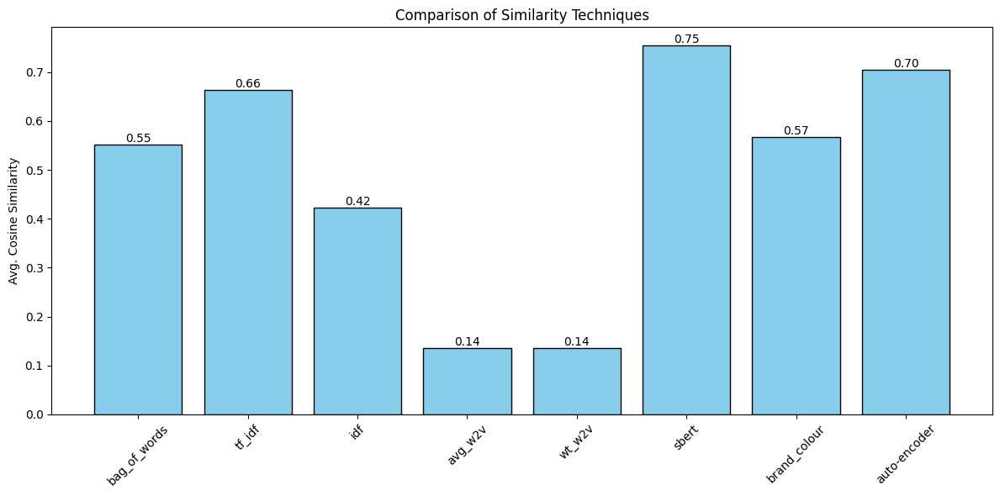

In [195]:

#  scores are stored in `scores`
objects = ['bag_of_words', 'tf_idf', 'idf', 'avg_w2v', 'wt_w2v', 'sbert', 'brand_colour', 'auto-encoder']
x_pos = np.arange(len(objects))

plt.figure(figsize=(12, 6))
bars = plt.bar(x_pos, scores, color='skyblue', edgecolor='black')
plt.xticks(x_pos, objects, rotation=45)
plt.ylabel('Avg. Cosine Similarity')
plt.title('Comparison of Similarity Techniques')

# Optional: Add value labels on top of bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()
